# Chargement des bibliothèques

In [1]:
# Importation et installation des bibliothèques nécessaires pour le projet scoring

# Bibliothèques pour la manipulation des données et les visualisations
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Outils de modélisation et de sélection des caractéristiques
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, StratifiedKFold, cross_val_predict
from sklearn.feature_selection import chi2, SelectKBest, SelectFromModel
from sklearn.linear_model import LogisticRegression, ElasticNet
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
import xgboost as xgb
from xgboost import XGBClassifier, plot_importance
import lightgbm as lgb

# Outils pour la normalisation, l'imputation, et la gestion des valeurs manquantes
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder, KBinsDiscretizer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.linear_model import BayesianRidge
from sklearn.compose import ColumnTransformer
import missingno as msno
from sklearn.utils.class_weight import compute_class_weight

# Outils pour les métriques et l'évaluation de la performance du modèle
from sklearn.metrics import recall_score, precision_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, auc, accuracy_score, f1_score
from imblearn.over_sampling import SMOTE  # Importation de SMOTE pour le traitement du déséquilibre des classes
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline  # Utilisation de ImbPipeline pour gérer les étapes du pipeline avec SMOTE
from xgboost import plot_importance

# Outils avancés pour le traitement et l'optimisation des modèles
import statsmodels.api as sm
from scipy import stats
from scipy.stats import pointbiserialr
from scipy.stats import chi2_contingency, pointbiserialr
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Autres outils supplémentaires
import shap  # Bibliothèque pour l'interprétation des modèles
import time  # Mesure du temps d'exécution des processus
from joblib import Memory  # Utilisé pour la mise en cache
from IPython.display import display  # Pour afficher des résultats dans les notebooks

# Installations nécessaires
!pip install imbalanced-learn
!pip install openpyxl

# Outils Google Colab et fichiers
from google.colab import files

# Installation et configuration de LazyPredict pour simplifier les comparaisons de modèles
!pip install git+https://github.com/shankarpandala/lazypredict.git@master
import lazypredict
# Ouvrir le code source de LazyPredict pour corriger le bug mis à jour en sparse_output=False
!sed -i 's/sparse=False/sparse_output=False/g' /usr/local/lib/python3.10/dist-packages/lazypredict/Supervised.py
from lazypredict.Supervised import LazyClassifier

import warnings
warnings.filterwarnings("ignore")

"Essential libraries loaded."

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


  Cloning https://github.com/shankarpandala/lazypredict.git (to revision master) to /tmp/pip-req-build-2kn9ywl8
  Running command git clone --filter=blob:none --quiet https://github.com/shankarpandala/lazypredict.git /tmp/pip-req-build-2kn9ywl8
  Running command git checkout -b master --track origin/master
  Switched to a new branch 'master'
  Branch 'master' set up to track remote branch 'master' from 'origin'.
  Resolved https://github.com/shankarpandala/lazypredict.git to commit 607bbaf42fe147d7530a987eaab906938b3a94da
  Preparing metadata (setup.py) ... done


'Essential libraries loaded.'

# Chargement des données

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:


# 2 options de chargement des données :

# Option 1 : Charger le fichier CSV dans un DataFrame
df = pd.read_csv("/content/drive/MyDrive/Google Collab/Sources_googlecollab/hmeq.csv") # le path de votre fichier dans Google Drive

# Option 2 : Utiliser pour télécharger un fichier depuis votre machine
# uploaded = files.upload()
# df = pd.read_csv('hmeq.csv')
# print(df.head())

# Analyse Exploratoire des Données (EDA)

Le contenu de cette section sera soutenu par un fichier HTML d'accompagnement.

In [4]:
# Afficher les 5 dernières lignes du dataframe
print(df.tail())

# Afficher les lignes du dataframe
print(df.shape)

# Afficher les colonnes du dataframe
print(df.columns)

# Afficher un résumé des informations sur le dataframe
df.info()

      BAD   LOAN  MORTDUE    VALUE   REASON    JOB   YOJ  DEROG  DELINQ  \
5955    0  88900 57264.00 90185.00  DebtCon  Other 16.00   0.00    0.00   
5956    0  89000 54576.00 92937.00  DebtCon  Other 16.00   0.00    0.00   
5957    0  89200 54045.00 92924.00  DebtCon  Other 15.00   0.00    0.00   
5958    0  89800 50370.00 91861.00  DebtCon  Other 14.00   0.00    0.00   
5959    0  89900 48811.00 88934.00  DebtCon  Other 15.00   0.00    0.00   

      CLAGE  NINQ  CLNO  DEBTINC  
5955 221.81  0.00 16.00    36.11  
5956 208.69  0.00 15.00    35.86  
5957 212.28  0.00 15.00    35.56  
5958 213.89  0.00 16.00    34.34  
5959 219.60  0.00 16.00    34.57  
(5960, 13)
Index(['BAD', 'LOAN', 'MORTDUE', 'VALUE', 'REASON', 'JOB', 'YOJ', 'DEROG',
       'DELINQ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5960 entries, 0 to 5959
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  --

In [5]:
# Identifions tout d'abord les variables numériques
numerical_variables = ["LOAN", "MORTDUE", "VALUE", "YOJ", "DEROG", "DELINQ", "CLAGE", "NINQ", "CLNO", "DEBTINC"]
# Puis les catégorielles
categorical_variables = ["REASON", "JOB"]
# La variable à prédire
Target = ["BAD"]

# Examiner le nombre de prêts par catégorie
counts = df.groupby(Target).size()
print(counts)

BAD
0    4771
1    1189
dtype: int64


In [6]:
# Afficher le nombre de valeurs uniques par variable
print("Le nombre de valeurs uniques par variable dans l'ensemble des données :\n", df.nunique())

# Afficher le nombre de doublons
print("Le nombre de doublons dans l'ensemble des données :\n",df.duplicated().sum())

# Afficher le nombre de colonnes par type
print("Le nombre de colonnes par type de variable :\n", df.dtypes.value_counts())

# Afficher le nombre unique d'entrées pour chaque colonne des variables catégorielles
print("Le nombre unique d'entrées pour chaque colonne des variables catégorielles :\n", df.select_dtypes("object").apply(pd.Series.nunique))

Le nombre de valeurs uniques par variable dans l'ensemble des données :
 BAD           2
LOAN        540
MORTDUE    5053
VALUE      5381
REASON        2
JOB           6
YOJ          99
DEROG        11
DELINQ       14
CLAGE      5314
NINQ         16
CLNO         62
DEBTINC    4693
dtype: int64
Le nombre de doublons dans l'ensemble des données :
 0
Le nombre de colonnes par type de variable :
 float64    9
int64      2
object     2
Name: count, dtype: int64
Le nombre unique d'entrées pour chaque colonne des variables catégorielles :
 REASON    2
JOB       6
dtype: int64


## Analyse descriptive univariée

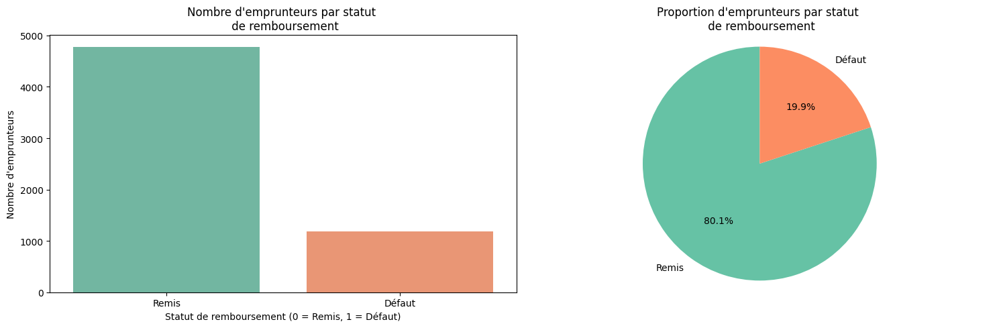

In [7]:
# Créer une figure avec 2 sous-graphes côte à côte
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Diagramme à barres
sns.barplot(x=counts.index, y=counts.values, palette='Set2', ax=axes[0])
axes[0].set_title('Nombre d\'emprunteurs par statut \n de remboursement')
axes[0].set_xlabel('Statut de remboursement (0 = Remis, 1 = Défaut)')
axes[0].set_ylabel('Nombre d\'emprunteurs')
axes[0].set_xticks([0, 1])
axes[0].set_xticklabels(['Remis', 'Défaut'])

# Diagramme en secteurs (camembert)
axes[1].pie(counts.values, labels=['Remis', 'Défaut'], autopct='%1.1f%%', startangle=90, colors=['#66c2a5', '#fc8d62'])
axes[1].set_title('Proportion d\'emprunteurs par statut \n de remboursement')
axes[1].axis('equal')

# Afficher les graphiques
plt.tight_layout()
plt.show()

On remarque que les classes sont déséquilibrés, il y'a beaucoup plus d'individus dans la classe 0 que dans la classe 1 (le ratio 80-20).

In [8]:
# Diviser les données en un ensemble d'entrainement et un ensemble de test
X = df.drop(Target, axis=1)
y = df[Target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Taille de l'ensemble d'entrainement :", X_train.shape[0])
print("Taille de l'ensemble de test :", X_test.shape[0])

Taille de l'ensemble d'entrainement : 4768
Taille de l'ensemble de test : 1192


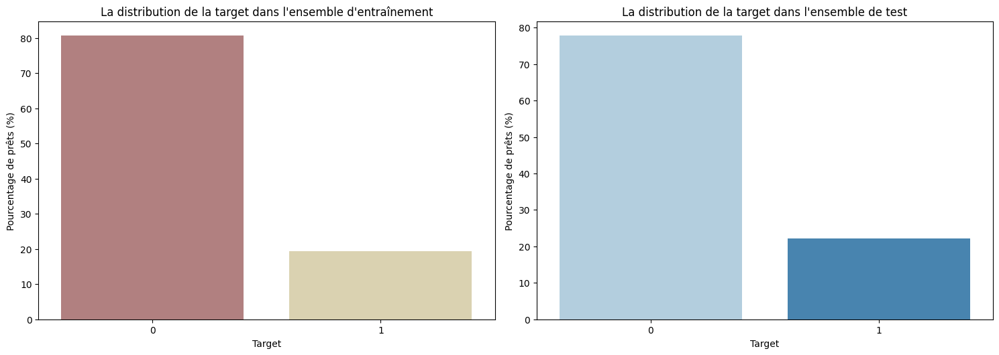

In [9]:
# Remplacer les NaN par une catégorie "Missing" pour afficher les valeurs manquantes
y_train_nan = y_train["BAD"].fillna('Missing')
y_test_nan = y_test["BAD"].fillna('Missing')

plt.figure(figsize=(15, 10))
# Premier sous-graphe pour l'ensemble d'entraînement
plt.subplot(2, 2, 1)
# Compte des valeurs dans la colonne BAD dans l'ensemble d'entrainement
bad_counts_train = y_train_nan.value_counts(normalize=True) * 100
sns.barplot(x=bad_counts_train.index,y=bad_counts_train.values, palette='pink')
plt.title("La distribution de la target dans l'ensemble d'entraînement")
plt.xlabel('Target')
plt.ylabel('Pourcentage de prêts (%)')

# Deuxième sous-graphe pour l'ensemble de test
plt.subplot(2, 2, 2)
# Compte des valeurs dans dans la colonne BAD dans l'ensemble de test
bad_counts_test = y_test_nan.value_counts(normalize=True) * 100
sns.barplot(x=bad_counts_test.index,y=bad_counts_test.values, palette='Blues')
plt.title("La distribution de la target dans l'ensemble de test")
plt.xlabel('Target')
plt.ylabel('Pourcentage de prêts (%)')

# Afficher les graphiques
plt.tight_layout()
plt.show()

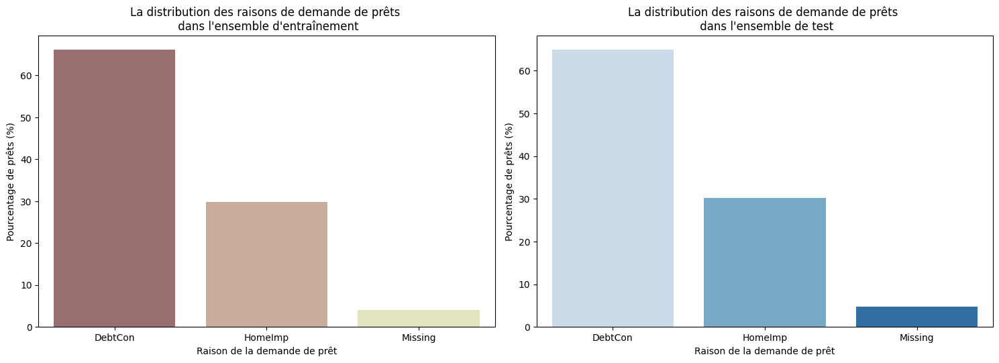

In [10]:
# Remplacer les NaN par une catégorie "Missing" pour afficher les valeurs manquantes
X_train_reason_nan = X_train['REASON'].fillna('Missing')
X_test_reason_nan = X_test['REASON'].fillna('Missing')

plt.figure(figsize=(15, 10))
# Premier sous-graphe pour l'ensemble d'entraînement
plt.subplot(2, 2, 1)
reason_counts_train = X_train_reason_nan.value_counts(normalize=True) * 100
sns.barplot(x=reason_counts_train.index, y=reason_counts_train.values, palette='pink')
plt.title("La distribution des raisons de demande de prêts \n dans l'ensemble d'entraînement")
plt.xlabel('Raison de la demande de prêt')
plt.ylabel('Pourcentage de prêts (%)')

# Deuxième sous-graphe pour l'ensemble de test
plt.subplot(2, 2, 2)
reason_counts_test = X_test_reason_nan.value_counts(normalize=True) * 100
sns.barplot(x=reason_counts_test.index, y=reason_counts_test.values, palette='Blues')
plt.title("La distribution des raisons de demande de prêts \n dans l'ensemble de test")
plt.xlabel('Raison de la demande de prêt')
plt.ylabel('Pourcentage de prêts (%)')

# Afficher les graphiques
plt.tight_layout()
plt.show()

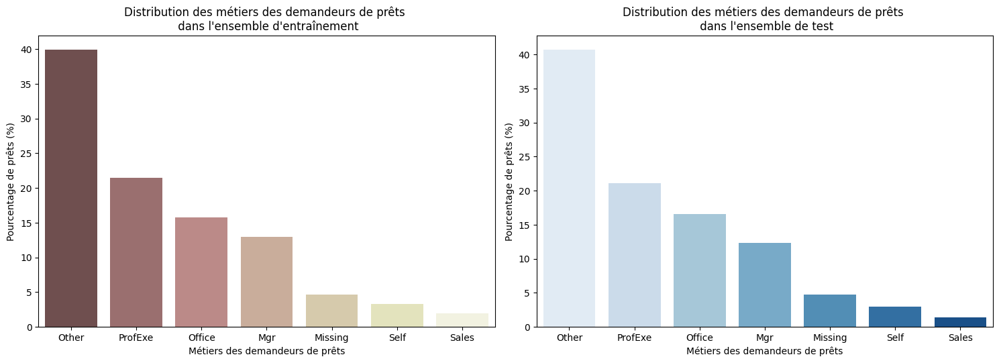

In [11]:
# Remplacer les NaN par une catégorie "Missing" pour afficher les valeurs manquantes
X_train_job_nan = X_train['JOB'].fillna('Missing')
X_test_job_nan = X_test['JOB'].fillna('Missing')

plt.figure(figsize=(15, 10))
# Premier sous-graphe pour l'ensemble d'entraînement
plt.subplot(2, 2, 1)
job_counts_train = X_train_job_nan.value_counts(normalize=True) * 100
sns.barplot(x=job_counts_train.index, y=job_counts_train.values, palette='pink')
plt.title("Distribution des métiers des demandeurs de prêts \n dans l'ensemble d'entraînement")
plt.xlabel('Métiers des demandeurs de prêts')
plt.ylabel('Pourcentage de prêts (%)')

# Deuxième sous-graphe pour l'ensemble de test
plt.subplot(2, 2, 2)
job_counts_test = X_test_job_nan.value_counts(normalize=True) * 100
sns.barplot(x=job_counts_test.index, y=job_counts_test.values, palette='Blues')
plt.title("Distribution des métiers des demandeurs de prêts \n dans l'ensemble de test")
plt.xlabel('Métiers des demandeurs de prêts')
plt.ylabel('Pourcentage de prêts (%)')

# Afficher les graphiques
plt.tight_layout()
plt.show()

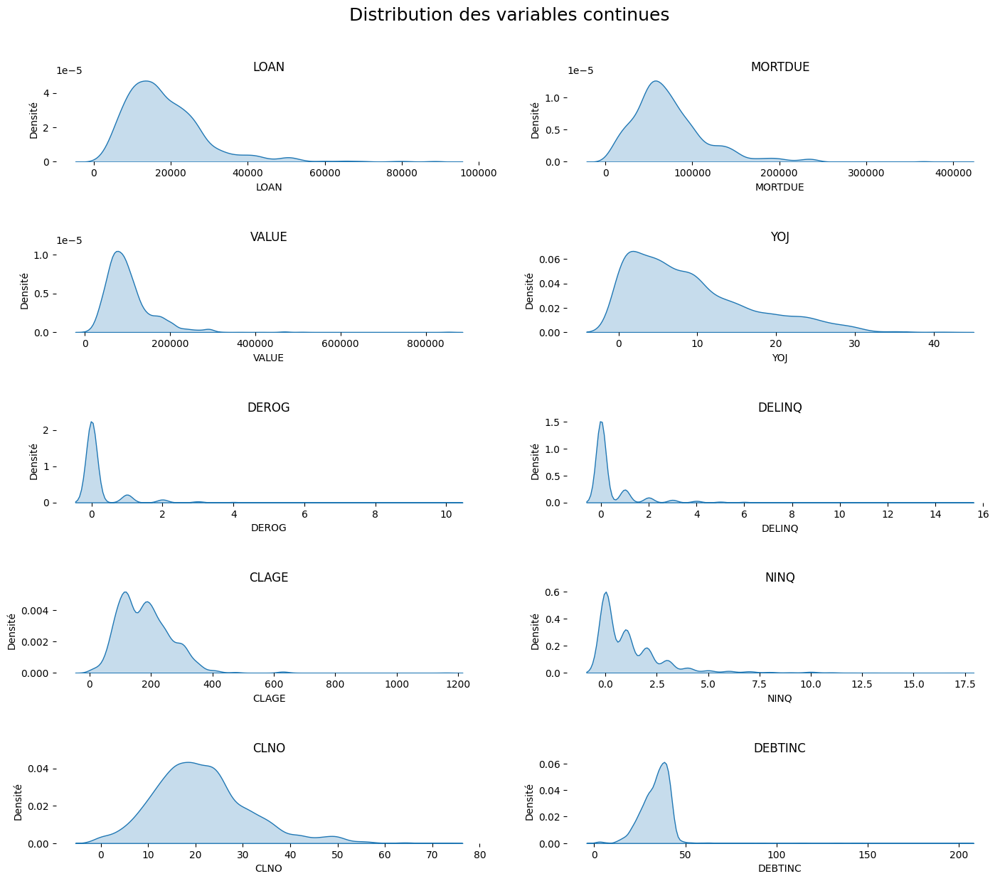

In [12]:
# Définir le nombre de colonnes et calculer le nombre de lignes nécessaires pour les sous-graphiques
ncols = 2
nrows = len(numerical_variables) // ncols + (len(numerical_variables) % ncols > 0)

# Créer une figure pour les graphiques
plt.figure(figsize=(17, 14))
plt.subplots_adjust(hspace=1)
plt.suptitle("Distribution des variables continues", fontsize=18, y=0.95)

# Boucle pour chaque variable numérique à tracer
for n, variable in enumerate(numerical_variables):
    ax = plt.subplot(nrows, ncols, n + 1)
    # Tracer la courbe de densité pour la variable actuelle
    sns.kdeplot(ax=ax, data=df[variable], legend=None, shade=True)
    # Masquer les bordures inutiles du graphique
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_title(variable, loc= 'center', fontsize=12)
    ax.set_ylabel("Densité")

# Afficher les graphiques
plt.show()

## Analyse descriptive bivariée

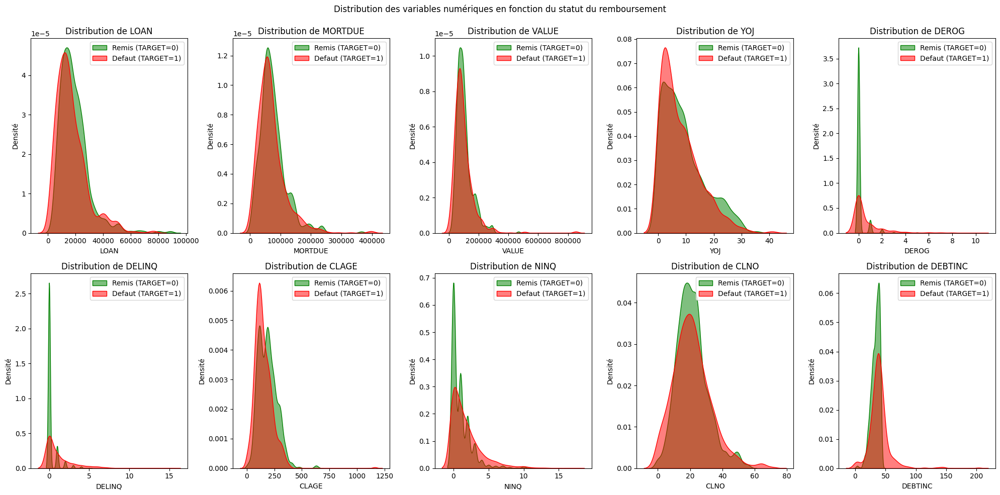

In [13]:
# Définir la taille de la figure et créer une grille de subplots 2x5
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

# Aplatir les axes pour faciliter l'itération
axes = axes.flatten()

# Boucle sur chaque variable et chaque axe pour afficher les distributions par TARGET
for i, col in enumerate(df[numerical_variables].columns):
    # Courbes KDE avec transparence
    sns.kdeplot(df[col][df["BAD"] == 0], label='Remis (TARGET=0)', color='green', shade=True, ax=axes[i], alpha=0.5)
    sns.kdeplot(df[col][df["BAD"] == 1], label='Defaut (TARGET=1)', color='red', shade=True, ax=axes[i], alpha=0.5)

    # Ajouter le titre pour chaque subplot
    axes[i].set_title(f'Distribution de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Densité')

    # Ajouter la légende pour chaque subplot, avec position personnalisée
    axes[i].legend(loc='upper right', fontsize=10)

# Ajouter un titre général pour la figure
plt.suptitle('Distribution des variables numériques en fonction du statut du remboursement')

# Afficher les graphiques
plt.tight_layout()
plt.show()

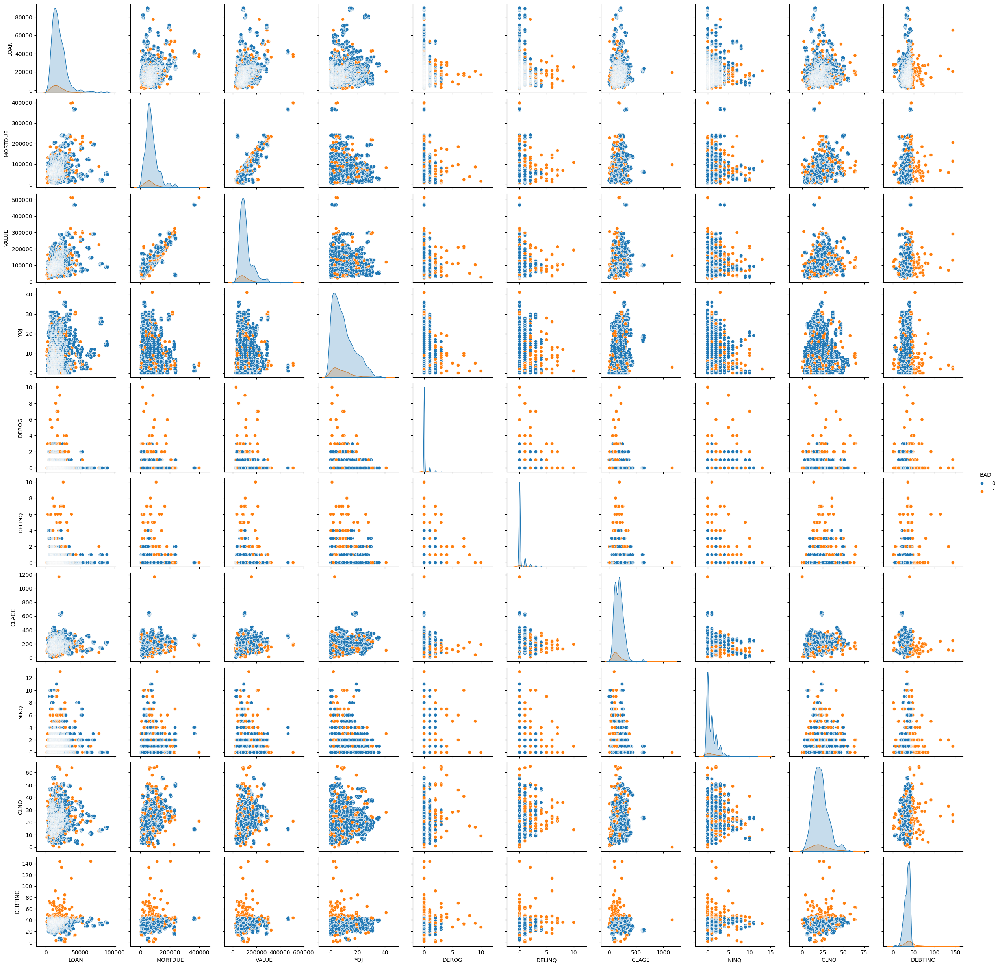

In [14]:
# Sélectionner les colonnes numériques
numeric_columns = ['LOAN', 'MORTDUE', 'VALUE', 'YOJ', 'DEROG', 'DELINQ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC']

# Traiter les valeurs manquantes en supprimant les lignes contenant des valeurs manquantes (ou vous pouvez choisir une autre méthode)
df_cleaned = df[numeric_columns + ['BAD']].dropna()

# Créer un pairplot
sns.pairplot(df_cleaned, hue='BAD', diag_kind='kde')

# Afficher le graphique
plt.show()

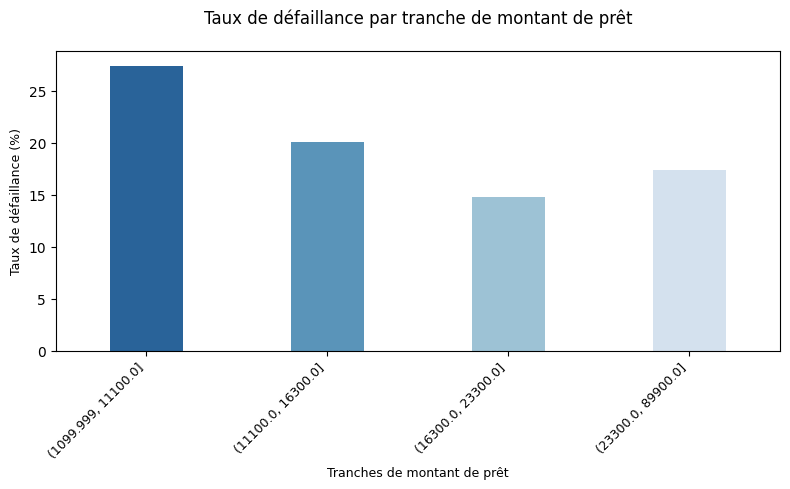

In [15]:
# Utiliser une copie temporaire du dataset pour éviter de modifier l'original
hmeq_temp = df.copy()

# Créer des bins pour la variable LOAN
hmeq_temp['LOAN_BIN'] = pd.qcut(hmeq_temp['LOAN'], q=4)

# Calculer le taux de défaillance pour chaque bin de LOAN
default_rate = hmeq_temp.groupby('LOAN_BIN')['BAD'].mean() * 100

# Tracer le graphique
plt.figure(figsize=(8, 5))
sns.barplot(x=default_rate.index.astype(str), y=default_rate.values, palette='Blues_r', width=0.4)

# Ajouter le titre et les labels
plt.title('Taux de défaillance par tranche de montant de prêt', fontsize=12, pad=20)
plt.xlabel('Tranches de montant de prêt', fontsize=9)
plt.ylabel('Taux de défaillance (%)', fontsize=9)

# Ajuster les labels de l'axe des x
plt.xticks(rotation=45, ha='right', fontsize=9)

# Afficher le graphique
plt.tight_layout()
plt.show()

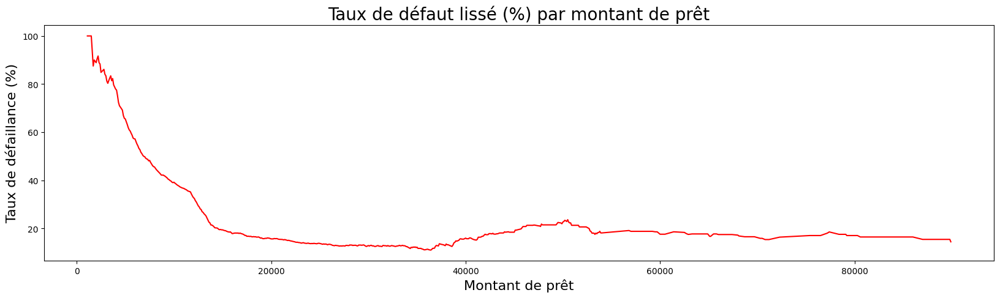

In [16]:
# Trier les données par montant de prêt pour assurer des lignes lisses
hmeq_sorted = df.sort_values(by='LOAN')

# Grouper par montant de prêt et calculer le taux de défaut (BAD = 1)
default_rate = hmeq_sorted.groupby('LOAN')['BAD'].mean() * 100

# Appliquer une moyenne mobile pour lisser la courbe (ajuster la taille de la fenêtre si nécessaire)
default_rate_smoothed = default_rate.rolling(window=100, min_periods=1).mean()  # window=100 fait la moyenne sur 100 valeurs de prêt

# Créer un graphique linéaire pour le taux de défaut lissé
plt.figure(figsize=(20, 5))
sns.lineplot(x=default_rate_smoothed.index, y=default_rate_smoothed.values, color='red')

# Définir le titre et les étiquettes des axes
plt.title('Taux de défaut lissé (%) par montant de prêt', fontsize=20)
plt.xlabel('Montant de prêt', fontsize=16)
plt.ylabel('Taux de défaillance (%)', fontsize=16)

# Définir le thème pour un aspect épuré
sns.set_theme(style='white', font_scale=1.5)

plt.show()

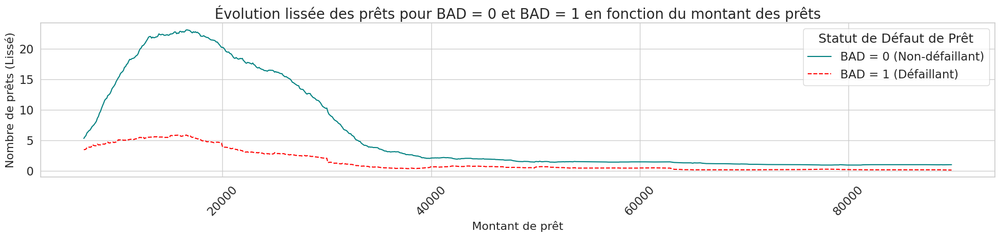

In [17]:
# Trier les données par montant de prêt
hmeq_sorted = df.sort_values(by='LOAN')

# Grouper par LOAN et statut BAD, puis compter les occurrences de chaque statut de prêt
bad_counts = hmeq_sorted.groupby(['LOAN', 'BAD']).size().unstack(fill_value=0)

# Appliquer une moyenne mobile pour lisser les données (la taille de la fenêtre peut être ajustée)
bad_counts['BAD_0_smooth'] = bad_counts[0].rolling(window=50).mean()
bad_counts['BAD_1_smooth'] = bad_counts[1].rolling(window=50).mean()

# Définir le style du graphique
sns.set_style("whitegrid")

# Créer un graphique avec des lignes lissées
plt.figure(figsize=(20, 5))

# Tracer pour BAD = 0
sns.lineplot(x=bad_counts.index, y=bad_counts['BAD_0_smooth'], label='BAD = 0 (Non-défaillant)', linestyle='solid', color='teal')

# Tracer pour BAD = 1
sns.lineplot(x=bad_counts.index, y=bad_counts['BAD_1_smooth'], label='BAD = 1 (Défaillant)', linestyle='dashed', color='red')

# Définir le titre et les étiquettes des axes
plt.title('Évolution lissée des prêts pour BAD = 0 et BAD = 1 en fonction du montant des prêts', fontsize=20)
plt.xlabel('Montant de prêt', fontsize=16)
plt.ylabel('Nombre de prêts (Lissé)', fontsize=16)

# Ajuster les graduations de l'axe x
plt.xticks(rotation=45)

# Afficher la légende
plt.legend(title='Statut de Défaut de Prêt')

# Afficher le graphique
plt.tight_layout()
plt.show()

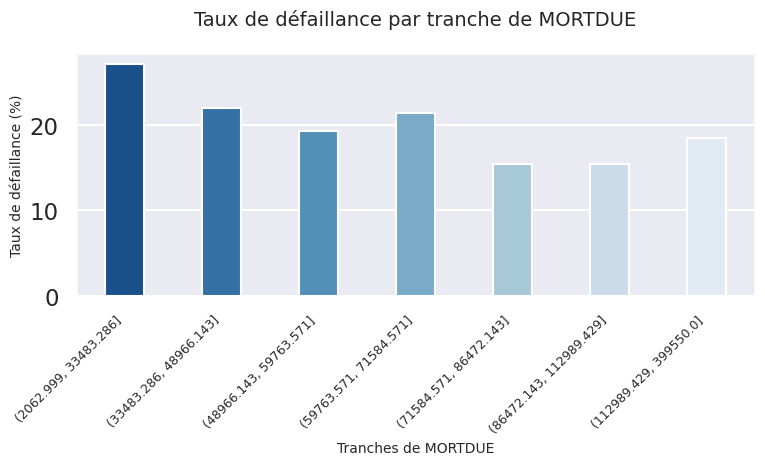

In [18]:
# Définir le style du graphique
sns.set(style="darkgrid", context="talk")

# Utiliser une copie temporaire pour ne pas modifier l'original
hmeq_temp = df.copy()

# Créer des bins pour la variable MORTDUE (par quantiles)
hmeq_temp['MORTDUE_BIN'] = pd.qcut(hmeq_temp['MORTDUE'], q=7)

# Calculer le taux de défaillance (pourcentage de BAD = 1) pour chaque bin de MORTDUE
taux_defaillance = hmeq_temp.groupby('MORTDUE_BIN')['BAD'].mean() * 100

# Créer un graphique en barres pour le taux de défaillance dans chaque bin
plt.figure(figsize=(8, 5))
sns.barplot(x=taux_defaillance.index.astype(str), y=taux_defaillance.values, palette='Blues_r', width=0.4)

# Ajouter un titre et des étiquettes en français
plt.title('Taux de défaillance par tranche de MORTDUE', fontsize=14, pad=20)
plt.xlabel('Tranches de MORTDUE', fontsize=10)
plt.ylabel('Taux de défaillance (%)', fontsize=10)

# Faire pivoter les étiquettes de l'axe x pour une meilleure lisibilité
plt.xticks(rotation=45, ha='right', fontsize=9)

# Ajuster la mise en page
plt.tight_layout()

# Afficher le graphique
plt.show()

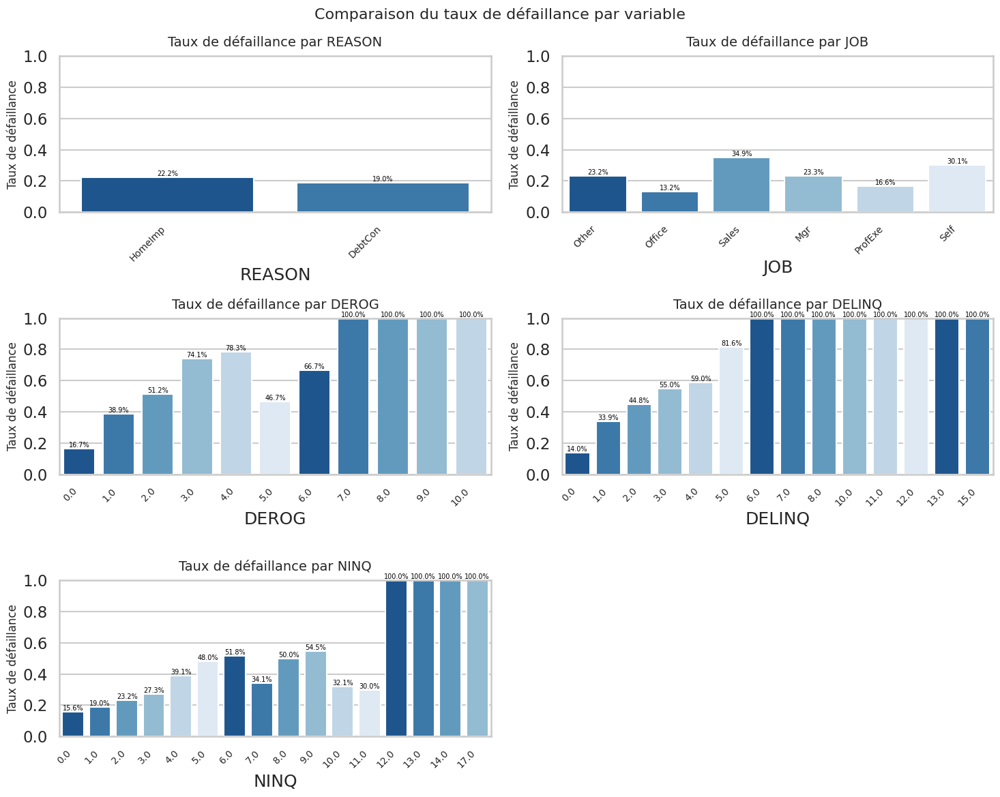

In [19]:
# Variables à utiliser pour le graphique
variables = ['REASON', 'JOB', 'DEROG', 'DELINQ', 'NINQ']

plt.figure(figsize=(15,12))

# Définir un style plus esthétique
sns.set_style("whitegrid")

# Palette de couleurs plus harmonieuse
palette = sns.color_palette("Blues_r")

# Créer les sous-graphes pour chaque variable
for i, col in enumerate(variables):
    plt.subplot(3, 2, i + 1)

    # Créer un graphique en barres pour chaque variable
    ax = sns.barplot(x=col, y="BAD", data=df, palette=palette, errorbar=None)

    # Titre pour chaque sous-graphe
    plt.title(f"Taux de défaillance par {col}", fontsize=14, pad=10)

    # Etiquettes de l'axe y
    plt.ylabel("Taux de défaillance", fontsize=12)

    # Limiter l'axe y entre 0 et 1
    plt.ylim(0, 1)

    # Améliorer les étiquettes de l'axe x avec une rotation et une taille de police ajustée
    plt.xticks(rotation=45, ha='right', fontsize=10)

    # Ajouter les annotations pour chaque barre
    for p in ax.patches:
        hauteur = p.get_height() * 100
        ax.annotate(f"{hauteur:.1f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=7, color='black')

# Ajuster la mise en page pour éviter les chevauchements
plt.tight_layout()
plt.subplots_adjust(top=0.92)

# Ajouter un titre global pour tous les sous-graphiques
plt.suptitle("Comparaison du taux de défaillance par variable", fontsize=16)

# Afficher le graphique
plt.show()

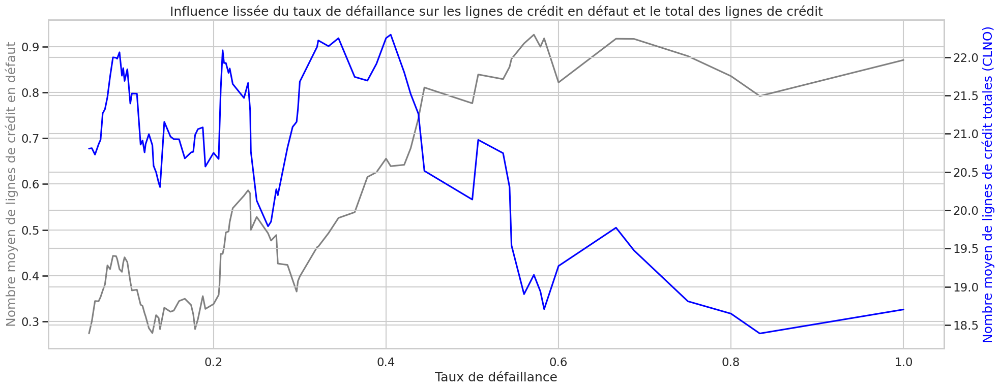

In [20]:
df_copy = df.copy()
# Calculer le taux de défaillance (proportion de BAD = 1)
df_copy['default_rate'] = df_copy.groupby('LOAN')['BAD'].transform('mean')

# Grouper par taux de défaillance et calculer la moyenne de DELINQ et CLNO
grouped_data = df_copy.groupby('default_rate')[['DELINQ', 'CLNO']].mean().reset_index()

# Appliquer une moyenne mobile pour lisser les données (ajuster la taille de la fenêtre pour plus ou moins de lissage)
grouped_data['DELINQ_smoothed'] = grouped_data['DELINQ'].rolling(window=10).mean()
grouped_data['CLNO_smoothed'] = grouped_data['CLNO'].rolling(window=10).mean()

# Définir le style du graphique
sns.set_style("whitegrid")

# Initialiser le graphique avec deux axes y
fig, ax1 = plt.subplots(figsize=(20, 8))

# Tracer DELINQ lissé sur l'axe y principal
sns.lineplot(data=grouped_data, x='default_rate', y='DELINQ_smoothed', ax=ax1, color="grey")
ax1.set_ylabel('Nombre moyen de lignes de crédit en défaut', color='grey')
ax1.set_xlabel('Taux de défaillance')

# Créer l'axe y secondaire
ax2 = ax1.twinx()
sns.lineplot(data=grouped_data, x='default_rate', y='CLNO_smoothed', ax=ax2, color='blue')
ax2.set_ylabel('Nombre moyen de lignes de crédit totales (CLNO)', color='blue')

# Ajouter le titre
plt.title('Influence lissée du taux de défaillance sur les lignes de crédit en défaut et le total des lignes de crédit')

# Afficher le graphique
plt.tight_layout()
plt.show()

# Quels modèles ont du potentiel ?

En pratique, le choix des modèles constitue l'une des tâches qui exige non seulement une expertise technique, mais aussi une solide connaissance du métier. Ainsi, déterminer quel modèle adopter de manière éclairée est un défi considérable. Cependant, avec l'évolution des bibliothèques disponibles, il est désormais possible d'évaluer rapidement et de sélectionner certains candidats les plus pertinents en fonction de la métrique choisie (dans notre cas, le recall). Pour ce faire, j'ai utilisé la bibliothèque LazyPredict, qui permet une comparaison préliminaire efficace des performances de différents modèles.

Un autre facteur crucial dans la sélection des modèles est le temps d'exécution. Cet aspect est souvent négligé dans un cadre académique, mais dans la réalité des entreprises, celles-ci sont prêtes à sacrifier quelques points de performance en échange d'une exécution plus rapide et d'une stabilité accrue. En effet, la facilité de déploiement est primordiale, et un modèle léger, rapide et performant de manière stable est souvent préféré. Par conséquent, le modèle retenu doit non seulement optimiser la métrique choisie, mais aussi présenter un temps d'exécution raisonnable.

Une fois que les modèles candidats ont été identifiés, nous approfondissons ensuite chaque modèle en vue de les optimiser davantage pour obtenir les meilleures performances possibles.

**Attention :**

- Il est important de noter que la bibliothèque LazyPredict adopte une approche extrêmement simplifiée et minimale pour le traitement des données, dont le seul but est de permettre au modèle de s'exécuter sans véritable optimisation des étapes de preprocessing comme nous le faisons manuellement. Nous savons que différents types de prétraitement conduisent à des résultats différents. Par conséquent, l'idée est d'utiliser les résultats de LazyPredict comme une base de comparaison "par défaut", puis de voir comment l'optimisation manuelle des étapes de preprocessing avec différentes techniques impacte les métriques de performance ainsi que le temps d'exécution.

- Sur le plan technique, dans la bibliothèque LazyPredict :

  + Les variables numériques sont traitées via un pipeline en deux étapes : SimpleImputer (strategy="mean") et StandardScaler.

  + Les variables catégorielles avec une faible cardinalité (peu de modalités distinctes) sont traitées par un pipeline comprenant : SimpleImputer (strategy="constant", fill_value="missing") pour remplir les valeurs manquantes avec la chaîne de caractères "missing", suivi de OneHotEncoder.

  + Les données catégorielles avec une haute cardinalité (beaucoup de modalités distinctes) sont traitées différemment avec un pipeline utilisant : SimpleImputer (strategy="constant", fill_value="missing") pour remplacer les valeurs manquantes par "missing", puis OrdinalEncoder.

  + Le seuil de distinction entre haute et basse cardinalité est fixé à 11 modalités.

- On peut observer qu'avec un tel prétraitement simplifié, la bibliothèque présente une faiblesse majeure : elle ne fait pas de distinction claire entre les variables ordinales et nominales.

- Lien Github de LazyPredict: https://github.com/shankarpandala/lazypredict/

- La variable « MORTDUE » a été supprimée de l'ensemble de données utilisé dans cette section en raison d'une forte corrélation avec la variable « VALEUR ». Nous choisissons de conserver la variable avec un plus petit nombre de valeurs manquantes qui est « VALEUR ».


In [21]:
# models_par_defaut : les données entrées ne sont pas encore prétraitées, le modèle traité de manière basique et automatique par la bibliothèque LazyPredict

# La variable cible est la colonne BAD, le dataframe utilisé est df
y = df['BAD']

# Les variables d'entrée sont toutes les autres variables sauf BAD
X = df.drop(columns=['BAD', 'MORTDUE'])

# Diviser les données en un ensemble d'entraînement et un ensemble de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Utiliser LazyClassifier pour entraîner plusieurs modèles
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=recall_score)
models_par_defaut, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models_par_defaut.columns)

# Afficher les résultats de tous les modèles
columns_to_keep = ['F1 Score', 'recall_score', 'Time Taken']
filtered_models_par_defaut = models_par_defaut[columns_to_keep]
display(filtered_models_par_defaut)

100%|██████████| 31/31 [00:07<00:00,  4.16it/s]

[LightGBM] [Info] Number of positive: 924, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1199
[LightGBM] [Info] Number of data points in the train set: 4768, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.193792 -> initscore=-1.425557
[LightGBM] [Info] Start training from score -1.425557
Index(['Accuracy', 'Balanced Accuracy', 'ROC AUC', 'F1 Score', 'recall_score',
       'Time Taken'],
      dtype='object')


,F1 Score,recall_score,Time Taken
Model,,,
XGBClassifier,0.92,0.76,0.25
ExtraTreesClassifier,0.93,0.74,0.74
LGBMClassifier,0.92,0.76,0.20
LabelPropagation,0.93,0.72,1.00
LabelSpreading,0.93,0.72,1.41
RandomForestClassifier,0.92,0.71,0.91
BaggingClassifier,0.89,0.66,0.46
DecisionTreeClassifier,0.87,0.67,0.13
AdaBoostClassifier,0.88,0.63,0.48


In [22]:
# models_after_outlier_removal : les données après le traitement des outliers seront passées à la bibliothèque pour traitement

def remove_outliers_iqr(df, features, threshold=1.5):
    """
    Cette fonction utilise l'IQR pour détecter et supprimer les outliers.
    Le seuil par défaut est de 1,5 pour l'IQR (modifiable).

    Args:
    - df: DataFrame initial
    - features: liste des colonnes à vérifier pour les outliers
    - threshold: valeur seuil de l'IQR pour la détection des outliers

    Returns:
    - df_cleaned: DataFrame après suppression des outliers
    """
    df_cleaned = df.copy()

    for col in features:
        # Calcul de l'IQR
        Q1 = df_cleaned[col].quantile(0.25)
        Q3 = df_cleaned[col].quantile(0.75)
        IQR = Q3 - Q1

        # Définir les seuils inférieurs et supérieurs
        lower_bound = Q1 - threshold * IQR
        upper_bound = Q3 + threshold * IQR

        # Conserver les valeurs qui ne sont pas des outliers
        df_cleaned = df_cleaned[(df_cleaned[col] >= lower_bound) & (df_cleaned[col] <= upper_bound)]

    return df_cleaned

# Sélection des variables numériques continues et des variables catégorielles (exclusion des variables MORTDUE et de la variable cible BAD)
X = df.drop(columns=['BAD', 'MORTDUE'])  # Exclusion de la variable MORTDUE
y = df['BAD']

# Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Appliquer la fonction remove_outliers_iqr pour supprimer les outliers des variables numériques
X_cleaned_numeric = remove_outliers_iqr(X[continuous_vars], continuous_vars)

# Combiner à nouveau le DataFrame avec les variables catégorielles
X_cleaned = pd.concat([X_cleaned_numeric, X[ordinal_vars], X[categorical_vars]], axis=1)

# Après le traitement des outliers, diviser l'ensemble d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_cleaned, y, test_size=0.2, random_state=42)

# Utiliser LazyClassifier pour entraîner plusieurs modèles
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=recall_score)
models_after_outlier_removal, predictions = clf.fit(X_train, X_test, y_train, y_test)

# Afficher les résultats de tous les modèles
columns_to_keep = ['F1 Score', 'recall_score', 'Time Taken']
filtered_models_after_outlier_removal = models_after_outlier_removal[columns_to_keep]
display(filtered_models_after_outlier_removal)

100%|██████████| 31/31 [00:06<00:00,  4.93it/s]

[LightGBM] [Info] Number of positive: 924, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1147
[LightGBM] [Info] Number of data points in the train set: 4768, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.193792 -> initscore=-1.425557
[LightGBM] [Info] Start training from score -1.425557


,F1 Score,recall_score,Time Taken
Model,,,
Perceptron,0.72,0.24,0.05
LGBMClassifier,0.73,0.12,0.14
ExtraTreeClassifier,0.71,0.21,0.03
DecisionTreeClassifier,0.71,0.21,0.09
GaussianNB,0.70,0.23,0.03
AdaBoostClassifier,0.72,0.08,0.31
BaggingClassifier,0.71,0.11,0.25
XGBClassifier,0.71,0.11,0.15
RandomForestClassifier,0.70,0.09,0.77


Pour les modèles basé sur un arbre de décision tel que Random Forest, XGBoost ou LightGBM, nous pouvons laisser les valeurs de la variable ordinale inchangées sans autre traitement.

Pour les modèles basés sur la distance tels que la régression logistique, les K-Nearest Neighbours (KNN), SVM ou la régression linéaire, la normalisation des variables ordinales peut être utile.


In [23]:
# models_optimised_preprocessing : les données passées ont été traitées par la meilleure combinaison d' étapes de preprocessing pour le modèle Logistic Regression, et la métrique 'recall' (via GridSearchCV)
# L'objectif ici est de comparer l'effet des différentes étapes de preprocessing sur chaque type de modèle et de voir comment les performances changent

# La variable cible est la colonne BAD, le dataframe utilisé est df
y = df['BAD']

# Les variables d'entrée sont toutes les autres variables sauf BAD
X = df.drop(columns=['BAD', 'MORTDUE'])

# Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Diviser les données en un ensemble d'entraînement et un ensemble de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer un préprocesseur avec les étapes spécifiées
preprocessor = ColumnTransformer(
    transformers=[
        ('continuous', Pipeline(steps=[
            ('imputer', IterativeImputer(estimator=BayesianRidge())),  # Imputation cho biến continuous
            ('scaler', StandardScaler())  # Normalization cho biến continuous
        ]), continuous_vars),  # Áp dụng cho biến continuous

        ('categorical', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputation cho biến categorical
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Mã hóa one-hot
        ]), categorical_vars),  # Áp dụng cho biến categorical

        ('ordinal', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent'))  # Imputation cho biến ordinal
        ]), ordinal_vars)  # Áp dụng cho biến ordinal và không có scaler
    ]
)

# Appliquer le préprocesseur pour traiter les données
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Convertir en DataFrame pour éviter des erreurs
X_train_processed = pd.DataFrame(X_train_processed)
X_test_processed = pd.DataFrame(X_test_processed)

# Utiliser LazyClassifier pour entraîner plusieurs modèles après le traitement des données
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=recall_score)

# Entraîner plusieurs modèles
models_optimised_preprocessing, predictions = clf.fit(X_train_processed, X_test_processed, y_train, y_test)

# Afficher les résultats de tous les modèles
columns_to_keep = ['F1 Score', 'recall_score', 'Time Taken']
filtered_models_optimised_preprocessing = models_optimised_preprocessing[columns_to_keep]
display(filtered_models_optimised_preprocessing)

100%|██████████| 31/31 [00:08<00:00,  3.87it/s]

[LightGBM] [Info] Number of positive: 924, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1756
[LightGBM] [Info] Number of data points in the train set: 4768, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.193792 -> initscore=-1.425557
[LightGBM] [Info] Start training from score -1.425557


,F1 Score,recall_score,Time Taken
Model,,,
ExtraTreesClassifier,0.93,0.70,0.73
LabelPropagation,0.92,0.71,1.23
LabelSpreading,0.92,0.71,2.05
LGBMClassifier,0.91,0.69,0.17
XGBClassifier,0.91,0.68,0.17
RandomForestClassifier,0.91,0.65,1.02
DecisionTreeClassifier,0.87,0.64,0.14
ExtraTreeClassifier,0.86,0.61,0.03
BaggingClassifier,0.88,0.56,0.54


**SMOTE (Synthetic Minority Over-sampling Technique)**

SMOTE est une technique utilisée pour traiter les problèmes de déséquilibre des classes dans les jeux de données de classification. Il est particulièrement utile lorsqu'on a une classe minoritaire avec beaucoup moins d'exemples que la classe majoritaire. Ce déséquilibre peut entraîner un biais dans les modèles de machine learning, car ils peuvent préférer la classe majoritaire.

L'idée de SMOTE est de générer des exemples synthétiques pour la classe minoritaire, plutôt que de simplement dupliquer les exemples existants. Cela permet de rendre les modèles moins biaisés tout en améliorant la généralisation.

Voici les étapes du fonctionnement de SMOTE :

- **Sélection des échantillons minoritaires** : SMOTE commence par sélectionner un échantillon aléatoire dans la classe minoritaire.

- **Recherche des k plus proches voisins** : Ensuite, il identifie les k plus proches voisins de cet échantillon dans l’espace des caractéristiques. Les plus proches voisins sont les échantillons minoritaires les plus proches en termes de distance (souvent basée sur la distance euclidienne).

- **Génération d'exemples synthétiques** : SMOTE crée un nouvel exemple synthétique en choisissant l’un des k voisins proches et en interpolant linéairement entre l’échantillon sélectionné et son voisin proche. La nouvelle observation se trouve sur la ligne entre ces deux points, avec une certaine proportion aléatoire.


Après l'étape de preprocessing optimale en haut pour le modèle de régression logistique, la performance de 'Recall' reste très faible. Il est nécessaire d'utiliser la technique SMOTE qui supporte la classe minoritaire '1'.

In [24]:
# models_with_smote : SMOTE aide à promouvoir l'apprentissage des classes de données minoritaires
# La variable cible est la colonne BAD, le dataframe utilisé est df
y = df['BAD']

# Les variables d'entrée sont toutes les autres variables sauf BAD
X = df.drop(columns=['BAD', 'MORTDUE'])

# Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Diviser les données en un ensemble d'entraînement et un ensemble de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer un préprocesseur avec les étapes spécifiées
preprocessor = ColumnTransformer(
    transformers=[
        ('continuous', Pipeline(steps=[
            ('imputer', IterativeImputer(estimator=BayesianRidge())),  # Imputation cho biến continuous
            ('scaler', StandardScaler())  # Normalization cho biến continuous
        ]), continuous_vars),  # Áp dụng cho biến continuous

        ('categorical', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputation cho biến categorical
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Mã hóa one-hot
        ]), categorical_vars),  # Áp dụng cho biến categorical

        ('ordinal', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent'))  # Imputation cho biến ordinal
        ]), ordinal_vars)  # Áp dụng cho biến ordinal và không có scaler
    ]
)

# Créer un pipeline avec SMOTE et le préprocesseur
smote_pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42))  # Ajouter SMOTE ici
])

# Appliquer le smote_pipeline pour traiter les données
X_train_processed, y_train_resampled = smote_pipeline.fit_resample(X_train, y_train)
X_test_processed = preprocessor.transform(X_test)

# Convertir en DataFrame pour éviter des erreurs
X_train_processed = pd.DataFrame(X_train_processed)
X_test_processed = pd.DataFrame(X_test_processed)

# Utiliser LazyClassifier pour entraîner plusieurs modèles après le traitement des données et SMOTE
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=recall_score)

# Entraîner plusieurs modèles
models_with_smote, predictions = clf.fit(X_train_processed, X_test_processed, y_train_resampled, y_test)

# Afficher les résultats de tous les modèles
columns_to_keep = ['F1 Score', 'recall_score', 'Time Taken']
filtered_models_with_smote = models_with_smote[columns_to_keep]
display(filtered_models_with_smote)

 97%|█████████▋| 30/31 [00:16<00:00,  2.20it/s]

[LightGBM] [Info] Number of positive: 3844, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3598
[LightGBM] [Info] Number of data points in the train set: 7688, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


100%|██████████| 31/31 [00:17<00:00,  1.80it/s]


,F1 Score,recall_score,Time Taken
Model,,,
ExtraTreesClassifier,0.95,0.80,0.67
XGBClassifier,0.93,0.80,0.32
RandomForestClassifier,0.93,0.79,1.44
LabelPropagation,0.94,0.78,2.19
LabelSpreading,0.94,0.78,5.00
KNeighborsClassifier,0.93,0.77,0.06
LGBMClassifier,0.91,0.74,0.28
BaggingClassifier,0.91,0.71,0.53
ExtraTreeClassifier,0.88,0.70,0.02


,F1 Score (par_defaut),recall_score (par_defaut),Time Taken (par_defaut),F1 Score (after_outlier_removal),recall_score (after_outlier_removal),Time Taken (after_outlier_removal),F1 Score (optimised_preprocessing),recall_score (optimised_preprocessing),Time Taken (optimised_preprocessing),F1 Score (with_smote),recall_score (with_smote),Time Taken (with_smote)
Model,,,,,,,,,,,,
AdaBoostClassifier,0.88,0.63,0.48,0.72,0.08,0.31,0.83,0.48,0.39,0.80,0.63,0.58
BaggingClassifier,0.89,0.66,0.46,0.71,0.11,0.25,0.88,0.56,0.54,0.91,0.71,0.53
BernoulliNB,0.80,0.40,0.04,0.68,0.00,0.04,0.77,0.30,0.04,0.73,0.61,0.02
CalibratedClassifierCV,0.78,0.31,0.22,0.68,0.00,0.11,0.78,0.31,0.16,0.74,0.63,0.11
DecisionTreeClassifier,0.87,0.67,0.13,0.71,0.21,0.09,0.87,0.64,0.14,0.88,0.70,0.12
DummyClassifier,0.68,0.00,0.03,0.68,0.00,0.02,0.68,0.00,0.02,0.68,0.00,0.02
ExtraTreeClassifier,0.87,0.64,0.04,0.71,0.21,0.03,0.86,0.61,0.03,0.88,0.70,0.02
ExtraTreesClassifier,0.93,0.74,0.74,0.70,0.11,0.51,0.93,0.70,0.73,0.95,0.80,0.67
GaussianNB,0.76,0.40,0.04,0.70,0.23,0.03,0.77,0.39,0.03,0.77,0.44,0.02


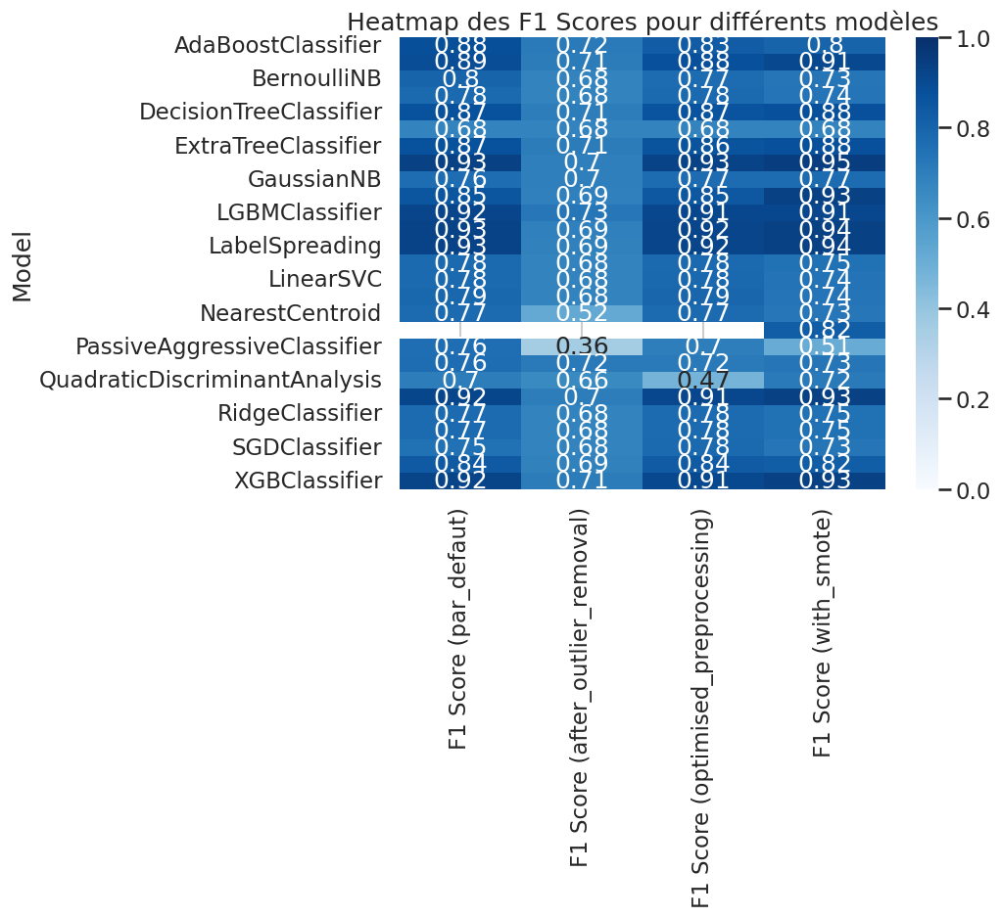

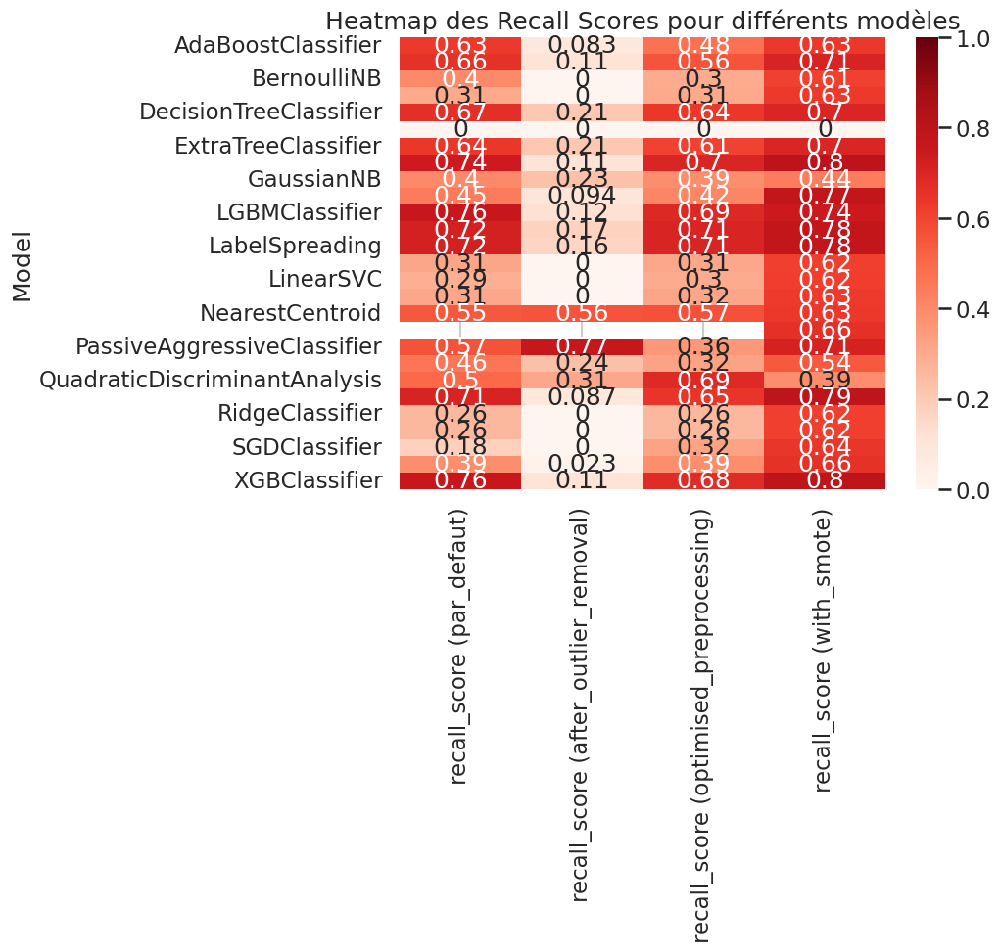

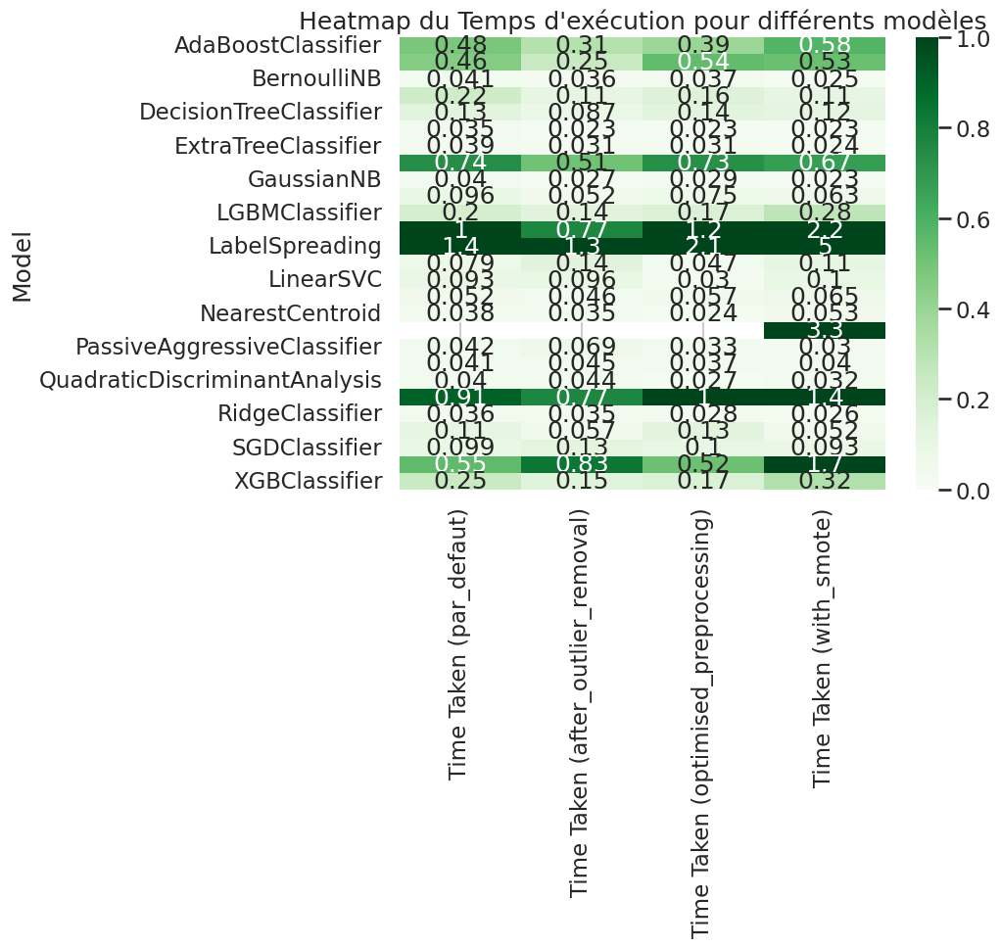

In [25]:
# Créer des DataFrames pour comparer les tables de résultats
# Liste des DataFrames que l'on a déjà (supposons qu'ils ont tous une colonne index avec les noms des modèles)
dfs = [
    filtered_models_par_defaut,
    filtered_models_after_outlier_removal,
    filtered_models_optimised_preprocessing,
    filtered_models_with_smote
]

# Donner un nom à chaque DataFrame pour faciliter l'identification dans le tableau récapitulatif
names = ['par_defaut', 'after_outlier_removal', 'optimised_preprocessing', 'with_smote']

# Pour s'assurer que les DataFrames ont tous une colonne index avec les noms des modèles, nous réinitialisons l'index
for i, result_df in enumerate(dfs):
    dfs[i] = result_df.set_index(result_df.index)

# Commencer à créer un DataFrame récapitulatif
summary_df = pd.DataFrame()

# Fusionner successivement les DataFrames ensemble dans l'ordre
for i, result_df in enumerate(dfs):
    result_df = result_df[['F1 Score', 'recall_score', 'Time Taken']].copy()

    # Renommer les colonnes pour distinguer les modèles
    result_df.columns = [f'F1 Score ({names[i]})', f'recall_score ({names[i]})', f'Time Taken ({names[i]})']

    # Fusionner le tableau avec summary_df
    if summary_df.empty:
        summary_df = result_df
    else:
        summary_df = summary_df.join(result_df, how='outer')

# Afficher le tableau récapitulatif final
display(summary_df)

# Ne garder que les colonnes F1 Score pour dessiner une heatmap
f1_columns = [col for col in summary_df.columns if 'F1 Score' in col]
recall_columns = [col for col in summary_df.columns if 'recall_score' in col]
time_taken_columns = [col for col in summary_df.columns if 'Time Taken' in col]

# Créer une heatmap avec seaborn pour les F1 Scores
plt.figure(figsize=(8, 6))
sns.heatmap(summary_df[f1_columns], annot=True, cmap='Blues', cbar=True, vmin=0, vmax=1)
plt.title('Heatmap des F1 Scores pour différents modèles')
plt.show()

# Créer une heatmap avec seaborn pour les Recall Scores
plt.figure(figsize=(8, 6))
sns.heatmap(summary_df[recall_columns], annot=True, cmap='Reds', cbar=True, vmin=0, vmax=1)
plt.title('Heatmap des Recall Scores pour différents modèles')
plt.show()

# Créer une heatmap avec seaborn pour le temps d'exécution
plt.figure(figsize=(8, 6))
sns.heatmap(summary_df[time_taken_columns], annot=True, cmap='Greens', cbar=True, vmin=0, vmax=1)
plt.title("Heatmap du Temps d'exécution pour différents modèles")
plt.show()

Un inconvénient de l'utilisation de LazyPredict est qu'il n'est pas possible de personnaliser plusieurs métriques en même temps, il n'est possible d'utiliser qu'une seule métrique personnalisée à la fois. Voici donc un code supplémentaire pour observer la valeur du ROC-AUC pour différents modèles.








100%|██████████| 31/31 [00:08<00:00,  3.77it/s]


[LightGBM] [Info] Number of positive: 924, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1199
[LightGBM] [Info] Number of data points in the train set: 4768, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.193792 -> initscore=-1.425557
[LightGBM] [Info] Start training from score -1.425557


100%|██████████| 31/31 [00:06<00:00,  4.86it/s]


[LightGBM] [Info] Number of positive: 924, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1147
[LightGBM] [Info] Number of data points in the train set: 4768, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.193792 -> initscore=-1.425557
[LightGBM] [Info] Start training from score -1.425557


100%|██████████| 31/31 [00:09<00:00,  3.38it/s]

[LightGBM] [Info] Number of positive: 924, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1756
[LightGBM] [Info] Number of data points in the train set: 4768, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.193792 -> initscore=-1.425557
[LightGBM] [Info] Start training from score -1.425557



 97%|█████████▋| 30/31 [00:16<00:00,  2.26it/s]

[LightGBM] [Info] Number of positive: 3844, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3598
[LightGBM] [Info] Number of data points in the train set: 7688, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


100%|██████████| 31/31 [00:16<00:00,  1.83it/s]


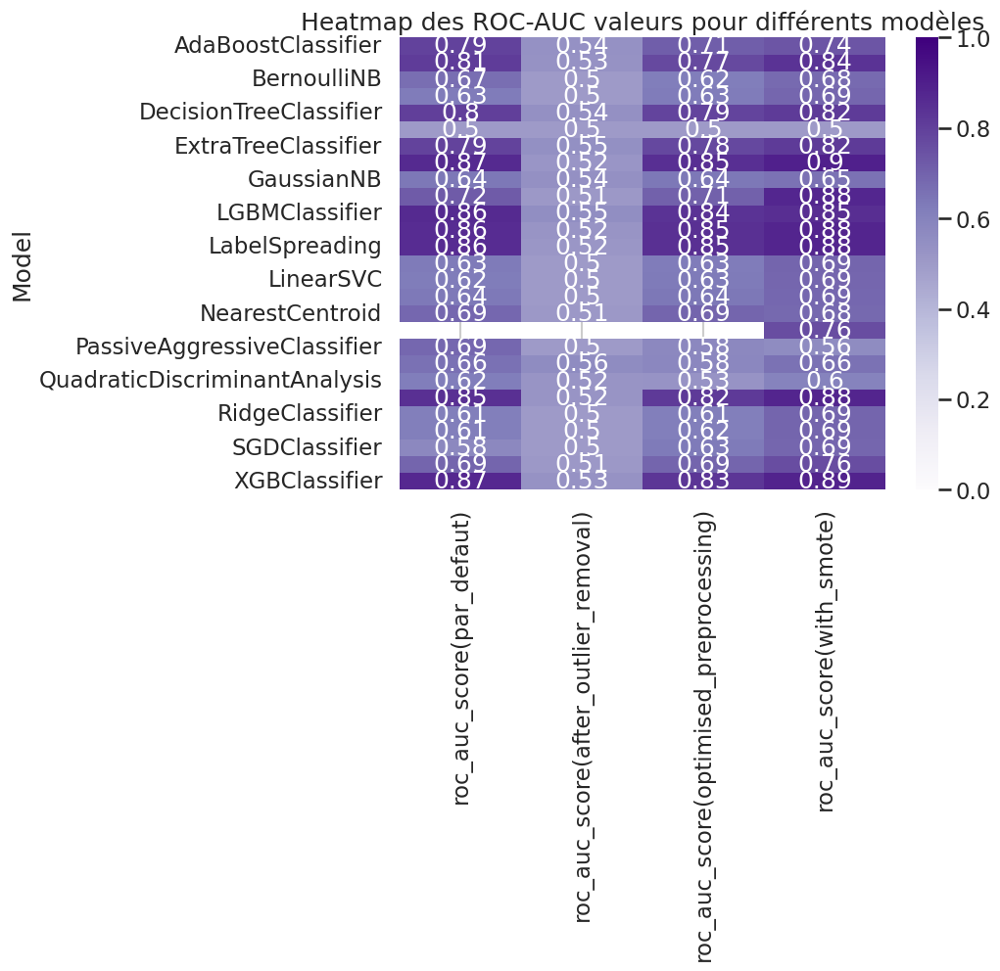

In [26]:
# models_par_defaut_auc

y = df['BAD']
X = df.drop(columns=['BAD', 'MORTDUE'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Utiliser LazyClassifier pour entraîner plusieurs modèles
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=roc_auc_score)
models_par_defaut_auc, predictions = clf.fit(X_train, X_test, y_train, y_test)
# print(models_par_defaut_auc.columns)

# Afficher les résultats de tous les modèles
columns_to_keep = ['roc_auc_score']
filtered_models_par_defaut_auc = models_par_defaut_auc[columns_to_keep]
# display(filtered_models_par_defaut_auc)

##################################################
# models_after_outlier_removal_auc

y = df['BAD']
X = df.drop(columns=['BAD', 'MORTDUE'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Appliquer la fonction remove_outliers_iqr pour supprimer les outliers des variables numériques
X_cleaned_numeric = remove_outliers_iqr(X[continuous_vars], continuous_vars)

# Combiner à nouveau le DataFrame avec les variables catégorielles
X_cleaned = pd.concat([X_cleaned_numeric, X[ordinal_vars], X[categorical_vars]], axis=1)

# Après le traitement des outliers, diviser l'ensemble d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_cleaned, y, test_size=0.2, random_state=42)

# Utiliser LazyClassifier pour entraîner plusieurs modèles
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=roc_auc_score)
models_after_outlier_removal_auc, predictions = clf.fit(X_train, X_test, y_train, y_test)

# Afficher les résultats de tous les modèles
columns_to_keep = ['roc_auc_score']
filtered_models_after_outlier_removal_auc = models_after_outlier_removal_auc[columns_to_keep]
# display(filtered_models_after_outlier_removal_auc)

###################################################
# models_optimised_preprocessing_auc

y = df['BAD']
X = df.drop(columns=['BAD', 'MORTDUE'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer un préprocesseur avec les étapes spécifiées
preprocessor = ColumnTransformer(
    transformers=[
        ('continuous', Pipeline(steps=[
            ('imputer', IterativeImputer(estimator=BayesianRidge())),  # Imputation cho biến continuous
            ('scaler', StandardScaler())  # Normalization cho biến continuous
        ]), continuous_vars),  # Áp dụng cho biến continuous

        ('categorical', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputation cho biến categorical
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Mã hóa one-hot
        ]), categorical_vars),  # Áp dụng cho biến categorical

        ('ordinal', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent'))  # Imputation cho biến ordinal
        ]), ordinal_vars)  # Áp dụng cho biến ordinal và không có scaler
    ]
)

# Appliquer le préprocesseur pour traiter les données
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Convertir en DataFrame pour éviter des erreurs
X_train_processed = pd.DataFrame(X_train_processed)
X_test_processed = pd.DataFrame(X_test_processed)

# Utiliser LazyClassifier pour entraîner plusieurs modèles après le traitement des données
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=roc_auc_score)

# Entraîner plusieurs modèles
models_optimised_preprocessing_auc, predictions = clf.fit(X_train_processed, X_test_processed, y_train, y_test)

# Afficher les résultats de tous les modèles
columns_to_keep = ['roc_auc_score']
filtered_models_optimised_preprocessing_auc = models_optimised_preprocessing_auc[columns_to_keep]
# display(models_optimised_preprocessing_auc)

###################################################
# models_with_smote_auc

y = df['BAD']
X = df.drop(columns=['BAD', 'MORTDUE'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer un pipeline avec SMOTE et le préprocesseur
smote_pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42))  # Ajouter SMOTE ici
])

# Appliquer le smote_pipeline pour traiter les données
X_train_processed, y_train_resampled = smote_pipeline.fit_resample(X_train, y_train)
X_test_processed = preprocessor.transform(X_test)

# Convertir en DataFrame pour éviter des erreurs
X_train_processed = pd.DataFrame(X_train_processed)
X_test_processed = pd.DataFrame(X_test_processed)

# Utiliser LazyClassifier pour entraîner plusieurs modèles après le traitement des données et SMOTE
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=roc_auc_score)

# Entraîner plusieurs modèles
models_with_smote_auc, predictions = clf.fit(X_train_processed, X_test_processed, y_train_resampled, y_test)

# Afficher les résultats de tous les modèles
columns_to_keep = ['roc_auc_score']
filtered_models_with_smote_auc = models_with_smote_auc[columns_to_keep]
# display(filtered_models_with_smote_auc)

###################################################

# Créer des DataFrames pour comparer les tables de résultats
# Liste des DataFrames que on a déjà (supposons qu'ils ont tous une colonne index avec les noms des modèles)
dfs = [
    filtered_models_par_defaut_auc,
    filtered_models_after_outlier_removal_auc,
    filtered_models_optimised_preprocessing_auc,
    filtered_models_with_smote_auc
]

# Donner un nom à chaque DataFrame pour faciliter l'identification dans le tableau récapitulatif
names = ['par_defaut', 'after_outlier_removal', 'optimised_preprocessing', 'with_smote']

# Pour s'assurer que les DataFrames ont tous une colonne index avec les noms des modèles, nous réinitialisons l'index
for i, result_df in enumerate(dfs):
    dfs[i] = result_df.set_index(result_df.index)

# Commencer à créer un DataFrame récapitulatif
summary_df = pd.DataFrame()

# Fusionner successivement les DataFrames ensemble dans l'ordre
for i, result_df in enumerate(dfs):
    result_df = result_df[['roc_auc_score']].copy()

    # Renommer les colonnes pour distinguer les modèles
    result_df.columns = [f'roc_auc_score({names[i]})']

    # Fusionner le tableau avec summary_df
    if summary_df.empty:
        summary_df = result_df
    else:
        summary_df = summary_df.join(result_df, how='outer')

# Afficher le tableau récapitulatif final
# display(summary_df)

roc_auc_score_columns = [col for col in summary_df.columns if 'roc_auc_score' in col]

# Créer une heatmap avec seaborn pour ROC-AUC
plt.figure(figsize=(8, 6))
sns.heatmap(summary_df[roc_auc_score_columns], annot=True, cmap='Purples', cbar=True, vmin=0, vmax=1)
plt.title('Heatmap des ROC-AUC valeurs pour différents modèles')
plt.show()


# Introduction au modèle de régression logistique

Pour commencer, nous allons implémenter un modèle de régression logistique de base, avec des méthodes de régularisation. Avant cela, une analyse statistique sera menée afin de vérifier si les hypothèses nécessaires à l'utilisation de ces modèles sont respectées. Ensuite, nous procéderons à un feature engineering, avec des approches différentes pour tester les performances des modèles :

1. **Sans feature engineering** : Utiliser les données brutes.
2. **Résolution du problème de déséquilibre des classes** : Utilisation de poids de classes (`class weights`) et de la méthode SMOTE (Synthetic Minority Over-sampling Technique).
3. **Discrétisation** : Appliquer la discrétisation en combinaison avec `class weights` et SMOTE.
4. **Création de variables combinées** : Générer des variables combinées et tester leur impact avec `class weights` et SMOTE.

Ces différentes approches permettront de mieux comprendre l'impact des transformations de données sur la performance du modèle et de déterminer quelle stratégie offre les meilleurs résultats.


In [27]:
# Diviser les données en un ensemble d'entrainement et un ensemble de test
X = df.drop(Target, axis=1)
y = df[Target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Taille de l'ensemble d'entrainement :", X_train.shape[0])
print("Taille de l'ensemble de test :", X_test.shape[0])

Taille de l'ensemble d'entrainement : 4768
Taille de l'ensemble de test : 1192


## Data Preprocessing

### Traitement des valeurs abberantes

In [28]:
# Vérifier s'il y'a des valeurs abberantes
df.describe()

,BAD,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
count,5960.00,5960.00,5442.00,5848.00,5445.00,5252.00,5380.00,5652.00,5450.00,5738.00,4693.00
mean,0.20,18607.97,73760.82,101776.05,8.92,0.25,0.45,179.77,1.19,21.30,33.78
std,0.40,11207.48,44457.61,57385.78,7.57,0.85,1.13,85.81,1.73,10.14,8.60
min,0.00,1100.00,2063.00,8000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.52
25%,0.00,11100.00,46276.00,66075.50,3.00,0.00,0.00,115.12,0.00,15.00,29.14
50%,0.00,16300.00,65019.00,89235.50,7.00,0.00,0.00,173.47,1.00,20.00,34.82
75%,0.00,23300.00,91488.00,119824.25,13.00,0.00,0.00,231.56,2.00,26.00,39.00
max,1.00,89900.00,399550.00,855909.00,41.00,10.00,15.00,1168.23,17.00,71.00,203.31


* LOAN : Les valeurs semblent cohérentes pour des montants de prêts. Le maximum (89900) est élevé mais pas nécessairement anormal.

* MORTDUE : Rien ne semble anormal à première vue.

* VALUE : Les valeurs semblent cohérentes pour des valeurs immobilières.

* YOJ (Years on Job) : Le maximum de 41 ans semble élevé mais pas impossible.

* DEROG : La moyenne (0.254570) est supérieure à la médiane (0), suggérant une distribution asymétrique, ce qui est plausible pour ce type de variable.

* DELINQ : Similaire à DEROG, distribution asymétrique mais plausible.

* CLAGE : Le maximum (1168.233561) semble très élevé pour l'âge d'une ligne de crédit. C'est potentiellement un outlier ou une erreur.

* NINQ : Les valeurs semblent plausibles.

* CLNO : Les valeurs semblent cohérentes.

* DEBTINC : Le maximum (203.312149) semble extrêmement élevé pour un ratio dette/revenu. C'est probablement un outlier ou une erreur.




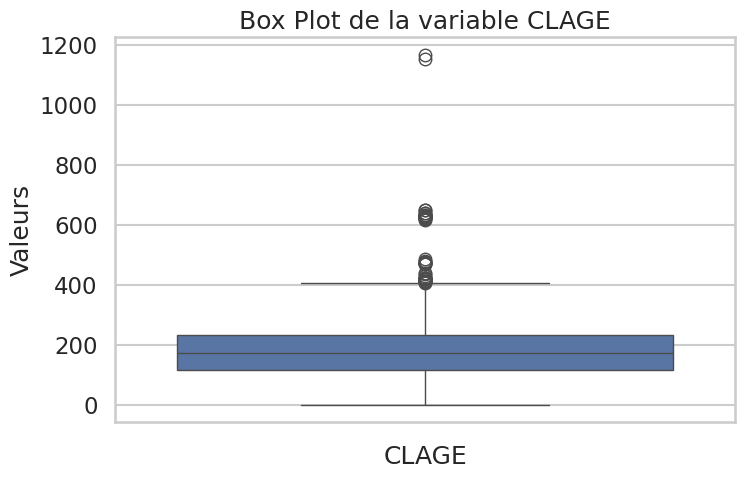

In [29]:
# Créer un box plot  pour la variable CLAGE
plt.figure(figsize=(8, 5))
sns.boxplot(data=df["CLAGE"])
plt.title('Box Plot de la variable CLAGE')
plt.xlabel('CLAGE')
plt.ylabel('Valeurs')
plt.show()

In [30]:
# Supprimer les lignes pour lesquelles la variable "CLAGE" a un âge supérieur à
X_train = X_train.drop(X_train[X_train['CLAGE'] > 800].index)
# Filtrer y_train et y_test pour ne conserver que les valeurs dont les index correspondent à ceux de X_train et X_test respectivement
y_train = y_train.loc[X_train.index]

In [31]:
X_train.shape

(4766, 12)

### Traitement des valeurs manquantes

Le dataset contient  6.80% de valeurs manquantes


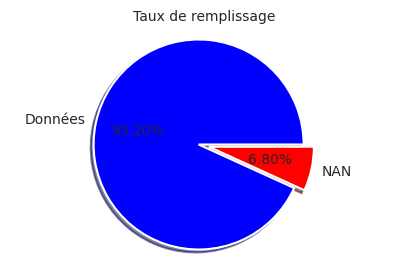

In [32]:
# Taux de valeurs manquantes
total_data = df.size
valid_data = df.count().sum()
rate_ok = valid_data/total_data
print(f"Le dataset contient {1 - rate_ok: .2%} de valeurs manquantes")

# Graphe en camembert
plt.figure(figsize=(5,3))
plt.pie([rate_ok, 1 - rate_ok], explode=(0, 0.1), labels=["Données", "NAN"],
            colors=['blue', 'red'], autopct='%.2f%%', shadow=True, textprops={'fontsize': 10})
plt.title("Taux de remplissage", fontsize=10)
plt.axis('equal')
plt.show()

In [33]:
# Afficher le nombre de valeurs manquantes
print("Le nombre de valeurs manquantes dans l'ensemble d'entrainement :\n", X_train.isnull().sum())

Le nombre de valeurs manquantes dans l'ensemble d'entrainement :
 LOAN         0
MORTDUE    412
VALUE       77
REASON     195
JOB        222
YOJ        404
DEROG      552
DELINQ     457
CLAGE      239
NINQ       400
CLNO       169
DEBTINC    997
dtype: int64


In [34]:
# Calculer le pourcentage de valeurs manquantes par variable
missing_percentage_X_train = (X_train.isnull().sum() / len(X_train)) * 100
# Afficher les pourcentages
print("Le pourcentage de valeurs manquantes par variable dans l'ensemble d'entrainement :\n", missing_percentage_X_train)

Le pourcentage de valeurs manquantes par variable dans l'ensemble d'entrainement :
 LOAN       0.00
MORTDUE    8.64
VALUE      1.62
REASON     4.09
JOB        4.66
YOJ        8.48
DEROG     11.58
DELINQ     9.59
CLAGE      5.01
NINQ       8.39
CLNO       3.55
DEBTINC   20.92
dtype: float64


Dans cette étape, nous allons traiter les valeurs manquantes de notre jeu de données. Pour les variables avec moins de 10 % de valeurs manquantes, nous imputerons par la médiane (pour les variables numériques) ou par la valeur la plus fréquente (pour les variables catégorielles). Pour celles ayant entre 10 % et 20 % de valeurs manquantes, nous appliquerons également l'imputation par la médiane pour les variables numériques et le mode pour les variables catégorielles, tout en restant vigilants quant à l'impact sur l'analyse. Supprimer les lignes contenant des valeurs manquantes aurait considérablement réduit la taille de l'échantillon, compromettant ainsi la représentativité de nos données.

In [35]:
# Afficher le nombre de valeurs manquantes dans les variables catégorielles
print("Le nombre de valeurs manquantes par variable catégorielle dans l'ensemble d'entrainement :\n", X_train.select_dtypes("object").isna().sum())

Le nombre de valeurs manquantes par variable catégorielle dans l'ensemble d'entrainement :
 REASON    195
JOB       222
dtype: int64


In [36]:
# Afficher le nombre de valeurs manquantes dans les variables numériques
print("Le nombre de valeurs manquantes par variable numérique dans l'ensemble d'entrainement :\n", X_train.select_dtypes("float").isna().sum())

Le nombre de valeurs manquantes par variable numérique dans l'ensemble d'entrainement :
 MORTDUE    412
VALUE       77
YOJ        404
DEROG      552
DELINQ     457
CLAGE      239
NINQ       400
CLNO       169
DEBTINC    997
dtype: int64


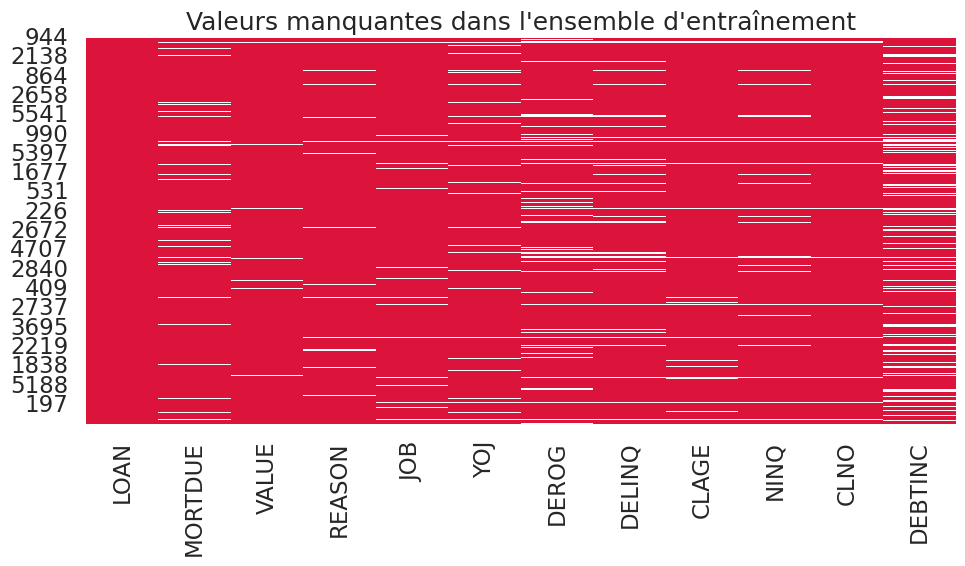

In [37]:
# Créer une figure
fig, ax = plt.subplots(figsize=(10, 6))

# Visualiser les valeurs manquantes pour X_train
sns.heatmap(X_train.isna(), ax=ax, cmap=['crimson', 'white'], cbar=False)
ax.set_title("Valeurs manquantes dans l'ensemble d'entraînement")

# Afficher le graphique
plt.tight_layout()
plt.show()

In [38]:
X_train_logreg = X_train.copy()
X_test_logreg = X_test.copy()

In [39]:
# Imputer les valeurs manquantes des variables numériques par la médiane
X_train_logreg[numerical_variables]=X_train_logreg[numerical_variables].fillna(X_train_logreg[numerical_variables].median())
X_test_logreg[numerical_variables]=X_test_logreg[numerical_variables].fillna(X_train_logreg[numerical_variables].median())

In [40]:
# Imputer les valeurs manquantes des variables catégorielles par mode
for col in categorical_variables:
  X_train_logreg[col]=X_train_logreg[col].fillna(X_train_logreg[col].mode()[0])
  X_test_logreg[col]=X_test_logreg[col].fillna(X_train_logreg[col].mode()[0])

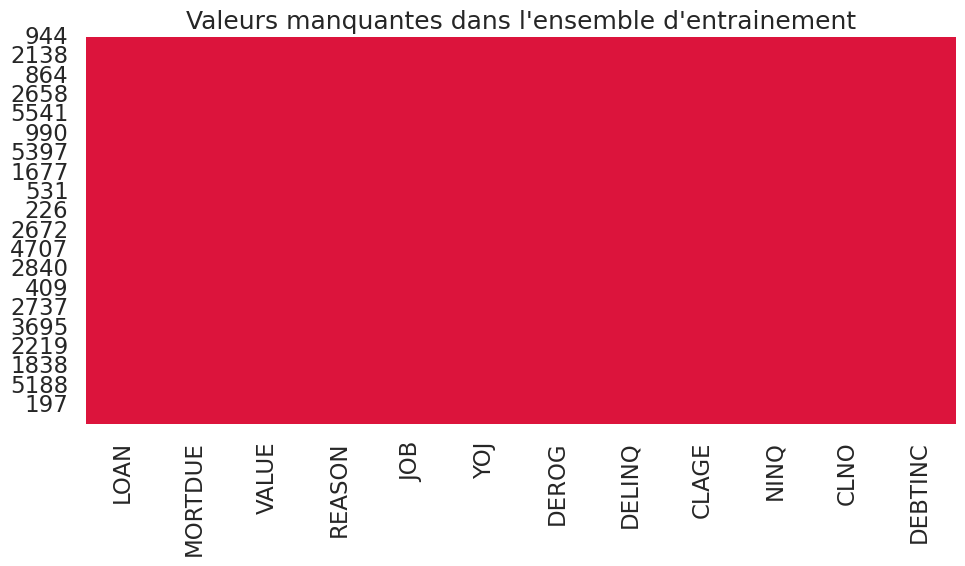

In [41]:
# Visualiser les valeurs manquantes après imputation
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(X_train_logreg.isna(), ax=ax, cmap=['crimson', 'black'], cbar=False)
ax.set_title("Valeurs manquantes dans l'ensemble d'entrainement")
plt.tight_layout()
plt.show()

In [42]:
# Créer une copie complète des jeux de données après imputation
X_train_full = X_train_logreg.copy()
X_test_full = X_test_logreg.copy()

## Fonctions a utiliser

In [43]:
class ModelPipeline:
    def __init__(self):
        self.regularization_params = {
            'ridge': {
                'C': np.logspace(-4, 4, 50),
                'penalty': ['l2']
            },
            'lasso': {
                'C': np.logspace(-3, -1, 50),
                'penalty': ['l1'],
                'solver': ['liblinear']
            },
            'elasticnet': {
                'C': np.logspace(-3, -1, 30),
                'l1_ratio': np.linspace(0.3, 0.7, 5),
                'penalty': ['elasticnet'],
                'solver': ['saga']
            }
        }
        self.results = {}

    def fit_base_logistic(self, X_train, X_test, y_train, y_test, balance_method=None):
        """
        Ajuste le modèle logistique de base avec statsmodels
        """
        # Préparation des données
        X_train_sm = sm.add_constant(X_train)
        X_test_sm = sm.add_constant(X_test)

        if balance_method == 'smote':
            smote = SMOTE(random_state=42)
            X_train_sm, y_train = smote.fit_resample(X_train_sm, y_train)

        if balance_method == 'class_weights':
            weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
            weight_dict = {i: weight for i, weight in enumerate(weights)}
            logit = sm.Logit(y_train, X_train_sm, weights=weights)
        else:
            logit = sm.Logit(y_train, X_train_sm)

        # Fit du modèle
        model = logit.fit()
        print("\nStatsmodels Logistic Regression Summary:")
        print(model.summary())

        # Prédictions
        y_train_pred = (model.predict(X_train_sm) > 0.5).astype(int)
        y_test_pred = (model.predict(X_test_sm) > 0.5).astype(int)

        y_train_proba = model.predict(X_train_sm)
        y_test_proba = model.predict(X_test_sm)

        # Métriques et visualisations
        self._evaluate_and_visualize('logistic',
                                   y_train, y_test,
                                   y_train_pred, y_test_pred,
                                   y_train_proba, y_test_proba,
                                   balance_method)

        return model

    def fit_regularized_models(self, X_train, X_test, y_train, y_test, balance_method=None):
        """
        Ajuste les modèles régularisés (Ridge, Lasso, Elastic Net) avec affichage des résultats GridSearch
        """
        if balance_method == 'smote':
            smote = SMOTE(random_state=42)
            X_train, y_train = smote.fit_resample(X_train, y_train)

        for model_type, params in self.regularization_params.items():
            print(f"\nFitting {model_type.upper()} model...")

            # Configuration du modèle
            model = LogisticRegression(random_state=42)
            if balance_method == 'class_weights':
                weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
                weight_dict = {i: weight for i, weight in enumerate(weights)}
                model.set_params(class_weight=weight_dict)

            # GridSearch
            grid_search = GridSearchCV(model, params, cv=5, scoring='f1', n_jobs=-1)
            grid_search.fit(X_train, y_train)

            # Afficher les résultats du GridSearch
            print("\nRésultats du GridSearch:")
            print(f"Meilleurs paramètres: {grid_search.best_params_}")
            print(f"Meilleur score F1: {grid_search.best_score_:.4f}")

            # Afficher les top 5 combinaisons de paramètres
            results_df = pd.DataFrame(grid_search.cv_results_)
            results_df = results_df.sort_values('rank_test_score')
            print("\nTop 5 combinaisons de paramètres:")
            for i in range(min(5, len(results_df))):
                params = results_df.iloc[i]['params']
                score = results_df.iloc[i]['mean_test_score']
                print(f"{i+1}. Paramètres: {params}")
                print(f"   Score F1 moyen: {score:.4f}")

            best_model = grid_search.best_estimator_

            # Prédictions
            y_train_pred = best_model.predict(X_train)
            y_test_pred = best_model.predict(X_test)

            y_train_proba = best_model.predict_proba(X_train)[:, 1]
            y_test_proba = best_model.predict_proba(X_test)[:, 1]

            # Métriques et visualisations
            self._evaluate_and_visualize(model_type,
                                       y_train, y_test,
                                       y_train_pred, y_test_pred,
                                       y_train_proba, y_test_proba,
                                       balance_method)

    def _evaluate_and_visualize(self, model_type, y_train, y_test,
                              y_train_pred, y_test_pred,
                              y_train_proba, y_test_proba,
                              balance_method=None):
        """
        Évalue le modèle et crée les visualisations
        """
        # Calcul des métriques
        train_metrics = {
            'accuracy': accuracy_score(y_train, y_train_pred),
            'precision': precision_score(y_train, y_train_pred),
            'recall': recall_score(y_train, y_train_pred),
            'f1': f1_score(y_train, y_train_pred),
            'roc_auc': roc_auc_score(y_train, y_train_proba)
        }

        test_metrics = {
            'accuracy': accuracy_score(y_test, y_test_pred),
            'precision': precision_score(y_test, y_test_pred),
            'recall': recall_score(y_test, y_test_pred),
            'f1': f1_score(y_test, y_test_pred),
            'roc_auc': roc_auc_score(y_test, y_test_proba)
        }

        # Stockage des résultats
        model_name = f"{model_type}_{balance_method if balance_method else 'base'}"
        self.results[model_name] = {
            'train_metrics': train_metrics,
            'test_metrics': test_metrics,
            'train_pred': y_train_pred,
            'test_pred': y_test_pred,
            'train_proba': y_train_proba,
            'test_proba': y_test_proba
        }

        # Affichage des résultats
        print(f"\nResults for {model_name.upper()}:")
        print("\nTraining Set Metrics:")
        for metric, value in train_metrics.items():
            print(f"{metric}: {value:.4f}")

        print("\nTest Set Metrics:")
        for metric, value in test_metrics.items():
            print(f"{metric}: {value:.4f}")

        print("\nClassification Report - Test Set:")
        print(classification_report(y_test, y_test_pred, digits=4))

        # Matrice de confusion
        plt.figure(figsize=(8, 6))
        cm = confusion_matrix(y_test, y_test_pred)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Confusion Matrix - {model_name}')
        plt.ylabel('True Label')
        plt.xlabel('Predicted Label')
        plt.show()

        # Courbe ROC
        plt.figure(figsize=(8, 6))
        # Courbe Train
        fpr_train, tpr_train, _ = roc_curve(y_train, y_train_proba)
        plt.plot(fpr_train, tpr_train,
                label=f'Train (AUC = {train_metrics["roc_auc"]:.3f})')
        # Courbe Test
        fpr_test, tpr_test, _ = roc_curve(y_test, y_test_proba)
        plt.plot(fpr_test, tpr_test,
                label=f'Test (AUC = {test_metrics["roc_auc"]:.3f})')

        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve - {model_name}')
        plt.legend()
        plt.show()

Cette classe est responsable de l'ajustement des modèles de régression logistique et régularisés, ainsi que de l'évaluation et de la visualisation des résultats. Elle est composée de plusieurs méthodes :

- **`__init__`** : Initialise la classe avec les paramètres de régularisation pour les modèles Ridge, Lasso et Elastic Net.
- **`fit_base_logistic`** : Ajuste un modèle de régression logistique de base en utilisant `statsmodels`. Cette méthode permet également de gérer le déséquilibre des classes à l'aide de `class weights` ou de SMOTE. Les prédictions, métriques de performance, et visualisations sont générées pour évaluer le modèle.
- **`fit_regularized_models`** : Ajuste les modèles régularisés (Ridge, Lasso, Elastic Net) en utilisant `GridSearchCV` pour trouver les meilleurs hyperparamètres. Cette méthode inclut la possibilité de gérer le déséquilibre des classes à l'aide de `class weights` ou SMOTE.
- **`_evaluate_and_visualize`** : Évalue les performances des modèles à l'aide de plusieurs métriques (accuracy, précision, rappel, F1 score, AUC) et crée des visualisations (matrices de confusion et courbes ROC) pour une compréhension approfondie des résultats.

Cette classe offre une solution complète pour ajuster, évaluer et comparer les performances des modèles de classification logistique, tout en prenant en compte différentes approches de gestion du déséquilibre des classes.

In [44]:
def run_complete_analysis(X_train, X_test, y_train, y_test, is_feature_engineered=False):
    """
    Lance l'analyse complète selon la logique suivante:

    Sans feature engineering :
    1. Tous les modèles sans balancing
    2. Tous les modèles avec class weights
    3. Tous les modèles avec SMOTE

    Avec feature engineering :
    1. Tous les modèles avec class weights
    2. Tous les modèles avec SMOTE
    """
    pipeline = ModelPipeline()

    if not is_feature_engineered:
        # 1. Base models sans balancing
        print("\n=== MODÈLES DE BASE (SANS BALANCING) ===")
        pipeline.fit_base_logistic(X_train, X_test, y_train, y_test)
        pipeline.fit_regularized_models(X_train, X_test, y_train, y_test)

        # 2. Models avec class weights
        print("\n=== MODÈLES AVEC CLASS WEIGHTS ===")
        pipeline.fit_base_logistic(X_train, X_test, y_train, y_test, 'class_weights')
        pipeline.fit_regularized_models(X_train, X_test, y_train, y_test, 'class_weights')

        # 3. Models avec SMOTE
        print("\n=== MODÈLES AVEC SMOTE ===")
        pipeline.fit_base_logistic(X_train, X_test, y_train, y_test, 'smote')
        pipeline.fit_regularized_models(X_train, X_test, y_train, y_test, 'smote')

    else:  # Avec feature engineering
        # 1. Models avec class weights
        print("\n=== MODÈLES AVEC CLASS WEIGHTS (FEATURE ENGINEERING) ===")
        pipeline.fit_base_logistic(X_train, X_test, y_train, y_test, 'class_weights')
        pipeline.fit_regularized_models(X_train, X_test, y_train, y_test, 'class_weights')

        # 2. Models avec SMOTE
        print("\n=== MODÈLES AVEC SMOTE (FEATURE ENGINEERING) ===")
        pipeline.fit_base_logistic(X_train, X_test, y_train, y_test, 'smote')
        pipeline.fit_regularized_models(X_train, X_test, y_train, y_test, 'smote')

    return pipeline

Cette fonction lance une analyse complète des données avec différents modèles.

- Sans feature engineering :
  1. Tous les modèles de base sans balancing (aucun traitement pour le déséquilibre des classes).
  2. Tous les modèles avec balancing par `class weights`.
  3. Tous les modèles avec SMOTE pour augmenter les instances de la classe minoritaire.

- Avec feature engineering :
  1. Tous les modèles avec `class weights`.
  2. Tous les modèles avec SMOTE.

Cela permet de tester différentes approches pour évaluer l'impact du feature engineering et des techniques de gestion du déséquilibre des classes.

In [45]:
class ModelResultsComparison:
    def __init__(self):
        """Initialise la classe de comparaison"""
        self.all_results = {
            'original': None,  # Données originales
            'combined': None,  # Features combinées
            'discretized': None  # Features discrétisées
        }

    def add_results(self, pipeline_type, y_test, models_dict, is_feature_engineered=False):
        """
        Ajoute les résultats pour un type de pipeline en respectant la logique d'organisation

        Pour les données originales (sans feature engineering):
        - Base models (sans balancing)
        - Models avec class weights
        - Models avec SMOTE

        Pour les données avec feature engineering:
        - Models avec class weights
        - Models avec SMOTE
        """
        results_list = []
        models = ['Logistic', 'Ridge', 'Lasso', 'Elastic Net']

        # Définir les méthodes selon le type de données
        if not is_feature_engineered:
            model_configs = {
                'Base Model': '_base',
                'Class Weights': '_class_weights',
                'SMOTE': '_smote'
            }
        else:
            model_configs = {
                'Class Weights': '_class_weights',
                'SMOTE': '_smote'
            }

        # Collecter les résultats
        for model in models:
            model_base = model.lower().replace(' ', '')

            for method, suffix in model_configs.items():
                model_key = model_base + suffix

                if model_key in models_dict:
                    metrics = models_dict[model_key]['test_metrics']
                    results_list.append({
                        'Model': model,
                        'Method': method,
                        'F1 Score': metrics['f1'],
                        'ROC AUC': metrics['roc_auc'],
                        'Precision': metrics['precision'],
                        'Recall': metrics['recall']
                    })

        self.all_results[pipeline_type] = pd.DataFrame(results_list)

    def plot_individual_comparison(self, pipeline_type):
        """Crée un graphique à barres et tableau pour un type spécifique"""
        if self.all_results[pipeline_type] is None:
            print(f"Pas de résultats pour {pipeline_type}")
            return

        results_df = self.all_results[pipeline_type]

        # Organisation des modèles et méthodes
        models = ['Logistic', 'Ridge', 'Lasso', 'Elastic Net']
        methods = sorted(results_df['Method'].unique())

        # Création du graphique
        plt.figure(figsize=(15, 6))
        x = np.arange(len(models))
        width = 0.8 / len(methods)

        # Couleurs pour chaque méthode
        colors = {
            'Base Model': 'skyblue',
            'Class Weights': 'lightgreen',
            'SMOTE': 'salmon'
        }

        # Tracer les barres
        for i, method in enumerate(methods):
            method_data = results_df[results_df['Method'] == method]
            f1_scores = []

            for model in models:
                model_data = method_data[method_data['Model'] == model]
                if not model_data.empty:
                    f1_scores.append(model_data['F1 Score'].iloc[0])
                else:
                    f1_scores.append(0)

            offset = (i - len(methods)/2 + 0.5) * width
            plt.bar(x + offset, f1_scores, width, label=method, color=colors[method])

        plt.xlabel('Models')
        plt.ylabel('F1 Score')

        # Ajuster le titre selon le type de preprocessing
        title_suffix = {
            'original': 'Original Features (No Feature Engineering)',
            'combined': 'Combined Features',
            'discretized': 'Discretized Features'
        }
        plt.title(f'Model Comparison - {title_suffix[pipeline_type]}')

        plt.xticks(x, models, rotation=45)
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

        # Créer et afficher le tableau détaillé
        print(f"\nRésultats détaillés pour {title_suffix[pipeline_type]}:")
        pivot_table = results_df.pivot_table(
            index='Model',
            columns='Method',
            values=['F1 Score', 'ROC AUC', 'Precision', 'Recall']
        )

        styled_table = pivot_table.style\
            .format(precision=4)\
            .highlight_max(axis=None, props='color:white; background-color:green',
                         subset=pd.IndexSlice[:, ('F1 Score', slice(None))])\
            .highlight_max(axis=None, props='color:white; background-color:blue',
                         subset=pd.IndexSlice[:, ('ROC AUC', slice(None))])\
            .highlight_max(axis=None, props='color:white; background-color:purple',
                         subset=pd.IndexSlice[:, ('Precision', slice(None))])\
            .highlight_max(axis=None, props='color:white; background-color:orange',
                         subset=pd.IndexSlice[:, ('Recall', slice(None))])

        display(styled_table)

    def plot_final_comparison(self):
        """
        Crée un graphique comparatif final montrant tous les résultats
        """
        plt.figure(figsize=(20, 10))
        models = ['Logistic', 'Ridge', 'Lasso', 'Elastic Net']
        x = np.arange(len(models))
        width = 0.1

        # Configurations des barres
        bar_configs = [
            # Données originales
            {'data': 'original', 'method': 'Base Model', 'position': -0.3,
            'color': 'skyblue', 'label': 'Base Model (Original)'},
            {'data': 'original', 'method': 'Class Weights', 'position': -0.2,
            'color': 'lightblue', 'label': 'Class Weights (Original)'},
            {'data': 'original', 'method': 'SMOTE', 'position': -0.1,
            'color': 'steelblue', 'label': 'SMOTE (Original)'},

            # Features combinées
            {'data': 'combined', 'method': 'Class Weights', 'position': 0.1,
            'color': 'lightgreen', 'label': 'Class Weights (Combined)'},
            {'data': 'combined', 'method': 'SMOTE', 'position': 0.2,
            'color': 'salmon', 'label': 'SMOTE (Combined)'},

            # Features discrétisées
            {'data': 'discretized', 'method': 'Class Weights', 'position': 0.3,
            'color': 'darkgreen', 'label': 'Class Weights (Discretized)'},
            {'data': 'discretized', 'method': 'SMOTE', 'position': 0.4,
            'color': 'darkred', 'label': 'SMOTE (Discretized)'}
        ]

        # Tracer les barres
        for config in bar_configs:
            if self.all_results[config['data']] is not None:
                data = self.all_results[config['data']]
                method_data = data[data['Method'] == config['method']]

                if not method_data.empty:
                    scores = []
                    for model in models:
                        model_data = method_data[method_data['Model'] == model]
                        scores.append(model_data['F1 Score'].iloc[0] if not model_data.empty else 0)

                    plt.bar(x + config['position'], scores, width,
                          label=config['label'], color=config['color'])

        plt.xlabel('Models', fontsize=12)
        plt.ylabel('F1 Score', fontsize=12)
        plt.title('Comparison of F1 Scores Across All Models and Methods', fontsize=14)
        plt.xticks(x, models, rotation=45)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True, alpha=0.3)

        # Ajouter une ligne horizontale pour la moyenne
        if any(result is not None for result in self.all_results.values()):
            all_scores = []
            for result in self.all_results.values():
                if result is not None:
                    all_scores.extend(result['F1 Score'].tolist())
            mean_score = np.mean(all_scores)
            plt.axhline(y=mean_score, color='red', linestyle='--',
                      label=f'Mean F1 Score: {mean_score:.4f}')

        plt.tight_layout()
        plt.show()

    def create_comparison_summary(self):
        """Crée un tableau récapitulatif organisé par type de prétraitement"""
        summary_data = []

        for prep_type, results in self.all_results.items():
            if results is not None:
                prep_name = {
                    'original': 'No Feature Engineering',
                    'combined': 'Combined Features',
                    'discretized': 'Discretized Features'
                }[prep_type]

                for _, row in results.iterrows():
                    summary_data.append({
                        'Preprocessing': prep_name,
                        'Model': row['Model'],
                        'Method': row['Method'],
                        'F1 Score': row['F1 Score'],
                        'ROC AUC': row['ROC AUC'],
                        'Precision': row['Precision'],
                        'Recall': row['Recall']
                    })

        if not summary_data:
            print("Aucune donnée disponible pour créer le tableau récapitulatif")
            return None

        summary_df = pd.DataFrame(summary_data)

        # Trouver et afficher les meilleurs modèles
        self._print_best_models_summary(summary_df)

        # Créer le tableau final
        final_table = pd.pivot_table(
            summary_df,
            values=['F1 Score', 'ROC AUC', 'Precision', 'Recall'],
            index=['Preprocessing', 'Model'],
            columns=['Method'],
            aggfunc='first'
        )

        return self._style_summary_table(final_table)

    def _print_best_models_summary(self, summary_df):
        """Affiche un résumé des meilleurs modèles"""
        print("\n=== RÉSUMÉ DES MEILLEURS MODÈLES ===")

        # Meilleur modèle global
        best_model = summary_df.loc[summary_df['F1 Score'].idxmax()]
        print("\nMeilleur modèle global:")
        self._print_model_details(best_model)

        # Meilleurs modèles par type de prétraitement
        print("\nMeilleurs modèles par type de prétraitement:")
        for prep in summary_df['Preprocessing'].unique():
            prep_data = summary_df[summary_df['Preprocessing'] == prep]
            best_prep = prep_data.loc[prep_data['F1 Score'].idxmax()]
            print(f"\n{prep}:")
            self._print_model_details(best_prep)

    def _print_model_details(self, model):
        """Affiche les détails d'un modèle"""
        print(f"Preprocessing: {model['Preprocessing']}")
        print(f"Model: {model['Model']}")
        print(f"Method: {model['Method']}")
        print(f"F1 Score: {model['F1 Score']:.4f}")
        print(f"ROC AUC: {model['ROC AUC']:.4f}")
        print(f"Precision: {model['Precision']:.4f}")
        print(f"Recall: {model['Recall']:.4f}")

    def _style_summary_table(self, table):
        """Style le tableau récapitulatif"""
        return table.style\
            .format(precision=4)\
            .highlight_max(axis=None, props='color:white; background-color:green',
                         subset=pd.IndexSlice[:, ('F1 Score', slice(None))])\
            .highlight_max(axis=None, props='color:white; background-color:blue',
                         subset=pd.IndexSlice[:, ('ROC AUC', slice(None))])\
            .highlight_max(axis=None, props='color:white; background-color:purple',
                         subset=pd.IndexSlice[:, ('Precision', slice(None))])\
            .highlight_max(axis=None, props='color:white; background-color:orange',
                         subset=pd.IndexSlice[:, ('Recall', slice(None))])

    def display_all_comparisons(self):
        """
        Affiche toutes les comparaisons
        """
        # Comparaisons individuelles
        for pipeline_type in self.all_results:
            if self.all_results[pipeline_type] is not None:
                self.plot_individual_comparison(pipeline_type)

        # Graphique final
        print("\nFinal Comparison Across All Approaches:")
        self.plot_final_comparison()

        # Tableau récapitulatif
        print("\nTableau récapitulatif de tous les résultats:")
        styled_table = self.create_comparison_summary()
        if styled_table is not None:
            display(styled_table)

Cette classe est utilisée pour comparer les résultats des différents modèles et configurations de modélisation. Elle comprend plusieurs méthodes :

- `add_results` : Ajoute les résultats pour chaque modèle testé (base models, class weights, SMOTE).
- `plot_individual_comparison` : Crée des graphiques pour comparer les performances des modèles (F1 score).
- `plot_final_comparison` : Crée un graphique comparatif final montrant tous les résultats.
- `create_comparison_summary` : Crée un tableau récapitulatif de toutes les performances des modèles.
- `display_all_comparisons` : Affiche toutes les comparaisons individuelles et le tableau récapitulatif.

Ces outils permettent de systématiquement évaluer et comparer les différentes stratégies de modélisation, avec et sans feature engineering, et de prendre des décisions basées sur les performances obtenues.

## Analyse statistique des données


### Hypothèse de Linéarité

Pour vérifier les hypothèses de linéarité avant de commencer la modélisation, nous allons effectuer un test de linéarité sur les données non standardisées.

In [46]:
# Test de linéarité sur données non standardisées
def check_linearity_multiple_tests(X, y, numerical_vars, epsilon=1e-6):
    # S'assurer que y est une série
    if isinstance(y, pd.DataFrame):
        y = y['BAD']

    results = []
    lr = LogisticRegression()

    for var in numerical_vars:
        # Method 1: Box-Tidwell
        try:
            x = X[var].copy()
            # Gérer les zéros et négatifs
            if (x <= 0).any():
                x = x - x.min() + epsilon  # déplacer toutes les valeurs en positif

            interaction = x * np.log(x)
            X_test = pd.DataFrame({
                'var': x,
                'interaction': interaction
            }, index=X.index)
            X_test = sm.add_constant(X_test)

            model = sm.Logit(y, X_test).fit(disp=0)
            bt_pvalue = model.pvalues['interaction']
        except Exception as e:
            print(f"Box-Tidwell error for {var}: {str(e)}")
            bt_pvalue = np.nan

        results.append({
            'Variable': var,
            'Box-Tidwell p-value': bt_pvalue,
            'Linear (Box-Tidwell)': bt_pvalue > 0.05 if not np.isnan(bt_pvalue) else 'Error'
        })

    results_df = pd.DataFrame(results)

    # Style the results
    styled_df = results_df.style.apply(lambda x: ['background-color: green'
                                                  if (isinstance(v, (int, float)) and v > 0.05)
                                                  else ''
                                                  for v in x],
                                        subset=['Box-Tidwell p-value'])

    print("\nLinearity test results:")
    display(styled_df)

    return results_df

In [47]:
# Tester sur les données non standardisées
print("Test de linéarité sur données brutes:")
results = check_linearity_multiple_tests(X_train_full[numerical_variables], y_train, numerical_variables)

Test de linéarité sur données brutes:

Linearity test results:


,Variable,Box-Tidwell p-value,Linear (Box-Tidwell)
0,LOAN,0.000000,False
1,MORTDUE,0.000007,False
2,VALUE,0.000000,False
3,YOJ,0.816703,True
4,DEROG,0.000000,False
5,DELINQ,0.001375,False
6,CLAGE,0.101009,True
7,NINQ,0.031503,False
8,CLNO,0.000000,False
9,DEBTINC,0.000107,False


Ces résultats montrent que certaines variables, comme `YOJ` et `CLAGE`, satisfont le critère de linéarité avec la régression logistique, tandis que d'autres ne le font pas, ce qui pourrait nécessiter des transformations supplémentaires pour améliorer la linéarité des relations.


Sur la base des résultats du test de linéarité, nous avons décidé d'appliquer les transformations suivantes :

In [48]:
# Transformations basées sur les résultats du test
transformations = {
    # p < 0.05: besoin de transformation
    'LOAN': np.log1p,        # monétaire -> log
    'MORTDUE': np.log1p,     # monétaire -> log
    'VALUE': np.log1p,       # monétaire -> log
    'DEROG': lambda x: x,    # count data -> garder tel quel car ce n'est pas des données continues mais discrètes
    'DELINQ': lambda x: x,   # count data -> garder tel quel
    'NINQ': lambda x: x,     # count data -> garder tel quel
    'CLNO': np.sqrt,         # count mais grand range -> sqrt
    'DEBTINC': np.log1p,     # ratio -> log

    # p > 0.05: déjà linéaires
    'YOJ': lambda x: x,      # déjà linéaire (p=0.83)
    'CLAGE': lambda x: x     # déjà linéaire (p=0.10)
}

# Appliquer les transformations
X_train_transformed = X_train_full[numerical_variables].copy()
X_test_transformed = X_test_full[numerical_variables].copy()

for var, transform in transformations.items():
    if var in numerical_variables:
        X_train_full[var] = transform(X_train_full[var])
        X_test_full[var] = transform(X_test_full[var])

In [49]:
# Retester la linéarité après transformation
print("Test de linéarité après transformations:")
results_after = check_linearity_multiple_tests(X_train_full, y_train, numerical_variables)

Test de linéarité après transformations:

Linearity test results:


,Variable,Box-Tidwell p-value,Linear (Box-Tidwell)
0,LOAN,0.000000,False
1,MORTDUE,0.405239,True
2,VALUE,0.000000,False
3,YOJ,0.816703,True
4,DEROG,0.000000,False
5,DELINQ,0.001375,False
6,CLAGE,0.101009,True
7,NINQ,0.031503,False
8,CLNO,0.000000,False
9,DEBTINC,0.000000,False


Après les transformations, certaines variables, telles que `MORTDUE`, ont désormais un résultat satisfaisant pour la linéarité, mais pas toutes.

### Distribution de chaque classe

Pour évaluer le déséquilibre des classes dans notre jeu de données d'entraînement :

In [50]:
# Distribution de chaque classe dans le training set
print("Class distribution:")
print(y_train.value_counts(normalize=True))

Class distribution:
BAD
0     0.81
1     0.19
Name: proportion, dtype: float64


Ces résultats montrent un déséquilibre de classes, avec une majorité de données appartenant à la classe 0.

### Analyse des corrélations

Pour analyser les relations entre les variables :

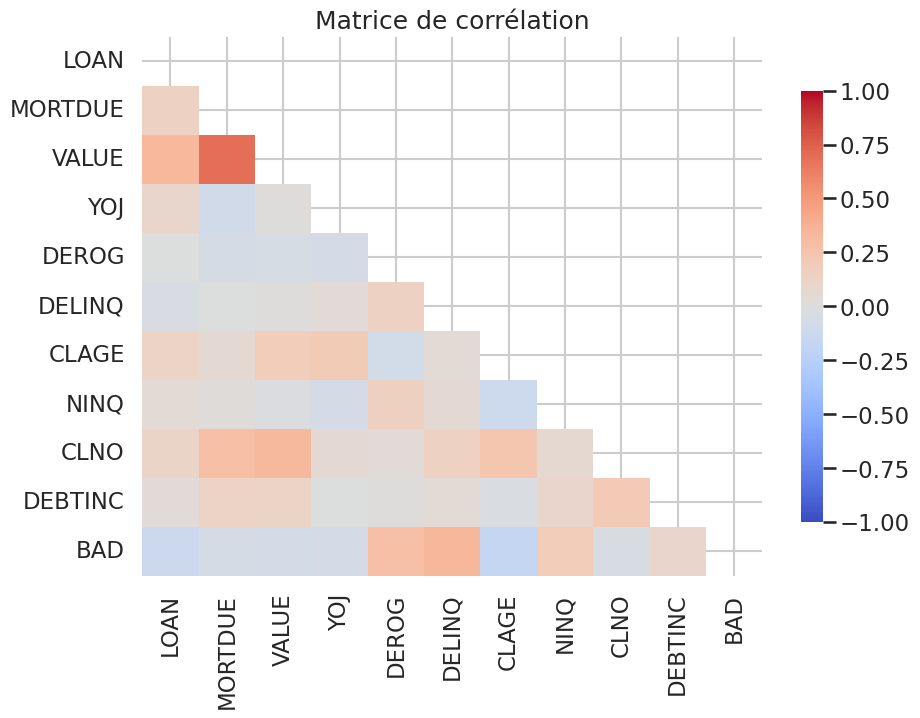

In [51]:
# Analyse des correlations
matrice_corr = pd.concat([X_train_full[numerical_variables], y_train], axis=1).corr()
mask = np.triu(np.ones_like(matrice_corr, dtype=bool))
plt.figure(figsize=(10,7))
sns.heatmap(matrice_corr, vmin=-1, vmax=1, annot=False,
            mask=mask, cmap='coolwarm', cbar_kws={"shrink": .8})
plt.title("Matrice de corrélation")
plt.show()

In [52]:
matrice_corr

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,BAD
LOAN,1.00,0.14,0.33,0.09,-0.00,-0.03,0.12,0.04,0.11,0.04,-0.13
MORTDUE,0.14,1.00,0.69,-0.09,-0.06,-0.00,0.06,0.02,0.29,0.13,-0.06
VALUE,0.33,0.69,1.00,0.01,-0.05,0.01,0.18,-0.02,0.33,0.12,-0.08
YOJ,0.09,-0.09,0.01,1.00,-0.06,0.04,0.20,-0.07,0.06,-0.01,-0.07
DEROG,-0.00,-0.06,-0.05,-0.06,1.00,0.14,-0.08,0.15,0.04,0.01,0.28
DELINQ,-0.03,-0.00,0.01,0.04,0.14,1.00,0.04,0.06,0.14,0.04,0.34
CLAGE,0.12,0.06,0.18,0.20,-0.08,0.04,1.00,-0.11,0.24,-0.03,-0.17
NINQ,0.04,0.02,-0.02,-0.07,0.15,0.06,-0.11,1.00,0.07,0.10,0.19
CLNO,0.11,0.29,0.33,0.06,0.04,0.14,0.24,0.07,1.00,0.21,-0.04
DEBTINC,0.04,0.13,0.12,-0.01,0.01,0.04,-0.03,0.10,0.21,1.00,0.10


La matrice de corrélation montre les relations entre les différentes variables numériques, en particulier leurs niveaux de corrélation avec la variable cible `BAD`. Les variables "VALUE" et "MORTDUE" sont fortement corrélées entre elles.

### Vérification de la multicolinéarité entre les variables numériques

Pour vérifier s'il existe une multicolinéarité significative :

In [53]:
# Verification de multicolinéarité entre les variables numériques

def check_vif(X):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data.sort_values('VIF', ascending=False)

# Check only numerical variables transformées et standardisées
vif_df = check_vif(X_train_full[numerical_variables])
print("VIF values:")
print(vif_df)

VIF values:
  Variable     VIF
2    VALUE 1018.07
1  MORTDUE  633.25
0     LOAN  288.98
9  DEBTINC  156.45
8     CLNO   19.50
6    CLAGE    6.65
3      YOJ    2.62
7     NINQ    1.58
5   DELINQ    1.19
4    DEROG    1.14


Les résultats montrent que certaines variables ont des VIF très élevés (`VALUE`, `MORTDUE`, `LOAN`), ce qui indique une multicolinéarité significative. Ces variables pourraient nécessiter une attention particulière, comme la réduction de la dimensionnalité ou la suppression de certaines variables pour éviter des problèmes de multicolinéarité.

Normalement:
- VIF = 1 : variables non correlées
- VIF entre 1 et 5 = variables un peu correlées
- VIF > 5 = variables très correlées

### Analyse des relations entre variables catégoriques

Pour analyser les relations entre les variables catégoriques en utilisant le V de Cramer :


In [54]:
# Cramer's V for categorical-categorical associations

# Calculer le V de Cramer pour les variables encodées
def cramers_v(var1, var2):
    crosstab = pd.crosstab(var1, var2)
    chi2 = chi2_contingency(crosstab)[0]
    n = crosstab.sum().sum()
    min_dim = min(crosstab.shape) - 1
    return np.sqrt(chi2 / (n * min_dim))

# Créer une matrice pour les valeurs de V de Cramer
n_cats = len(categorical_variables)
cramer_matrix = np.zeros((n_cats, n_cats))

# Remplir la matrice
for i in range(n_cats):
    for j in range(i + 1, n_cats):
        v = cramers_v(X_train_full[categorical_variables[i]],
                      X_train_full[categorical_variables[j]])
        cramer_matrix[i, j] = v
        cramer_matrix[j, i] = v

# Créer un DataFrame pour une meilleure visualisation
cramer_df = pd.DataFrame(cramer_matrix,
                         index=categorical_variables,
                         columns=categorical_variables)

print("Cramer's V values (>0.3 might indicate strong association):")
print(cramer_df)

Cramer's V values (>0.3 might indicate strong association):
        REASON  JOB
REASON    0.00 0.14
JOB       0.14 0.00


### Analyse des relations entre variables numériques et catégoriques

Pour analyser les relations entre les variables numériques et catégoriques :

In [55]:
def analyze_num_cat_relationships(X_num, X_cat):
    results = []

    for num_col in X_num.columns:
        for cat_col in X_cat.columns:
            # Group numerical variable by categories
            categories = X_cat[cat_col].unique()
            groups = [X_num[num_col][X_cat[cat_col] == cat] for cat in categories]

            # ANOVA
            f_stat, p_value = stats.f_oneway(*groups)

            # Eta-squared
            df_total = len(X_num[num_col]) - 1
            df_between = len(categories) - 1
            eta_squared = (f_stat * df_between) / (f_stat * df_between + df_total)

            results.append({
                'Numerical Variable': num_col,
                'Categorical Variable': cat_col,
                'ANOVA p-value': round(p_value, 4),
                'Eta-squared': round(eta_squared, 4),
                'Relationship': 'Dependent' if p_value < 0.05 else 'Independent',
                'Effect Size': 'Strong' if eta_squared > 0.14 else 'Moderate' if eta_squared > 0.06 else 'Weak'
            })

    # Create DataFrame
    results_df = pd.DataFrame(results)

    # Sort by eta-squared
    results_df = results_df.sort_values('Eta-squared', ascending=False)

    # Style the DataFrame
    styled_df = results_df.style.background_gradient(subset=['Eta-squared'], cmap='YlOrRd')\
        .apply(lambda x: ['background-color: green' if v < 0.05 else '' for v in x], subset=['ANOVA p-value'])

    print("Analysis of Numerical-Categorical Relationships:")
    display(styled_df)

    return results_df

# Run analysis
num_cat_relationships = analyze_num_cat_relationships(
    X_train_full[numerical_variables],  # variables numériques transformées
    X_train_full[categorical_variables]     # variables catégorielles
)

Analysis of Numerical-Categorical Relationships:


,Numerical Variable,Categorical Variable,ANOVA p-value,Eta-squared,Relationship,Effect Size
5,VALUE,JOB,0.000000,0.135200,Dependent,Moderate
3,MORTDUE,JOB,0.000000,0.087000,Dependent,Moderate
0,LOAN,REASON,0.000000,0.060100,Dependent,Moderate
17,CLNO,JOB,0.000000,0.052700,Dependent,Weak
1,LOAN,JOB,0.000000,0.025500,Dependent,Weak
13,CLAGE,JOB,0.000000,0.014800,Dependent,Weak
14,NINQ,REASON,0.000000,0.012600,Dependent,Weak
15,NINQ,JOB,0.000000,0.012400,Dependent,Weak
16,CLNO,REASON,0.000000,0.011300,Dependent,Weak
19,DEBTINC,JOB,0.000000,0.006300,Dependent,Weak


Les résultats montrent différentes relations entre les variables numériques et catégoriques, avec des tailles d'effet variées allant de faibles à modérées.

Les variables monétaires (MORTDUE, VALUE) montrent les plus fortes associations avec les catégories d'emploi. La plupart des relations sont faibles (η² < 0.06).

L'Eta-squared (η²) est une mesure de la taille d'effet qui indique la force de la relation entre une variable catégorielle et une variable numérique.
- Range de 0 à 1
- 0 = pas d'effet
- 1 = effet maximum

### Transformation des variables

In [56]:
# Réalignement des indices

# Réaligner tous les indices de X_train_full, X_test_full, y_train, et y_test après les transformations.
# Cela permet de s'assurer que toutes les données ont des indices consistants, ce qui facilite les opérations ultérieures.
X_train_full = X_train_full.reset_index(drop=True)
X_test_full = X_test_full.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

# Vérification de l'alignement des indices.
print("Final check après réalignement:")
print("X shape:", X_train_full.shape)
print("y shape:", y_train.shape)
print("X index:", X_train_full.index[:5])
print("y index:", y_train.index[:5])

Final check après réalignement:
X shape: (4766, 12)
y shape: (4766, 1)
X index: RangeIndex(start=0, stop=5, step=1)
y index: RangeIndex(start=0, stop=5, step=1)


In [57]:
# Standardisation des données

scaler = MinMaxScaler()
X_train_full[numerical_variables] = pd.DataFrame(
    scaler.fit_transform(X_train_full[numerical_variables]),
    columns=numerical_variables,
    index=X_train_full.index
)
X_test_full[numerical_variables] = pd.DataFrame(
    scaler.transform(X_test_full[numerical_variables]),
    columns=numerical_variables,
    index=X_test_full.index
)

Les données ne suivent pas une distribution normale, on utilise donc MinMaxScaler pour standardiser.

In [58]:
# Encodage des variables catégorielles
encoded_train = pd.get_dummies(X_train_full[categorical_variables], drop_first=True)
encoded_test = pd.get_dummies(X_test_full[categorical_variables], drop_first=True)

# S'assurer que les colonnes encodées du jeu de test correspondent à celles du jeu d'entraînement.
encoded_test = encoded_test.reindex(columns=encoded_train.columns, fill_value=0)

# Supprimer les anciennes colonnes catégorielles qui ont été encodées.
X_train_full = X_train_full.drop(columns=categorical_variables)
X_test_full = X_test_full.drop(columns=categorical_variables)

# Concaténer les variables encodées avec les jeux de données d'origine.
X_train_full = pd.concat([X_train_full, encoded_train], axis=1)
X_test_full = pd.concat([X_test_full, encoded_test], axis=1)

X_train_full

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,REASON_HomeImp,JOB_Office,JOB_Other,JOB_ProfExe,JOB_Sales,JOB_Self
0,0.48,0.65,0.49,0.00,0.00,0.17,0.20,0.00,0.57,0.63,True,False,False,False,False,False
1,0.84,0.20,0.45,0.17,0.00,0.00,0.48,0.00,0.52,0.53,True,True,False,False,False,False
2,0.57,0.68,0.53,0.46,0.00,0.00,0.35,0.59,0.58,0.68,False,False,False,False,False,False
3,0.14,0.59,0.41,0.07,0.00,0.00,0.13,0.12,0.59,0.69,True,False,True,False,False,False
4,0.50,0.60,0.57,0.10,0.00,0.00,0.32,0.00,0.38,0.62,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4761,0.66,0.74,0.61,0.24,0.00,0.00,0.25,0.06,0.57,0.69,True,False,False,True,False,False
4762,0.74,0.60,0.48,0.59,0.00,0.08,0.45,0.06,0.65,0.71,False,False,True,False,False,False
4763,0.74,0.67,0.58,0.10,0.00,0.00,0.14,0.12,0.67,0.72,False,False,True,False,False,False
4764,0.76,0.68,0.56,0.12,0.00,0.00,0.18,0.59,0.54,0.74,True,False,True,False,False,False


In [59]:
# S'assurer que y_train est une série et du bon type
if isinstance(y_train, pd.DataFrame):
   y_train = y_train['BAD']
y_train = y_train.astype('int64')

# Convertir X_train_full en type numérique
X_train_full = X_train_full.astype('float64')
X_test_full = X_test_full.astype('float64')

## Régression Logistique Simple Sans Feature Engineering

Pour cette section, nous allons analyser les performances des modèles de régression logistique sans aucune technique de feature engineering. Cette approche initiale nous permettra d'établir un point de comparaison avant d'appliquer des transformations de données ou des techniques plus avancées.

Nous avons appliqué plusieurs variantes de régression logistique, incluant des techniques de régularisation (Ridge, Lasso, ElasticNet) pour éviter le surapprentissage et améliorer la généralisation des modèles.


=== MODÈLES DE BASE (SANS BALANCING) ===
Optimization terminated successfully.
         Current function value: 0.374398
         Iterations 7

Statsmodels Logistic Regression Summary:
                           Logit Regression Results                           
Dep. Variable:                    BAD   No. Observations:                 4766
Model:                          Logit   Df Residuals:                     4749
Method:                           MLE   Df Model:                           16
Date:                Sun, 27 Oct 2024   Pseudo R-squ.:                  0.2378
Time:                        21:22:18   Log-Likelihood:                -1784.4
converged:                       True   LL-Null:                       -2341.0
Covariance Type:            nonrobust   LLR p-value:                5.979e-227
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const           

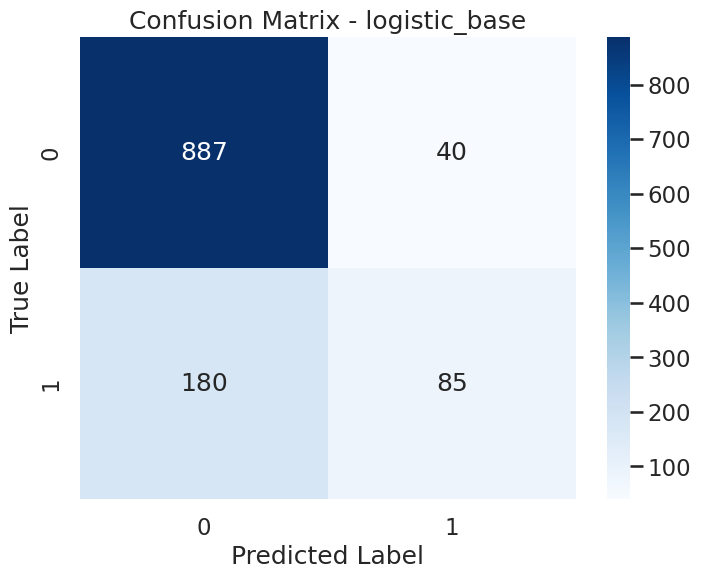

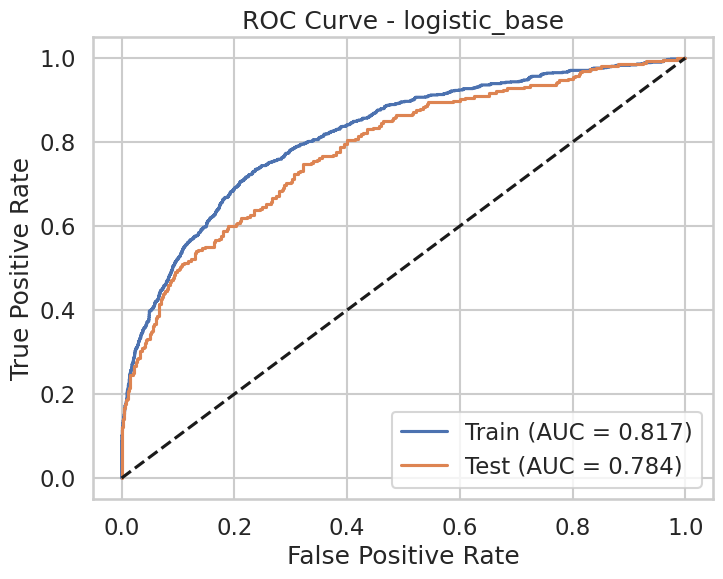


Fitting RIDGE model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 719.6856730011514, 'penalty': 'l2'}
Meilleur score F1: 0.4451

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 719.6856730011514, 'penalty': 'l2'}
   Score F1 moyen: 0.4451
2. Paramètres: {'C': 75.43120063354607, 'penalty': 'l2'}
   Score F1 moyen: 0.4450
3. Paramètres: {'C': 4714.8663634573895, 'penalty': 'l2'}
   Score F1 moyen: 0.4448
4. Paramètres: {'C': 232.9951810515367, 'penalty': 'l2'}
   Score F1 moyen: 0.4448
5. Paramètres: {'C': 339.3221771895323, 'penalty': 'l2'}
   Score F1 moyen: 0.4448

Results for RIDGE_BASE:

Training Set Metrics:
accuracy: 0.8443
precision: 0.7174
recall: 0.3221
f1: 0.4446
roc_auc: 0.8169

Test Set Metrics:
accuracy: 0.8154
precision: 0.6800
recall: 0.3208
f1: 0.4359
roc_auc: 0.7836

Classification Report - Test Set:
              precision    recall  f1-score   support

           0     0.8313    0.9569    0.8897       927
           1     0.6800    0.3208    0.4359 

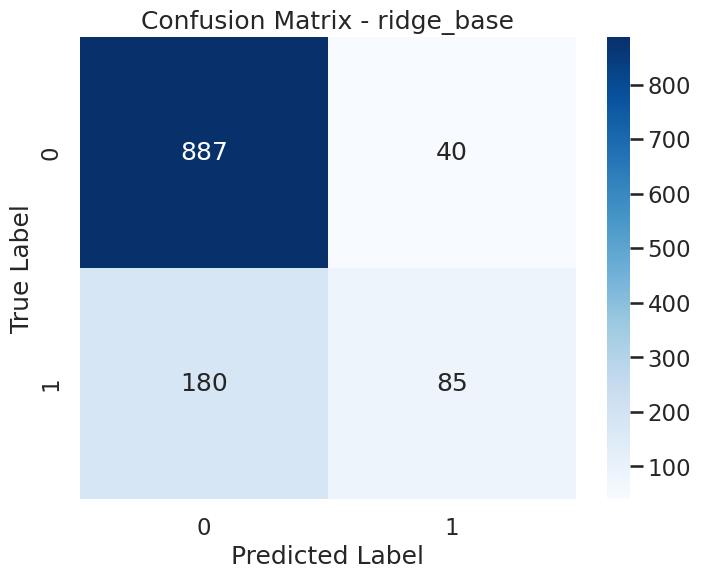

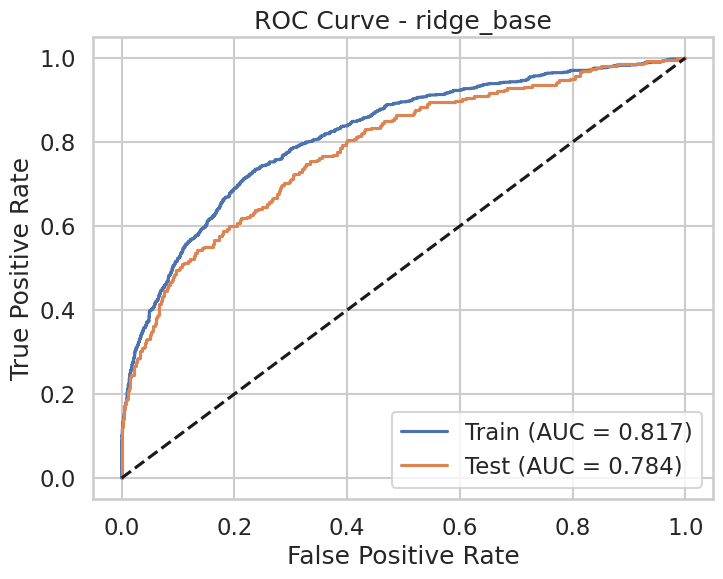


Fitting LASSO model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.09999999999999999, 'penalty': 'l1', 'solver': 'liblinear'}
Meilleur score F1: 0.3334

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.09999999999999999, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.3334
2. Paramètres: {'C': 0.09102981779915219, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.3247
3. Paramètres: {'C': 0.08286427728546843, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.3107
4. Paramètres: {'C': 0.07543120063354615, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.2880
5. Paramètres: {'C': 0.06866488450042998, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.2633

Results for LASSO_BASE:

Training Set Metrics:
accuracy: 0.8386
precision: 0.7887
recall: 0.2267
f1: 0.3521
roc_auc: 0.8010

Test Set Metrics:
accuracy: 0.8163
precision: 0.7738
recall: 0.2453
f1: 0.3725
roc_auc: 0.7711

Classification Report - Test Set:
    

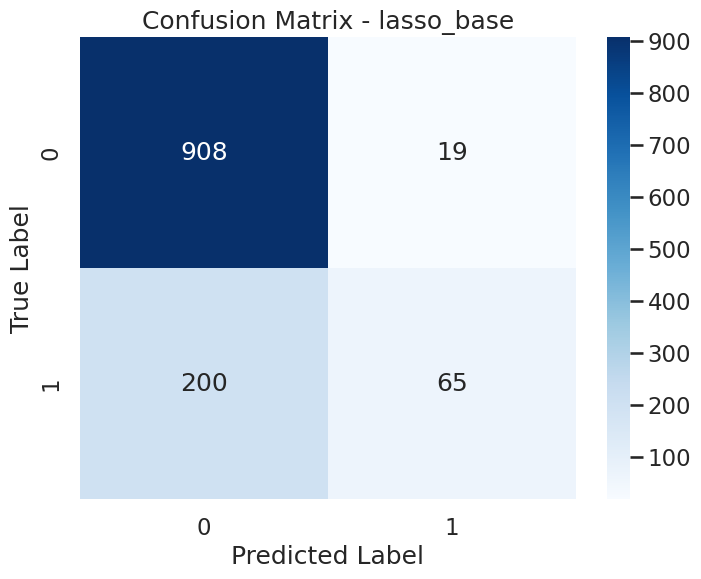

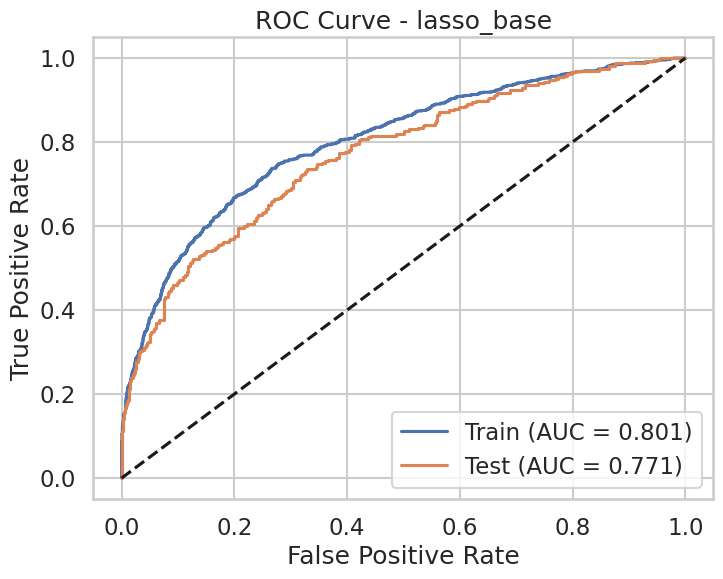


Fitting ELASTICNET model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
Meilleur score F1: 0.2257

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.2257
2. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.6, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.2000
3. Paramètres: {'C': 0.08531678524172805, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.1870
4. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.5, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.1810
5. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.39999999999999997, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.1674

Results for ELASTICNET_BASE:

Training Set Metrics:
accuracy: 0.8338
precision: 0.8652
recall: 0.1670
f1: 0.2800
roc_a

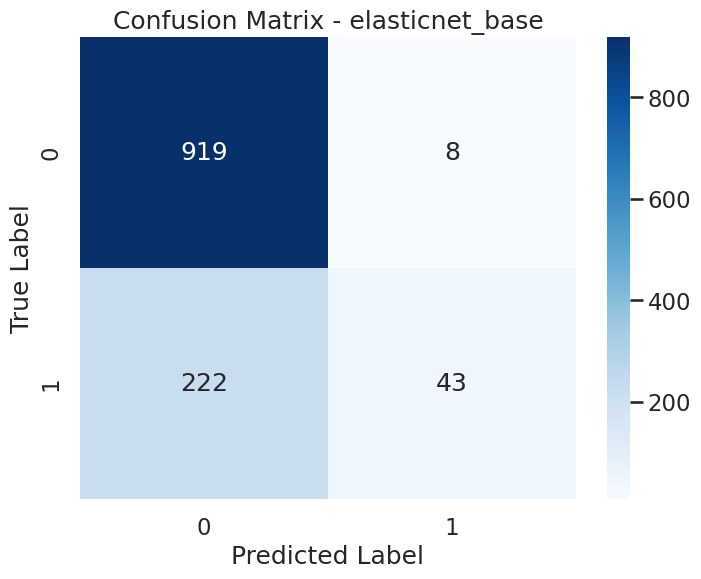

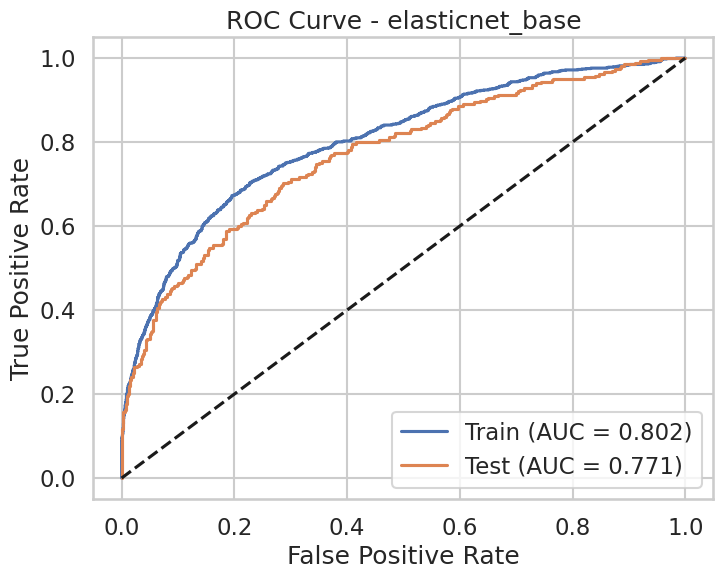


=== MODÈLES AVEC CLASS WEIGHTS ===
Optimization terminated successfully.
         Current function value: 0.374398
         Iterations 7

Statsmodels Logistic Regression Summary:
                           Logit Regression Results                           
Dep. Variable:                    BAD   No. Observations:                 4766
Model:                          Logit   Df Residuals:                     4749
Method:                           MLE   Df Model:                           16
Date:                Sun, 27 Oct 2024   Pseudo R-squ.:                  0.2378
Time:                        21:22:49   Log-Likelihood:                -1784.4
converged:                       True   LL-Null:                       -2341.0
Covariance Type:            nonrobust   LLR p-value:                5.979e-227
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -3.2

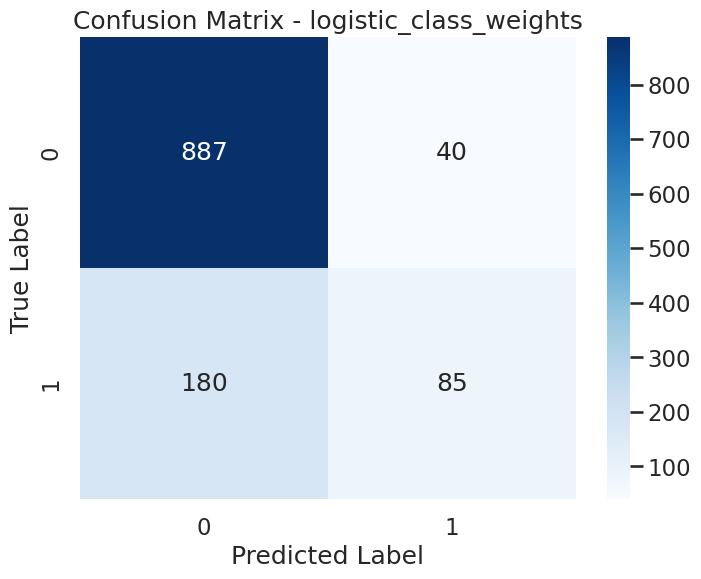

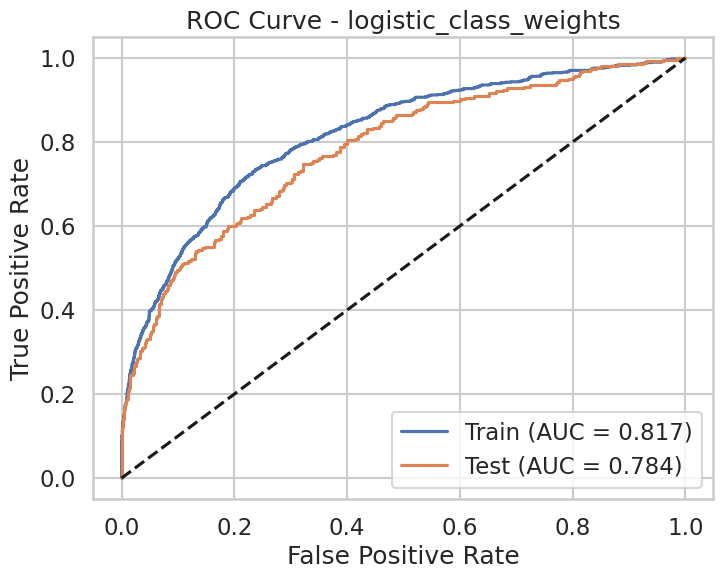


Fitting RIDGE model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 1.7575106248547894, 'penalty': 'l2'}
Meilleur score F1: 0.5459

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 1.7575106248547894, 'penalty': 'l2'}
   Score F1 moyen: 0.5459
2. Paramètres: {'C': 51.79474679231202, 'penalty': 'l2'}
   Score F1 moyen: 0.5452
3. Paramètres: {'C': 24.420530945486497, 'penalty': 'l2'}
   Score F1 moyen: 0.5452
4. Paramètres: {'C': 3.727593720314938, 'penalty': 'l2'}
   Score F1 moyen: 0.5449
5. Paramètres: {'C': 75.43120063354607, 'penalty': 'l2'}
   Score F1 moyen: 0.5448

Results for RIDGE_CLASS_WEIGHTS:

Training Set Metrics:
accuracy: 0.7799
precision: 0.4542
recall: 0.6833
f1: 0.5457
roc_auc: 0.8171

Test Set Metrics:
accuracy: 0.7424
precision: 0.4429
recall: 0.6151
f1: 0.5150
roc_auc: 0.7796

Classification Report - Test Set:
              precision    recall  f1-score   support

           0     0.8762    0.7789    0.8247       927
           1     0.4429    0.6151

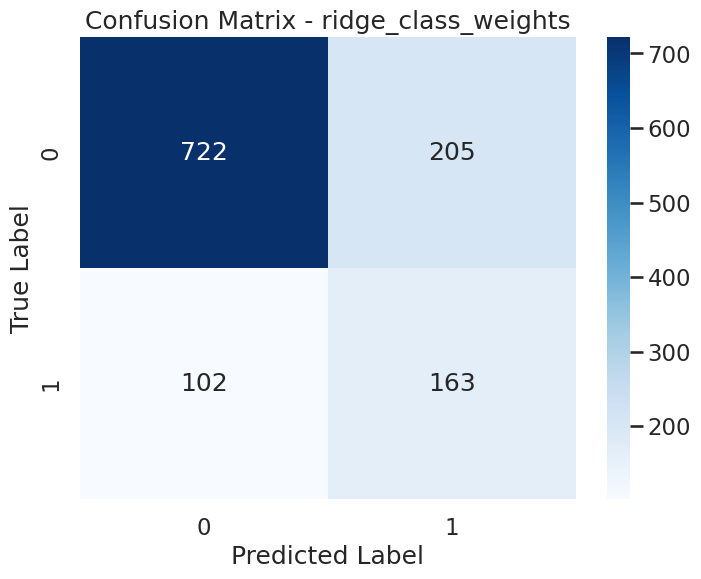

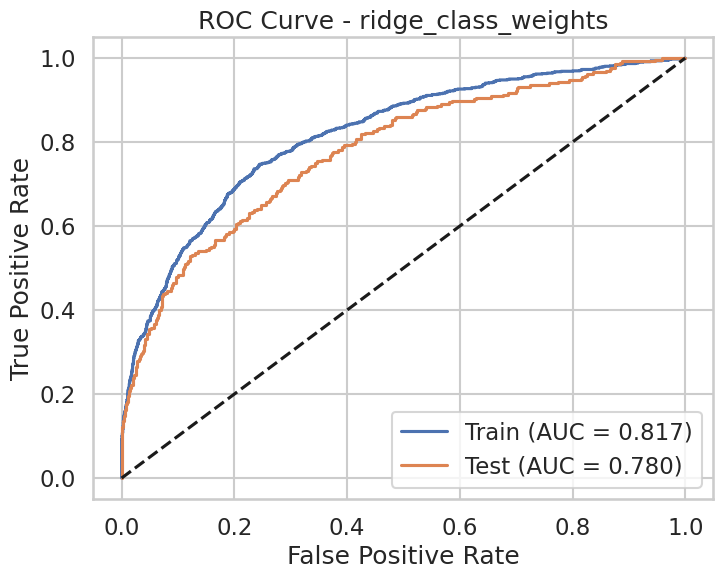


Fitting LASSO model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.06866488450042998, 'penalty': 'l1', 'solver': 'liblinear'}
Meilleur score F1: 0.5298

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.06866488450042998, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5298
2. Paramètres: {'C': 0.09999999999999999, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5290
3. Paramètres: {'C': 0.09102981779915219, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5271
4. Paramètres: {'C': 0.07543120063354615, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5265
5. Paramètres: {'C': 0.0625055192527397, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5264

Results for LASSO_CLASS_WEIGHTS:

Training Set Metrics:
accuracy: 0.7809
precision: 0.4534
recall: 0.6443
f1: 0.5323
roc_auc: 0.8069

Test Set Metrics:
accuracy: 0.7475
precision: 0.4494
recall: 0.6038
f1: 0.5153
roc_auc: 0.7762

Classification Report - Test S

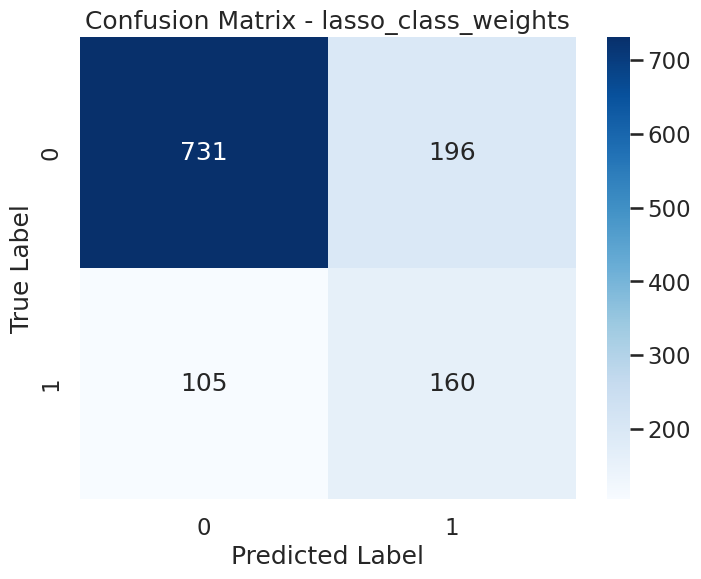

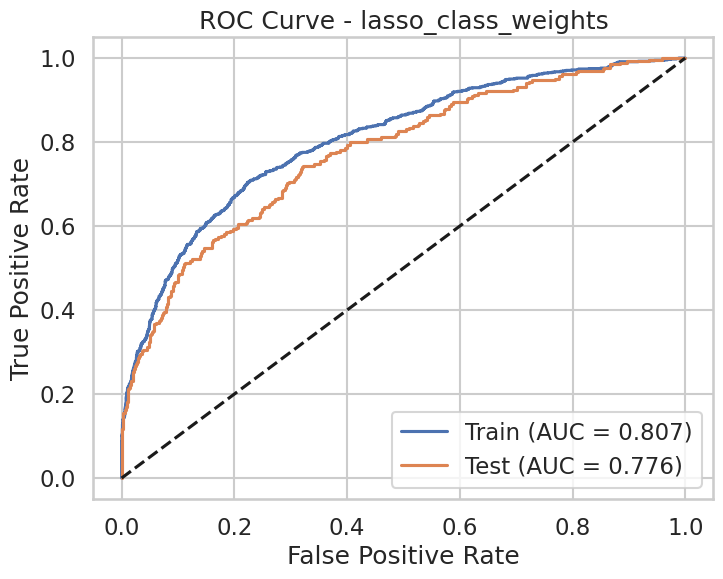


Fitting ELASTICNET model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
Meilleur score F1: 0.5382

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5382
2. Paramètres: {'C': 0.08531678524172805, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5354
3. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.6, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5352
4. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.5, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5337
5. Paramètres: {'C': 0.07278953843983149, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5335

Results for ELASTICNET_CLASS_WEIGHTS:

Training Set Metrics:
accuracy: 0.7770
precision: 0.4491
recall: 0.6746
f1: 0.5392
roc_auc: 0.8

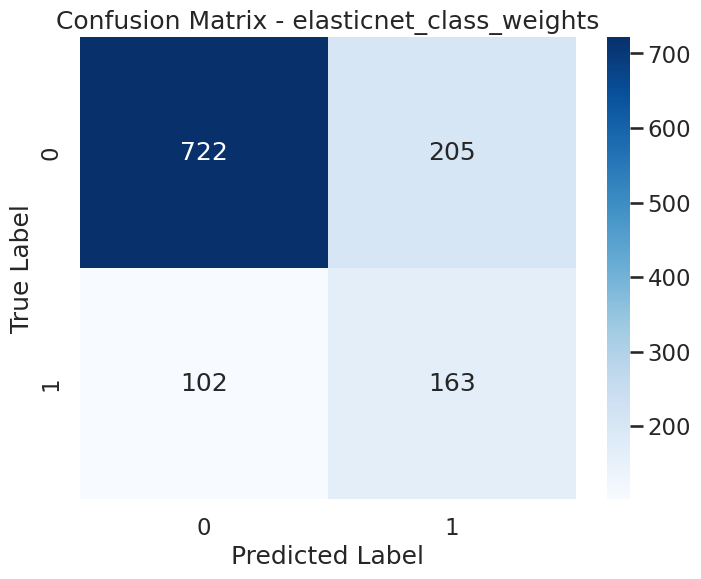

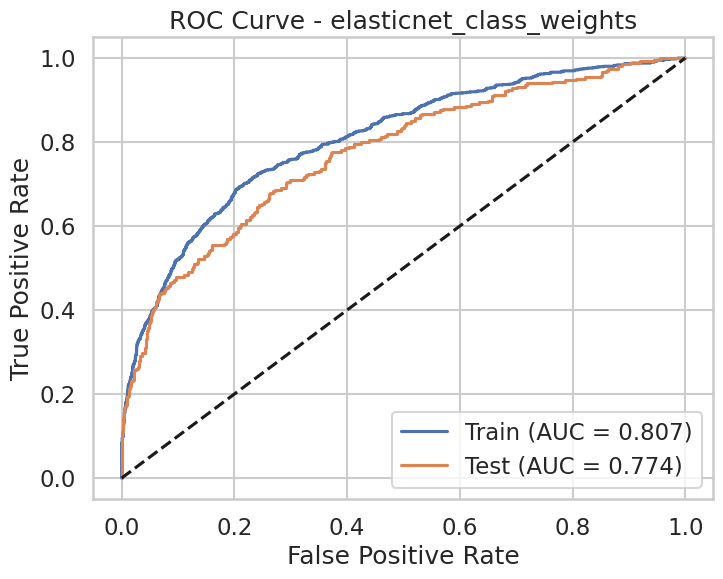


=== MODÈLES AVEC SMOTE ===
Optimization terminated successfully.
         Current function value: 0.520930
         Iterations 7

Statsmodels Logistic Regression Summary:
                           Logit Regression Results                           
Dep. Variable:                    BAD   No. Observations:                 7688
Model:                          Logit   Df Residuals:                     7671
Method:                           MLE   Df Model:                           16
Date:                Sun, 27 Oct 2024   Pseudo R-squ.:                  0.2485
Time:                        21:23:22   Log-Likelihood:                -4004.9
converged:                       True   LL-Null:                       -5328.9
Covariance Type:            nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -2.0404     

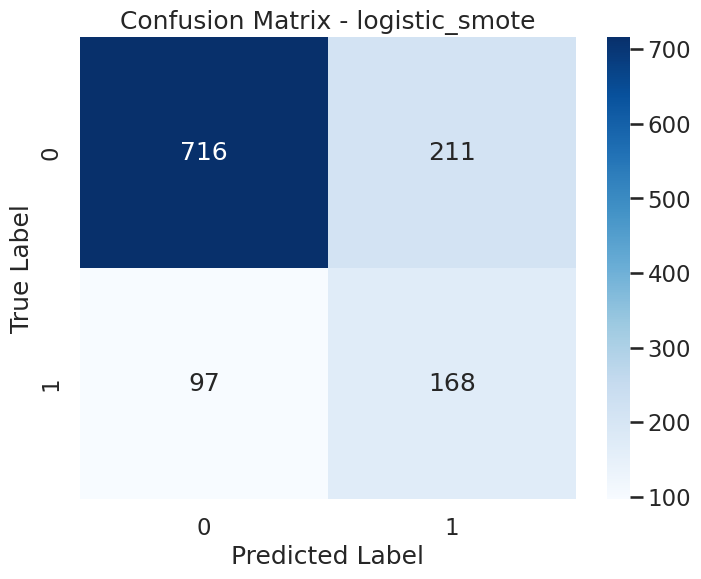

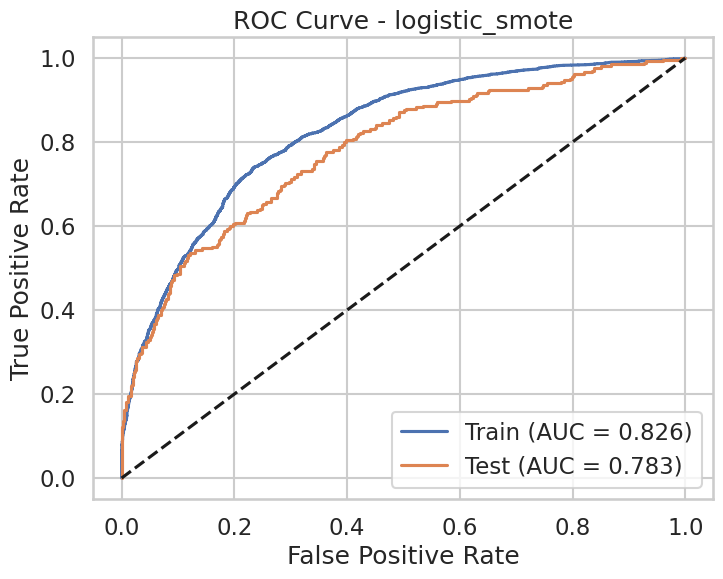


Fitting RIDGE model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 5.428675439323859, 'penalty': 'l2'}
Meilleur score F1: 0.7308

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 5.428675439323859, 'penalty': 'l2'}
   Score F1 moyen: 0.7308
2. Paramètres: {'C': 7.9060432109076855, 'penalty': 'l2'}
   Score F1 moyen: 0.7306
3. Paramètres: {'C': 24.420530945486497, 'penalty': 'l2'}
   Score F1 moyen: 0.7306
4. Paramètres: {'C': 16.768329368110063, 'penalty': 'l2'}
   Score F1 moyen: 0.7304
5. Paramètres: {'C': 1048.1131341546852, 'penalty': 'l2'}
   Score F1 moyen: 0.7303

Results for RIDGE_SMOTE:

Training Set Metrics:
accuracy: 0.7470
precision: 0.7758
recall: 0.6948
f1: 0.7331
roc_auc: 0.8250

Test Set Metrics:
accuracy: 0.7408
precision: 0.4418
recall: 0.6302
f1: 0.5194
roc_auc: 0.7825

Classification Report - Test Set:
              precision    recall  f1-score   support

           0     0.8796    0.7724    0.8225       927
           1     0.4418    0.6302    0.5

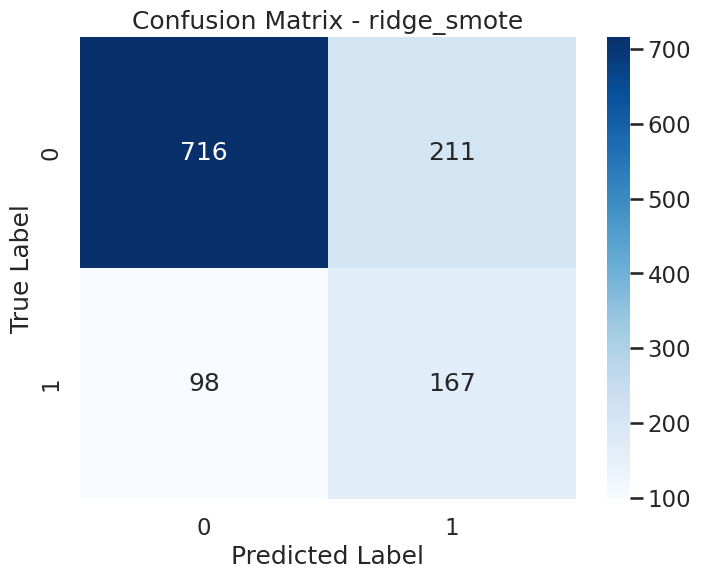

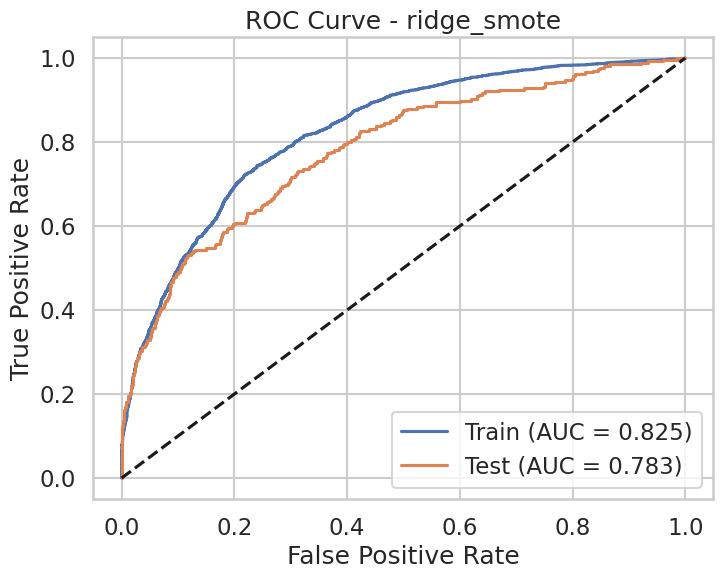


Fitting LASSO model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.09999999999999999, 'penalty': 'l1', 'solver': 'liblinear'}
Meilleur score F1: 0.7211

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.09999999999999999, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7211
2. Paramètres: {'C': 0.09102981779915219, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7190
3. Paramètres: {'C': 0.08286427728546843, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7174
4. Paramètres: {'C': 0.07543120063354615, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7159
5. Paramètres: {'C': 0.06866488450042998, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7144

Results for LASSO_SMOTE:

Training Set Metrics:
accuracy: 0.7410
precision: 0.7718
recall: 0.6844
f1: 0.7255
roc_auc: 0.8185

Test Set Metrics:
accuracy: 0.7391
precision: 0.4382
recall: 0.6151
f1: 0.5118
roc_auc: 0.7802

Classification Report - Test Set:
   

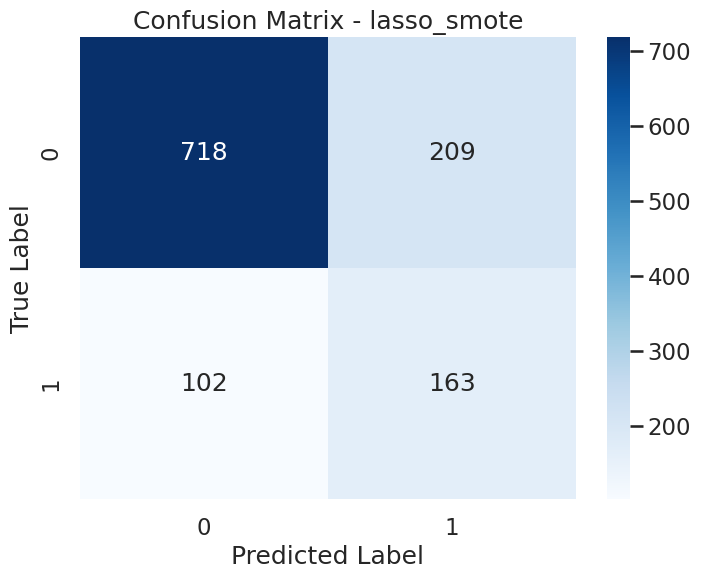

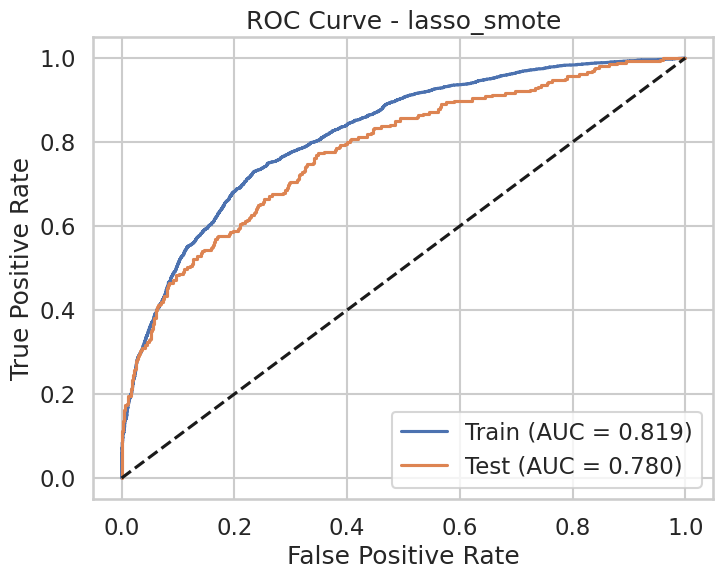


Fitting ELASTICNET model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
Meilleur score F1: 0.7196

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7196
2. Paramètres: {'C': 0.08531678524172805, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7193
3. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.6, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7193
4. Paramètres: {'C': 0.08531678524172805, 'l1_ratio': 0.6, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7192
5. Paramètres: {'C': 0.07278953843983149, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7189

Results for ELASTICNET_SMOTE:

Training Set Metrics:
accuracy: 0.7380
precision: 0.7671
recall: 0.6837
f1: 0.7230
roc_auc: 0.8152

Tes

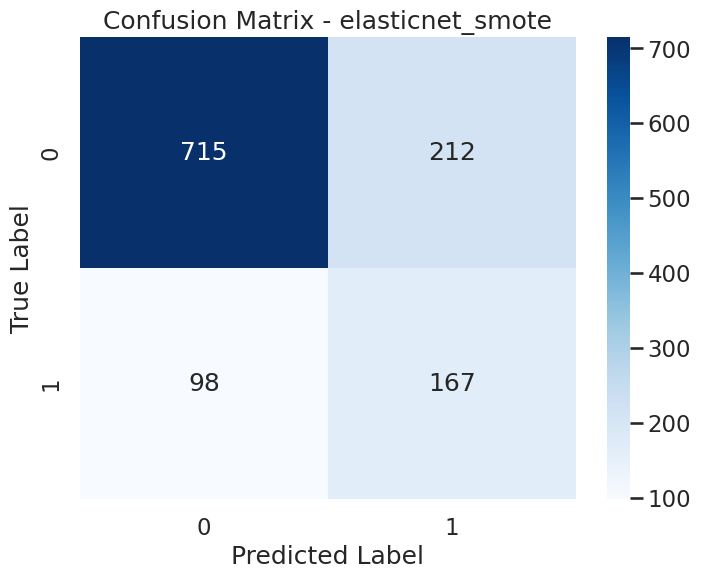

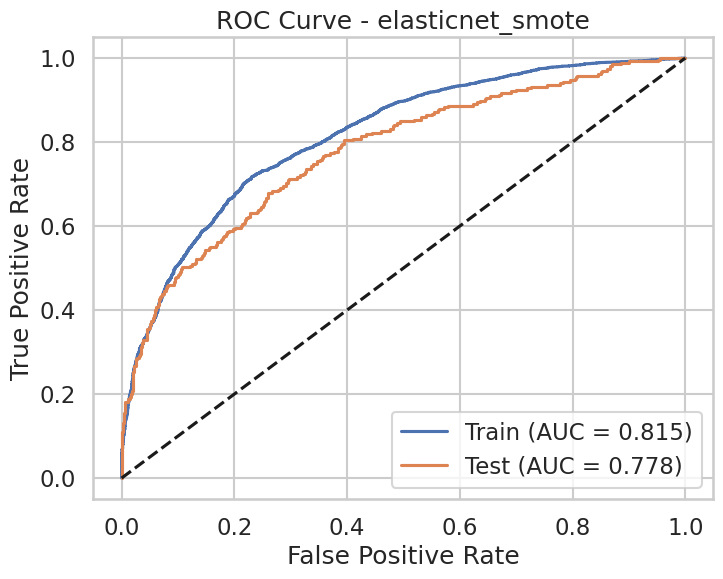

In [60]:
# Exécuter les pipelines
pipeline_original = run_complete_analysis(X_train_full, X_test_full, y_train, y_test, is_feature_engineered=False)

### Résultats des Modèles Sans Feature Engineering

Les modèles évalués sont :

1. **Régression Logistique Simple** : Ajustée sans balancing, puis avec class weights et SMOTE pour le déséquilibre des classes.
2. **Ridge, Lasso, ElasticNet** : Ajustés avec des paramètres de régularisation et utilisant différents balances (`class weights` et SMOTE).

Les différentes variantes ont été testées sur les données d'entraînement et de test, et nous avons évalué les performances à l'aide de plusieurs métriques, telles que la précision, le rappel, le F1 score, et l'AUC (Area Under the Curve).

Voici un résumé des résultats :

- **Modèle de base (sans balancing)** :
  - Les résultats montrent une précision globale correcte (81%) avec un F1 score plus faible (43%) pour la classe minoritaire. La matrice de confusion montre que ce modèle a des difficultés à identifier correctement les exemples de la classe positive (BAD = 1), avec un rappel de seulement 32%.
- **Ridge avec balancing (`class weights`)** :
  - La régularisation L2 (Ridge) a été appliquée avec `class weights` pour compenser le déséquilibre des classes. Ce modèle montre une amélioration significative en termes de rappel pour la classe minoritaire (61%), mais la précision diminue, indiquant une augmentation des faux positifs. Le F1 score atteint 51%, ce qui est meilleur que le modèle de base.

- **Lasso avec balancing (`class weights`)** :
  - Avec Lasso, nous observons une précision plus élevée (77%) et un rappel modéré (24%). Le F1 score est légèrement inférieur (37%) par rapport à Ridge, probablement dû à l'effet de la régularisation L1, qui force certains coefficients à zéro, simplifiant ainsi le modèle.

- **ElasticNet avec balancing (`class weights`)** :
  - ElasticNet, une combinaison de L1 et L2, produit un F1 score de 27%. Le modèle est trop simplifié, probablement parce que la régularisation est trop forte, ce qui empêche d'atteindre de bonnes performances sur la classe minoritaire.

### Application de SMOTE pour Gérer le Déséquilibre des Classes

Ensuite, nous avons utilisé **SMOTE** (Synthetic Minority Over-sampling Technique) pour équilibrer les classes avant l'entraînement des modèles. Voici les principaux résultats :

- **Régression Logistique avec SMOTE** :
  - Le modèle montre une amélioration du rappel pour la classe minoritaire (63%) tout en maintenant une précision acceptable (44%). Le F1 score est à 52%, ce qui est un bon compromis pour une première itération.
  
- **Ridge, Lasso, ElasticNet avec SMOTE** :
  - Avec Ridge, nous avons observé une performance similaire à la régression logistique simple avec SMOTE. Lasso et ElasticNet, par contre, montrent un léger recul en termes de précision et de F1 score, ce qui pourrait indiquer que la régularisation L1 est moins bien adaptée dans ce contexte d'échantillonnage sur les données synthétiques.


Résultats pour les données originales:


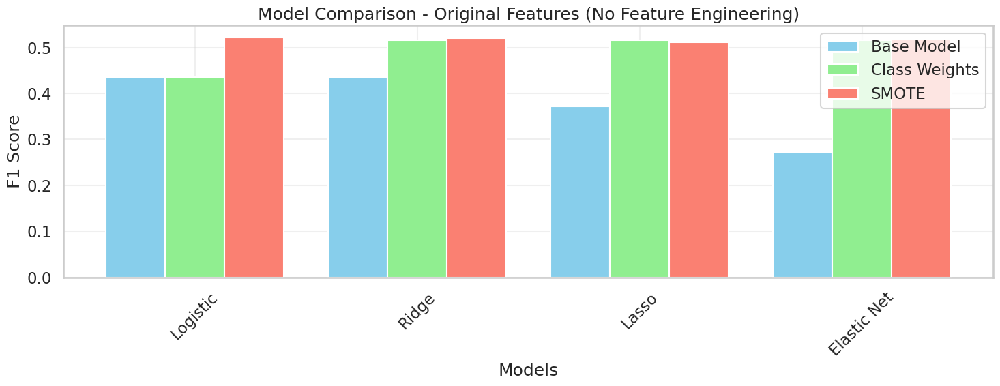


Résultats détaillés pour Original Features (No Feature Engineering):


In [61]:
# Créer la comparaison
comparison = ModelResultsComparison()

# Ajouter les résultats
comparison.add_results('original', y_test, pipeline_original.results, is_feature_engineered=False)

print("\nRésultats pour les données originales:")
comparison.plot_individual_comparison('original')

### Conclusions

- **Régression Logistique Simple** : Sans balancing, le modèle a une bonne précision, mais peine à bien classer les exemples minoritaires.
- **Régularisation et Balancing (`class weights` et SMOTE)** : L'utilisation de `class weights` et de SMOTE améliore le rappel pour la classe minoritaire, mais impacte parfois la précision globale. Le compromis entre précision et rappel doit être choisi en fonction de l'objectif spécifique (par exemple, minimiser les faux négatifs vs minimiser les faux positifs).
- **Ridge vs Lasso vs ElasticNet non équilibré** : Ridge semble offrir les meilleures performances en termes de compromis entre précision et rappel, tandis que Lasso et ElasticNet simplifient excessivement le modèle.

Ces premiers résultats montrent la nécessité d'adapter la stratégie de balancing et la régularisation pour obtenir de meilleures performances. Les prochaines étapes incluront l'application de techniques de **feature engineering** et l'optimisation des hyperparamètres pour tenter d'améliorer ces résultats.

## Regression Logistique avec Discrétisation

Pour cette étape, nous analysons les variables numériques afin de les discrétiser, c'est-à-dire les transformer en catégories. Cette technique permet de simplifier les données et de capturer des patterns qui pourraient ne pas être détectés avec des variables continues.

### Analyse Exploratoire pour la Discrétisation

La fonction `analyze_for_binning` a été utilisée pour explorer la distribution de chaque variable numérique afin de déterminer une méthode appropriée pour la discrétisation. Voici un exemple des analyses effectuées :

- **Distribution** : Visualisation de l'histogramme et du boxplot de chaque variable pour évaluer la dispersion et les valeurs aberrantes.
- **Test de Normalité** : Utilisation du test de normalité pour vérifier si les données suivent une distribution normale (p-value très faible indique que les données ne sont pas normalement distribuées).


Analyse pour LOAN:

Stats descriptives:
count    4766.00
mean    18609.65
std     11012.58
min      1100.00
25%     11200.00
50%     16400.00
75%     23300.00
max     89900.00
Name: LOAN, dtype: float64


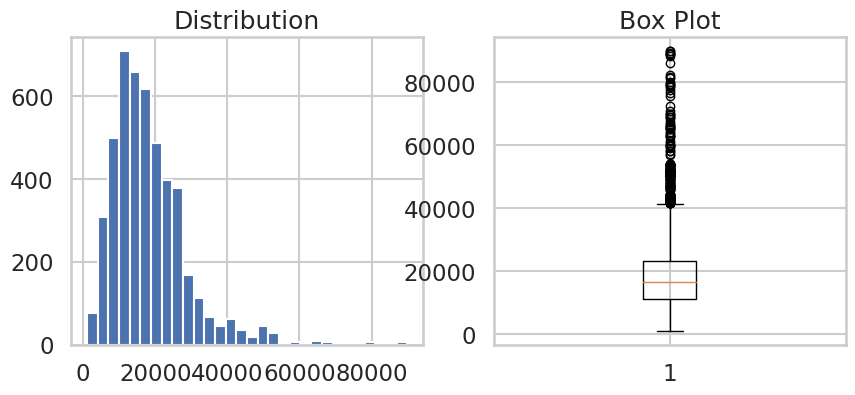


Test normalité p-value: 0.0

Analyse pour MORTDUE:

Stats descriptives:
count     4766.00
mean     73090.89
std      42938.36
min       2063.00
25%      48054.00
50%      65014.50
75%      88146.00
max     399550.00
Name: MORTDUE, dtype: float64


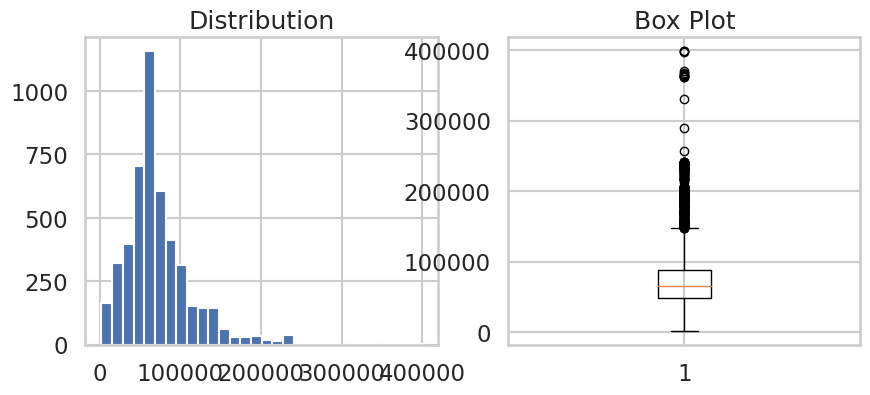


Test normalité p-value: 0.0

Analyse pour VALUE:

Stats descriptives:
count     4766.00
mean    101525.86
std      56797.15
min       8000.00
25%      66754.25
50%      89276.00
75%     118652.25
max     855909.00
Name: VALUE, dtype: float64


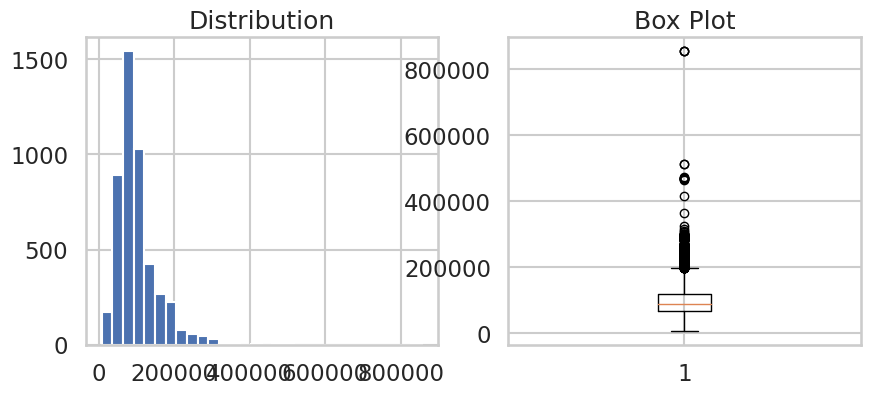


Test normalité p-value: 0.0

Analyse pour YOJ:

Stats descriptives:
count   4766.00
mean       8.78
std        7.30
min        0.00
25%        3.00
50%        7.00
75%       12.00
max       41.00
Name: YOJ, dtype: float64


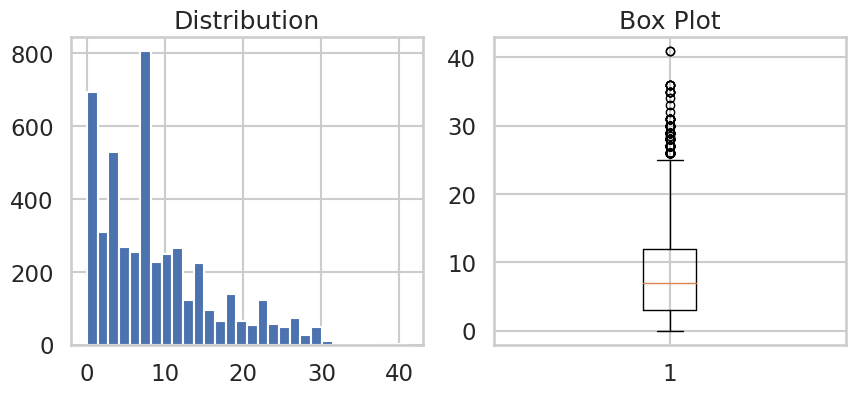


Test normalité p-value: 2.605481117173365e-150

Analyse pour DEROG:

Stats descriptives:
count   4766.00
mean       0.22
std        0.79
min        0.00
25%        0.00
50%        0.00
75%        0.00
max       10.00
Name: DEROG, dtype: float64


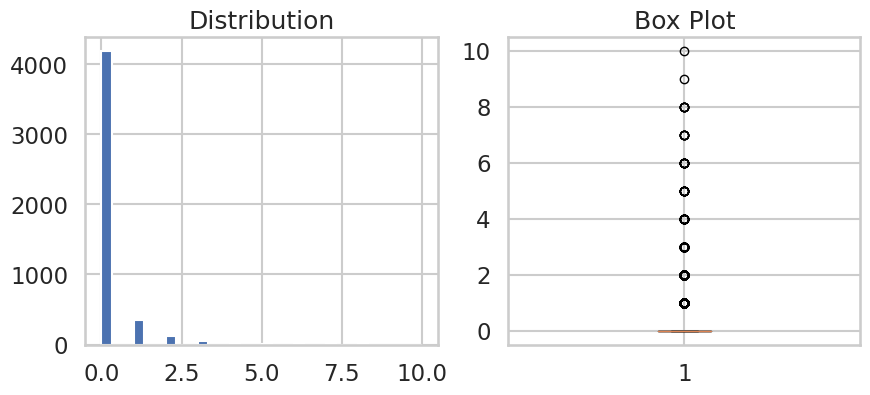


Test normalité p-value: 0.0

Analyse pour DELINQ:

Stats descriptives:
count   4766.00
mean       0.38
std        1.03
min        0.00
25%        0.00
50%        0.00
75%        0.00
max       12.00
Name: DELINQ, dtype: float64


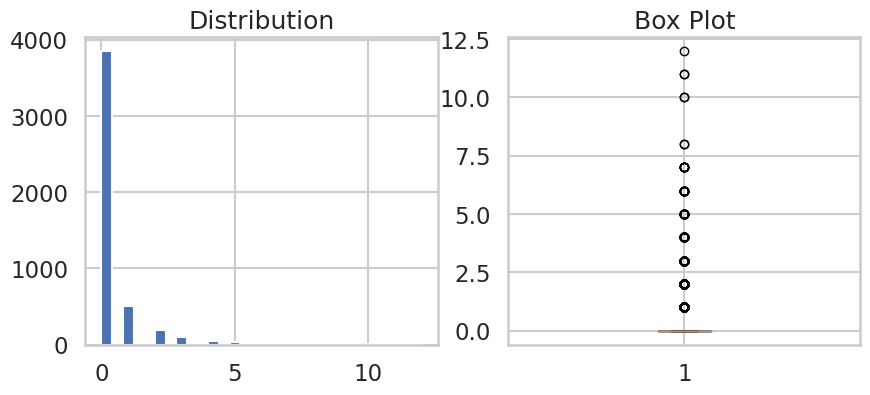


Test normalité p-value: 0.0

Analyse pour CLAGE:

Stats descriptives:
count   4766.00
mean     179.09
std       82.06
min        0.00
25%      117.11
50%      173.07
75%      227.67
max      649.75
Name: CLAGE, dtype: float64


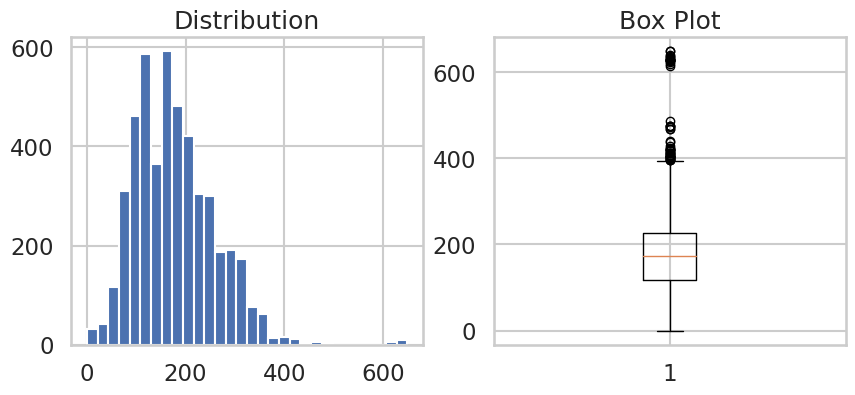


Test normalité p-value: 7.5666706214076065e-177

Analyse pour NINQ:

Stats descriptives:
count   4766.00
mean       1.17
std        1.67
min        0.00
25%        0.00
50%        1.00
75%        2.00
max       17.00
Name: NINQ, dtype: float64


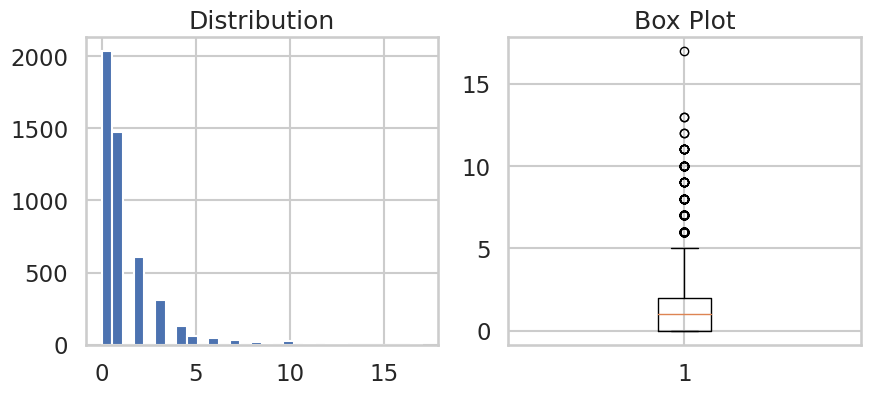


Test normalité p-value: 0.0

Analyse pour CLNO:

Stats descriptives:
count   4766.00
mean      21.22
std        9.89
min        0.00
25%       15.00
50%       20.00
75%       26.00
max       71.00
Name: CLNO, dtype: float64


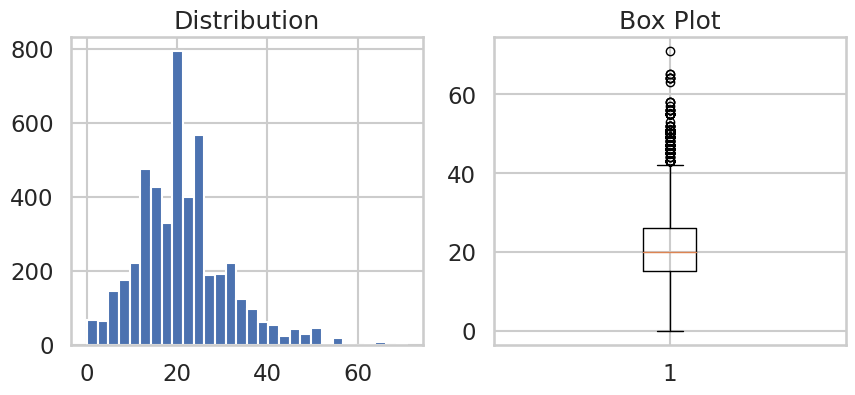


Test normalité p-value: 7.585454457501384e-117

Analyse pour DEBTINC:

Stats descriptives:
count   4766.00
mean      33.88
std        7.48
min        0.52
25%       30.61
50%       34.73
75%       37.95
max      144.19
Name: DEBTINC, dtype: float64


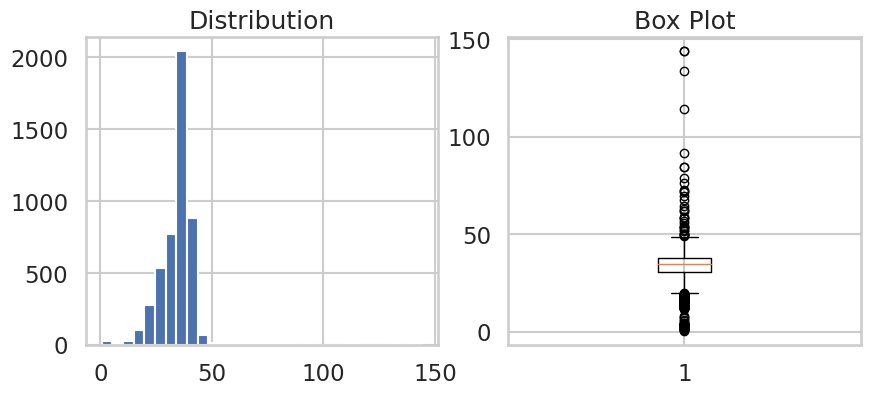


Test normalité p-value: 0.0


In [62]:
def analyze_for_binning(X, var):
    print(f"\nAnalyse pour {var}:")
    # Stats descriptives
    print("\nStats descriptives:")
    print(X[var].describe())

    # Distribution
    plt.figure(figsize=(10, 4))
    plt.subplot(121)
    plt.hist(X[var], bins=30)
    plt.title('Distribution')

    # Box plot
    plt.subplot(122)
    plt.boxplot(X[var])
    plt.title('Box Plot')
    plt.show()

    # Test normalité
    from scipy import stats
    stat, p_value = stats.normaltest(X[var])
    print(f"\nTest normalité p-value: {p_value}")

# Pour chaque variable numérique
for var in numerical_variables:
    analyze_for_binning(X_train_logreg, var)

### Discrétisation des Variables

Nous avons appliqué la fonction `discretize_data` pour transformer les variables numériques en classes distinctes. Voici les principales catégories utilisées :

1. **Variables monétaires** (`LOAN`, `MORTDUE`, `VALUE`) : Discrétisées en 5 classes selon la stratégie de quantiles.
2. **Variables de comptage** (`DEROG`, `DELINQ`, `NINQ`) : Discrétisées en 3 classes avec des seuils spécifiques (0, 1, 2+).
3. **Variables de durée** (`YOJ`, `CLAGE`) : Discrétisées en 4 classes selon la stratégie de quantiles.
4. **Autres variables numériques** (`CLNO`, `DEBTINC`) : Discrétisées en 4 ou 5 classes selon la stratégie de quantiles.

### Regression Logistique avec traitement des desequilibres entre classes

In [63]:
def discretize_data(X_train, X_test):
   X_train_disc = X_train.copy()
   X_test_disc = X_test.copy()
   discretizers = {}

   # 1. Variables monétaires (5 classes)
   monetary_vars = {
       'LOAN': 5,
       'MORTDUE': 5,
       'VALUE': 5
   }

   # 2. Variables de comptage (3 classes)
   count_vars = {
       'DEROG': [[-np.inf, 0, 1, np.inf], [0, 1, 2]],  # 0, 1, 2+
       'DELINQ': [[-np.inf, 0, 1, np.inf], [0, 1, 2]], # 0, 1, 2+
       'NINQ': [[-np.inf, 0, 2, np.inf], [0, 1, 2]]    # 0, 1-2, 3+
   }

   # 3. Variables de durée (4 classes)
   duration_vars = {
       'YOJ': 4,
       'CLAGE': 4
   }

   # 4. Autres variables numériques
   other_vars = {
       'CLNO': 4,     # quartiles
       'DEBTINC': 5   # quintiles
   }

   # Discrétisation des variables monétaires, durée et autres
   for var, n_bins in {**monetary_vars, **duration_vars, **other_vars}.items():
       discretizer = KBinsDiscretizer(
           n_bins=n_bins,
           encode='ordinal',
           strategy='quantile'
       )
       X_train_disc[var] = discretizer.fit_transform(X_train[[var]])
       X_test_disc[var] = discretizer.transform(X_test[[var]])
       discretizers[var] = discretizer

       # Afficher les seuils pour chaque variable
       print(f"\nSeuils pour {var}:")
       print(discretizer.bin_edges_[0])

   # Discrétisation spéciale pour les variables de comptage
   for var, (bins, labels) in count_vars.items():
       X_train_disc[var] = pd.cut(X_train[var],
                                 bins=bins,
                                 labels=labels)
       X_test_disc[var] = pd.cut(X_test[var],
                                bins=bins,
                                labels=labels)
       print(f"\nSeuils pour {var}:")
       print(f"Bins: {bins}")
       print(f"Labels: {labels}")

   return X_train_disc, X_test_disc, discretizers

# Appliquer la discrétisation
X_train_discretized, X_test_discretized, discretizers = discretize_data(X_train_logreg, X_test_logreg)


Seuils pour LOAN:
[ 1100. 10100. 14500. 18800. 25000. 89900.]

Seuils pour MORTDUE:
[  2063.  43314.  60719.  70804.  96435. 399550.]

Seuils pour VALUE:
[  8000.  62109.  80527.  98065. 130216. 855909.]

Seuils pour YOJ:
[ 0.  3.  7. 12. 41.]

Seuils pour CLAGE:
[  0.         117.10779285 173.07296854 227.67129362 649.74710438]

Seuils pour CLNO:
[ 0. 15. 20. 26. 71.]

Seuils pour DEBTINC:
[  0.52449922  29.13369741  34.73427716  38.94860467 144.18900129]

Seuils pour DEROG:
Bins: [-inf, 0, 1, inf]
Labels: [0, 1, 2]

Seuils pour DELINQ:
Bins: [-inf, 0, 1, inf]
Labels: [0, 1, 2]

Seuils pour NINQ:
Bins: [-inf, 0, 2, inf]
Labels: [0, 1, 2]


Pour chaque variable, nous avons appliqué une méthode de discrétisation et obtenu les seuils pour les différentes classes, par exemple :

- **`LOAN`** : Discrétisé en 5 classes avec des seuils aux quantiles [1100, 10100, 14500, 18800, 25000, 89900].
- **`DEROG`** : Discrétisé en 3 classes (0, 1, 2+) pour simplifier l'analyse.

La discrétisation permet de mieux gérer les valeurs extrêmes et de rendre les modèles plus robustes face aux variations. Cette approche sera testée lors des prochaines étapes de modélisation pour évaluer son impact sur la performance des modèles.

Pour préparer les données discrétisées à l'entraînement des modèles, nous avons appliqué des techniques d'encodage :

1. **Encodage Ordinal** pour les variables numériques discrétisées, afin de conserver l'ordre des catégories.
2. **One-Hot Encoding** pour les variables catégorielles d'origine, afin de représenter chaque catégorie comme une colonne binaire.

In [64]:
# Convertir en type catégoriel
for col in X_train_discretized.columns:
    if col in numerical_variables:
        X_train_discretized[col] = X_train_discretized[col].astype('category')
        X_test_discretized[col] = X_test_discretized[col].astype('category')

# Vérifier les types
print(X_train_discretized.dtypes)

LOAN       category
MORTDUE    category
VALUE      category
REASON       object
JOB          object
YOJ        category
DEROG      category
DELINQ     category
CLAGE      category
NINQ       category
CLNO       category
DEBTINC    category
dtype: object


In [65]:
def encode_discretized_data(X_train_disc, X_test_disc, original_categorical_variables):
    X_train_encoded = X_train_disc.copy()
    X_test_encoded = X_test_disc.copy()

    # 1. Encodage ordinal pour les variables numériques discrétisées
    ordinal_encoder = OrdinalEncoder()
    numerical_cols = [col for col in X_train_disc.columns if col in numerical_variables]

    X_train_encoded[numerical_cols] = ordinal_encoder.fit_transform(X_train_disc[numerical_cols])
    X_test_encoded[numerical_cols] = ordinal_encoder.transform(X_test_disc[numerical_cols])

    # 2. One-hot encoding pour les variables catégorielles originales
    onehot_encoded_train = pd.get_dummies(X_train_disc[original_categorical_variables],
                                        drop_first=True).astype(int)  # Convertir en int
    onehot_encoded_test = pd.get_dummies(X_test_disc[original_categorical_variables],
                                       drop_first=True).astype(int)   # Convertir en int

    # S'assurer que test a les mêmes colonnes que train
    onehot_encoded_test = onehot_encoded_test.reindex(columns=onehot_encoded_train.columns,
                                                     fill_value=0)

    # 3. Combiner les deux types d'encodage
    X_train_final = pd.concat([
        X_train_encoded[numerical_cols],
        onehot_encoded_train
    ], axis=1)

    X_test_final = pd.concat([
        X_test_encoded[numerical_cols],
        onehot_encoded_test
    ], axis=1)

    return X_train_final, X_test_final

# Appliquer l'encodage
X_train_encoded_final, X_test_encoded_final = encode_discretized_data(
    X_train_discretized,
    X_test_discretized,
    categorical_variables
)

# Vérifier
print("\nAperçu des données encodées:")
print(X_train_encoded_final.head())


Aperçu des données encodées:
      LOAN  MORTDUE  VALUE  YOJ  DEROG  DELINQ  CLAGE  NINQ  CLNO  DEBTINC  \
944   0.00     2.00   1.00 0.00   0.00    2.00   1.00  0.00  2.00     0.00   
5755  4.00     0.00   1.00 2.00   0.00    0.00   3.00  0.00  1.00     0.00   
2259  1.00     3.00   2.00 3.00   0.00    0.00   3.00  2.00  2.00     1.00   
12    0.00     1.00   0.00 1.00   0.00    0.00   0.00  1.00  2.00     2.00   
1117  0.00     1.00   3.00 1.00   0.00    0.00   2.00  0.00  0.00     0.00   

      REASON_HomeImp  JOB_Office  JOB_Other  JOB_ProfExe  JOB_Sales  JOB_Self  
944                1           0          0            0          0         0  
5755               1           1          0            0          0         0  
2259               0           0          0            0          0         0  
12                 1           0          1            0          0         0  
1117               0           0          0            1          0         0  


In [66]:
# 1. Cramer's V for categorical-categorical associations

# Identifier toutes les variables catégorielles/discrétisées
# (exclure les colonnes one-hot encodées)
categorical_and_discretized = [col for col in X_train_discretized.columns if X_train_discretized[col].dtype.name == 'category']

def cramers_v(var1, var2):
    crosstab = pd.crosstab(var1, var2)
    chi2 = chi2_contingency(crosstab)[0]
    n = crosstab.sum().sum()
    min_dim = min(crosstab.shape) - 1
    return np.sqrt(chi2 / (n * min_dim))

# Create matrix
n_vars = len(categorical_and_discretized)
cramer_matrix = np.zeros((n_vars, n_vars))

# Fill matrix
for i in range(n_vars):
    for j in range(i+1, n_vars):
        v = cramers_v(X_train_discretized[categorical_and_discretized[i]],
                     X_train_discretized[categorical_and_discretized[j]])
        cramer_matrix[i,j] = v
        cramer_matrix[j,i] = v

# Create DataFrame
cramer_df = pd.DataFrame(cramer_matrix,
                        index=categorical_and_discretized,
                        columns=categorical_and_discretized)

# Style the DataFrame pour mieux voir les associations fortes
styled_df = cramer_df.style.background_gradient(cmap='YlOrRd')\
    .format('{:.4f}')\
    .set_caption("Cramer's V values (>0.3 might indicate strong association)")

display(styled_df)

# Afficher les associations fortes
print("\nAssociations fortes (Cramer's V > 0.3):")
for i in range(len(categorical_and_discretized)):
    for j in range(i+1, len(categorical_and_discretized)):
        v = cramer_matrix[i,j]
        if v > 0.3:
            print(f"{categorical_and_discretized[i]} & {categorical_and_discretized[j]}: {v:.4f}")

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
LOAN,0.0000,0.1495,0.1958,0.0773,0.0502,0.0647,0.0806,0.0484,0.1078,0.1093
MORTDUE,0.1495,0.0000,0.5458,0.0921,0.0479,0.0683,0.1146,0.0726,0.1953,0.1122
VALUE,0.1958,0.5458,0.0000,0.0545,0.0661,0.0616,0.1367,0.0579,0.1953,0.1070
YOJ,0.0773,0.0921,0.0545,0.0000,0.0498,0.0597,0.1064,0.0679,0.0774,0.0597
DEROG,0.0502,0.0479,0.0661,0.0498,0.0000,0.1337,0.0624,0.1028,0.0390,0.0928
DELINQ,0.0647,0.0683,0.0616,0.0597,0.1337,0.0000,0.0446,0.0661,0.1019,0.1154
CLAGE,0.0806,0.1146,0.1367,0.1064,0.0624,0.0446,0.0000,0.0778,0.1572,0.0465
NINQ,0.0484,0.0726,0.0579,0.0679,0.1028,0.0661,0.0778,0.0000,0.1117,0.1417
CLNO,0.1078,0.1953,0.1953,0.0774,0.0390,0.1019,0.1572,0.1117,0.0000,0.0902
DEBTINC,0.1093,0.1122,0.1070,0.0597,0.0928,0.1154,0.0465,0.1417,0.0902,0.0000



Associations fortes (Cramer's V > 0.3):
MORTDUE & VALUE: 0.5458


Les résultats montrent, une forte association entre `MORTDUE` et `VALUE` (Cramer's V = 0.5458), indiquant une corrélation entre le montant dû sur le prêt immobilier et la valeur de la propriété.

In [67]:
# 1. Régression logistique avec class weights
if isinstance(y_train, pd.DataFrame):
   y_train = y_train.squeeze()

# Reset des indices
y_train = y_train.reset_index(drop=True)
X_train_discretized = X_train_encoded_final.reset_index(drop=True)
X_test_discretized = X_test_encoded_final.reset_index(drop=True)

### Résultats des Modèles avec Discrétisation



=== MODÈLES AVEC CLASS WEIGHTS (FEATURE ENGINEERING) ===
Optimization terminated successfully.
         Current function value: 0.378679
         Iterations 7

Statsmodels Logistic Regression Summary:
                           Logit Regression Results                           
Dep. Variable:                    BAD   No. Observations:                 4766
Model:                          Logit   Df Residuals:                     4749
Method:                           MLE   Df Model:                           16
Date:                Sun, 27 Oct 2024   Pseudo R-squ.:                  0.2291
Time:                        21:24:17   Log-Likelihood:                -1804.8
converged:                       True   LL-Null:                       -2341.0
Covariance Type:            nonrobust   LLR p-value:                3.336e-218
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------


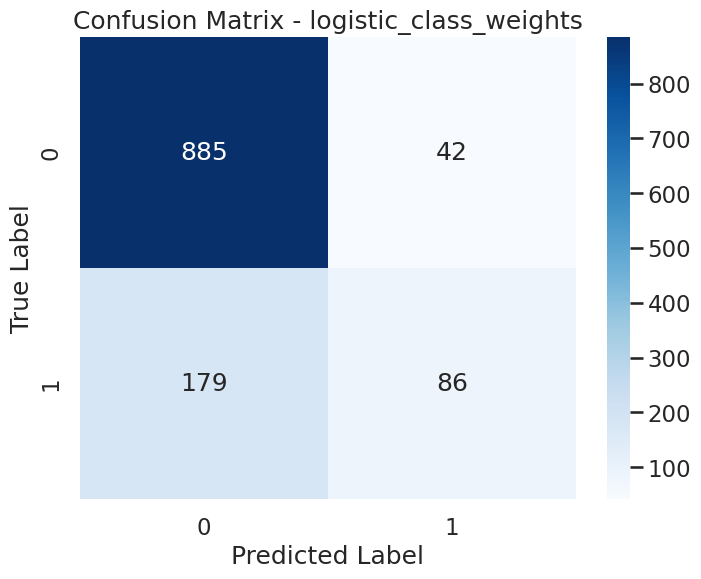

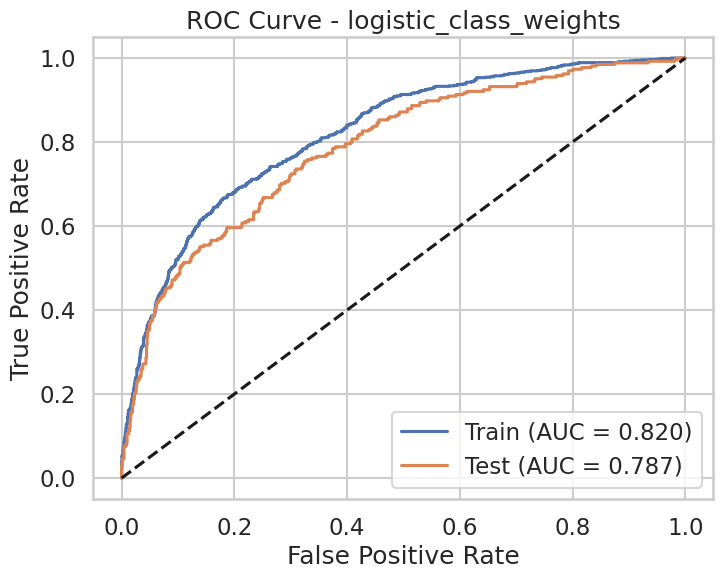


Fitting RIDGE model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.39069399370546126, 'penalty': 'l2'}
Meilleur score F1: 0.5307

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.39069399370546126, 'penalty': 'l2'}
   Score F1 moyen: 0.5307
2. Paramètres: {'C': 0.18420699693267145, 'penalty': 'l2'}
   Score F1 moyen: 0.5305
3. Paramètres: {'C': 0.5689866029018293, 'penalty': 'l2'}
   Score F1 moyen: 0.5304
4. Paramètres: {'C': 0.2682695795279724, 'penalty': 'l2'}
   Score F1 moyen: 0.5303
5. Paramètres: {'C': 1.2067926406393288, 'penalty': 'l2'}
   Score F1 moyen: 0.5302

Results for RIDGE_CLASS_WEIGHTS:

Training Set Metrics:
accuracy: 0.7570
precision: 0.4248
recall: 0.7234
f1: 0.5353
roc_auc: 0.8213

Test Set Metrics:
accuracy: 0.7240
precision: 0.4238
recall: 0.6717
f1: 0.5197
roc_auc: 0.7867

Classification Report - Test Set:
              precision    recall  f1-score   support

           0     0.8873    0.7389    0.8064       927
           1     0.4238    

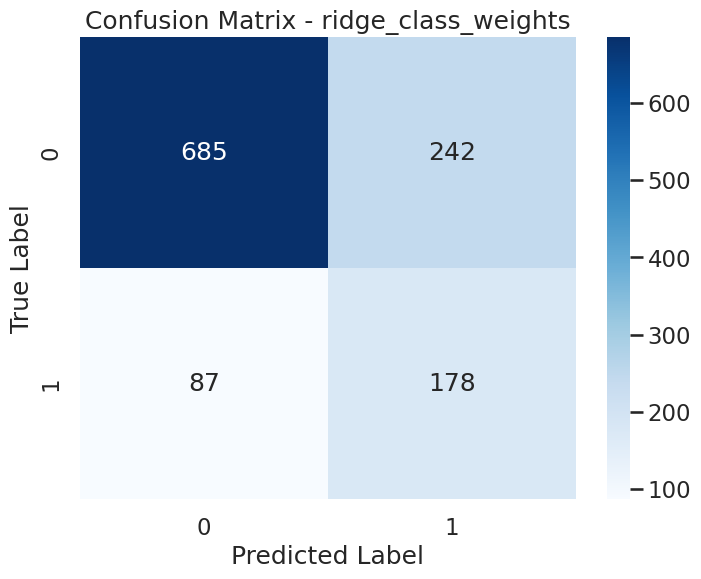

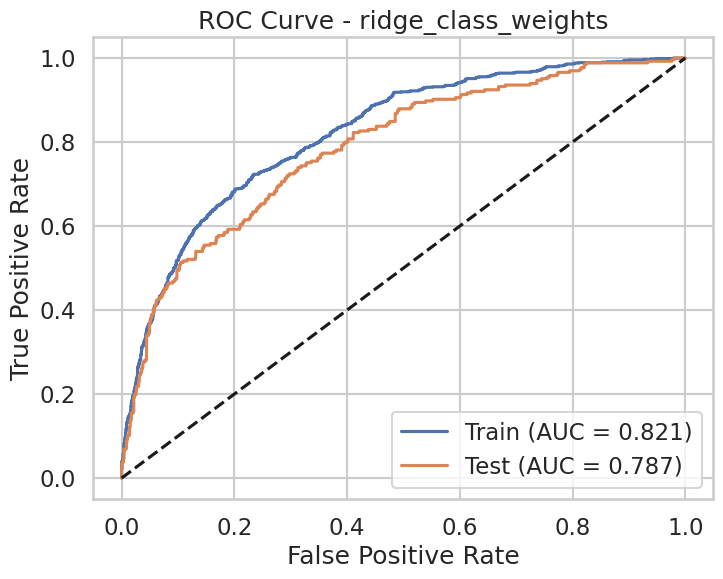


Fitting LASSO model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.03906939937054615, 'penalty': 'l1', 'solver': 'liblinear'}
Meilleur score F1: 0.5293

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.03906939937054615, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5293
2. Paramètres: {'C': 0.08286427728546843, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5293
3. Paramètres: {'C': 0.03556480306223129, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5289
4. Paramètres: {'C': 0.029470517025518096, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5288
5. Paramètres: {'C': 0.032374575428176434, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5284

Results for LASSO_CLASS_WEIGHTS:

Training Set Metrics:
accuracy: 0.7543
precision: 0.4205
recall: 0.7148
f1: 0.5295
roc_auc: 0.8168

Test Set Metrics:
accuracy: 0.7248
precision: 0.4269
recall: 0.6943
f1: 0.5287
roc_auc: 0.7862

Classification Report - Tes

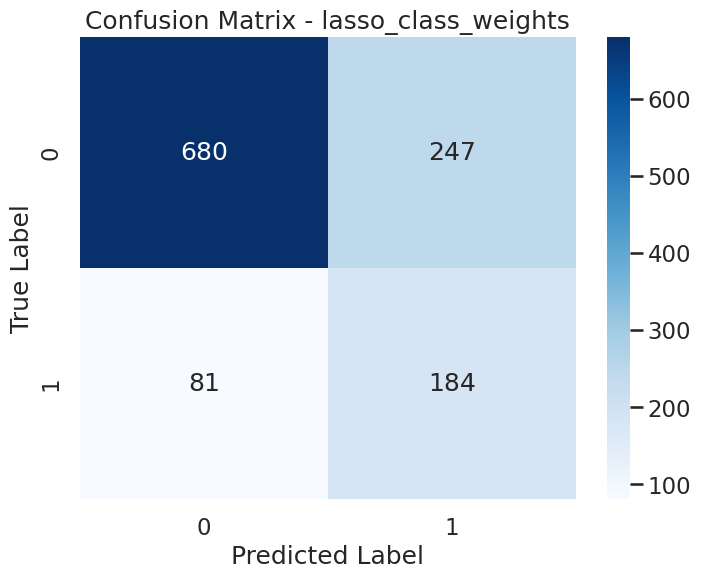

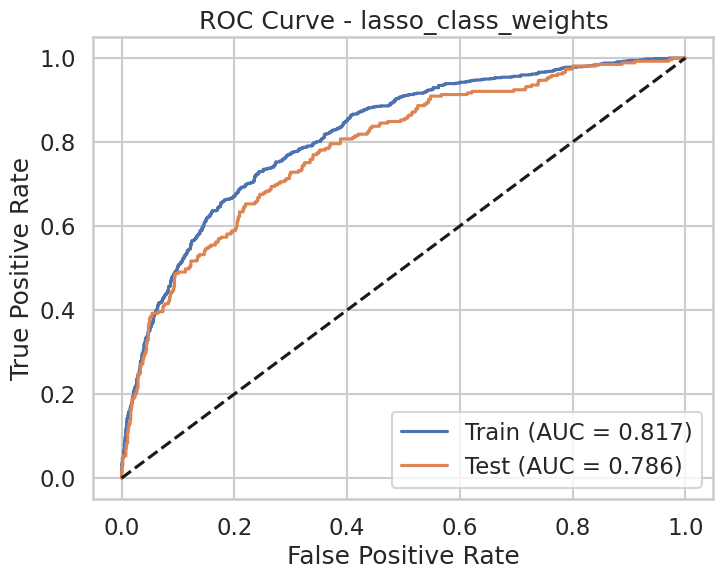


Fitting ELASTICNET model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.05298316906283707, 'l1_ratio': 0.5, 'penalty': 'elasticnet', 'solver': 'saga'}
Meilleur score F1: 0.5293

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.05298316906283707, 'l1_ratio': 0.5, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5293
2. Paramètres: {'C': 0.02807216203941177, 'l1_ratio': 0.3, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5288
3. Paramètres: {'C': 0.04520353656360243, 'l1_ratio': 0.39999999999999997, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5288
4. Paramètres: {'C': 0.05298316906283707, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5288
5. Paramètres: {'C': 0.04520353656360243, 'l1_ratio': 0.6, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5286

Results for ELASTICNET_CLASS_WEIGHTS:

Training Set Metrics:
accuracy: 0.7581
precision: 0.4253
recall: 0.7137
f1: 0.5

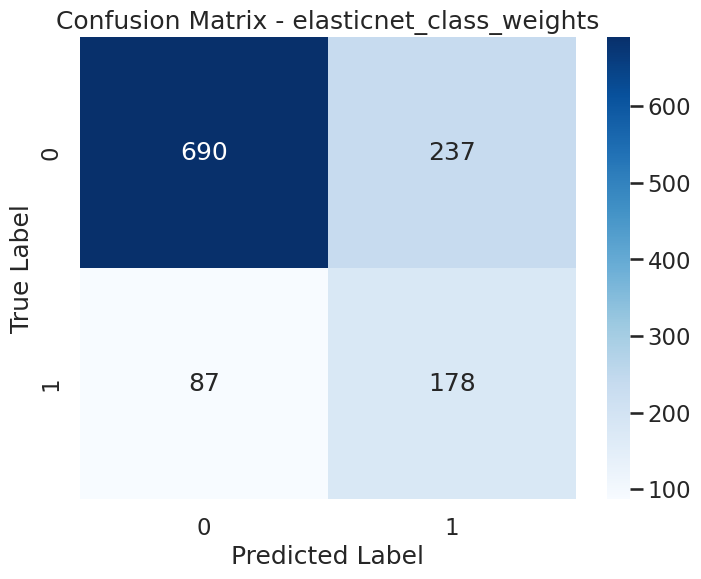

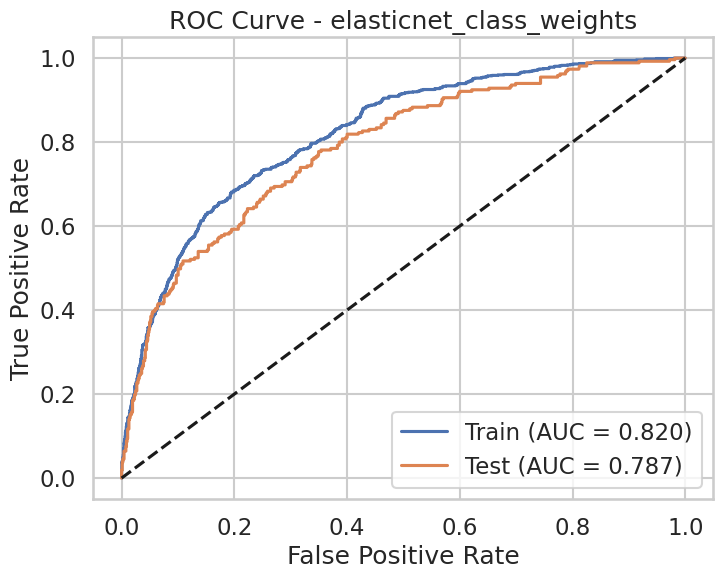


=== MODÈLES AVEC SMOTE (FEATURE ENGINEERING) ===
Optimization terminated successfully.
         Current function value: 0.493290
         Iterations 6

Statsmodels Logistic Regression Summary:
                           Logit Regression Results                           
Dep. Variable:                    BAD   No. Observations:                 7688
Model:                          Logit   Df Residuals:                     7671
Method:                           MLE   Df Model:                           16
Date:                Sun, 27 Oct 2024   Pseudo R-squ.:                  0.2883
Time:                        21:24:58   Log-Likelihood:                -3792.4
converged:                       True   LL-Null:                       -5328.9
Covariance Type:            nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const   

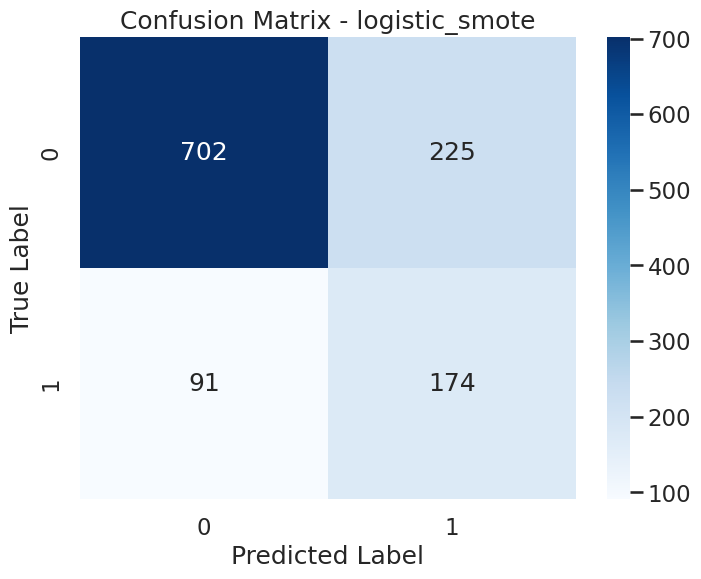

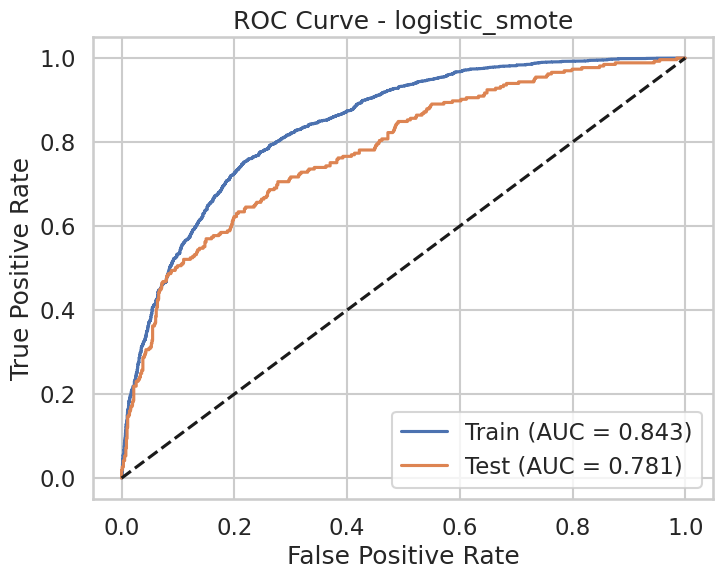


Fitting RIDGE model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 11.513953993264458, 'penalty': 'l2'}
Meilleur score F1: 0.7594

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 11.513953993264458, 'penalty': 'l2'}
   Score F1 moyen: 0.7594
2. Paramètres: {'C': 159.98587196060572, 'penalty': 'l2'}
   Score F1 moyen: 0.7594
3. Paramètres: {'C': 75.43120063354607, 'penalty': 'l2'}
   Score F1 moyen: 0.7594
4. Paramètres: {'C': 16.768329368110063, 'penalty': 'l2'}
   Score F1 moyen: 0.7594
5. Paramètres: {'C': 109.85411419875572, 'penalty': 'l2'}
   Score F1 moyen: 0.7593

Results for RIDGE_SMOTE:

Training Set Metrics:
accuracy: 0.7673
precision: 0.7745
recall: 0.7542
f1: 0.7642
roc_auc: 0.8427

Test Set Metrics:
accuracy: 0.7357
precision: 0.4372
recall: 0.6566
f1: 0.5249
roc_auc: 0.7811

Classification Report - Test Set:
              precision    recall  f1-score   support

           0     0.8854    0.7584    0.8170       927
           1     0.4372    0.6566    0.

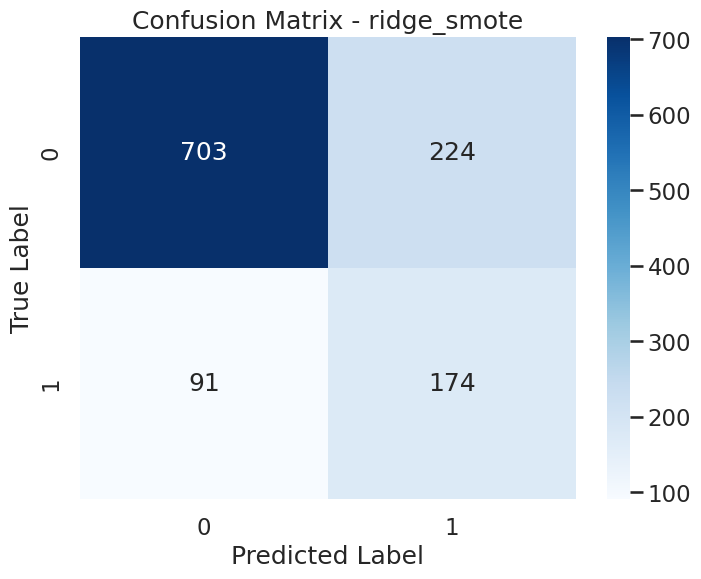

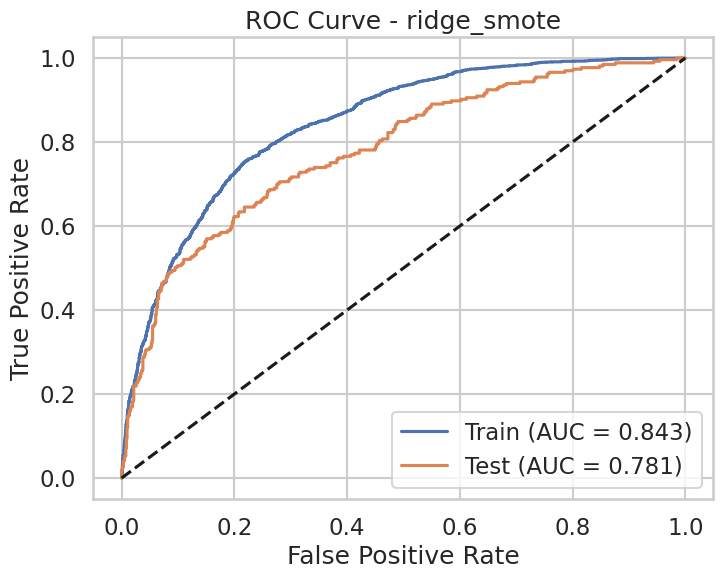


Fitting LASSO model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.09999999999999999, 'penalty': 'l1', 'solver': 'liblinear'}
Meilleur score F1: 0.7541

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.09999999999999999, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7541
2. Paramètres: {'C': 0.09102981779915219, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7533
3. Paramètres: {'C': 0.08286427728546843, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7522
4. Paramètres: {'C': 0.07543120063354615, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7517
5. Paramètres: {'C': 0.06866488450042998, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7517

Results for LASSO_SMOTE:

Training Set Metrics:
accuracy: 0.7614
precision: 0.7686
recall: 0.7482
f1: 0.7582
roc_auc: 0.8420

Test Set Metrics:
accuracy: 0.7332
precision: 0.4346
recall: 0.6642
f1: 0.5254
roc_auc: 0.7842

Classification Report - Test Set:
   

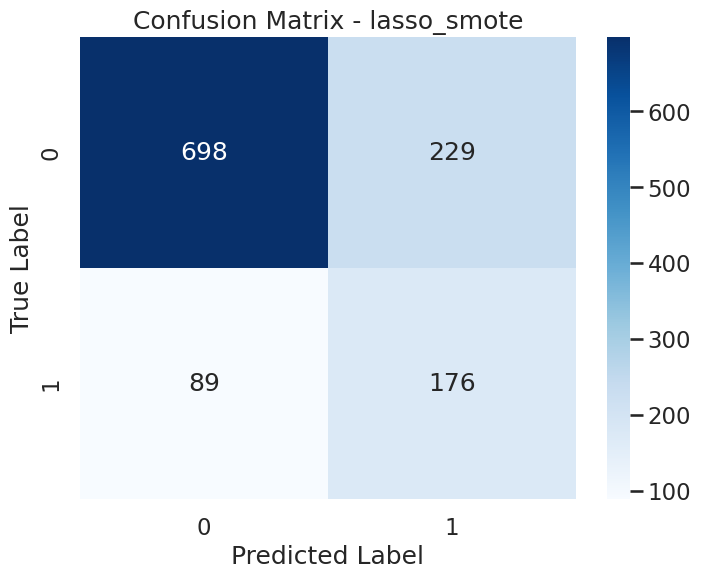

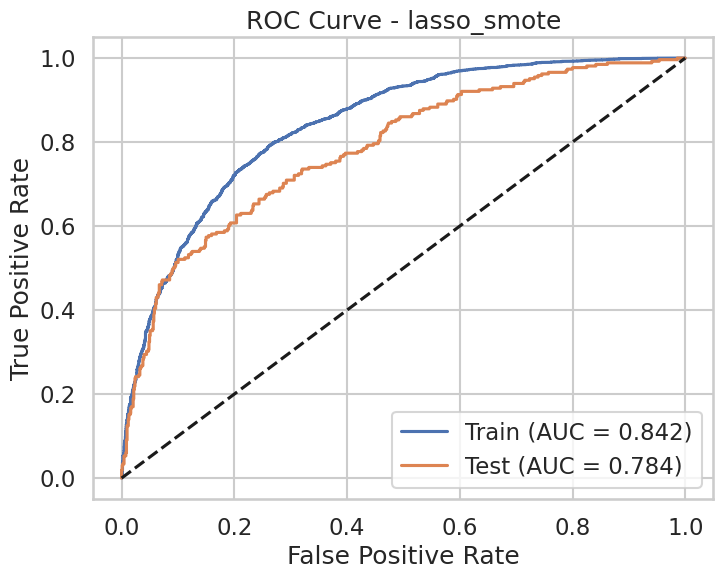


Fitting ELASTICNET model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.3, 'penalty': 'elasticnet', 'solver': 'saga'}
Meilleur score F1: 0.7570

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.3, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7570
2. Paramètres: {'C': 0.07278953843983149, 'l1_ratio': 0.3, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7570
3. Paramètres: {'C': 0.08531678524172805, 'l1_ratio': 0.3, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7566
4. Paramètres: {'C': 0.07278953843983149, 'l1_ratio': 0.39999999999999997, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7565
5. Paramètres: {'C': 0.08531678524172805, 'l1_ratio': 0.39999999999999997, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.7564

Results for ELASTICNET_SMOTE:

Training Set Metrics:
accuracy: 0.7625
precision: 0.7688
recall: 0.7508

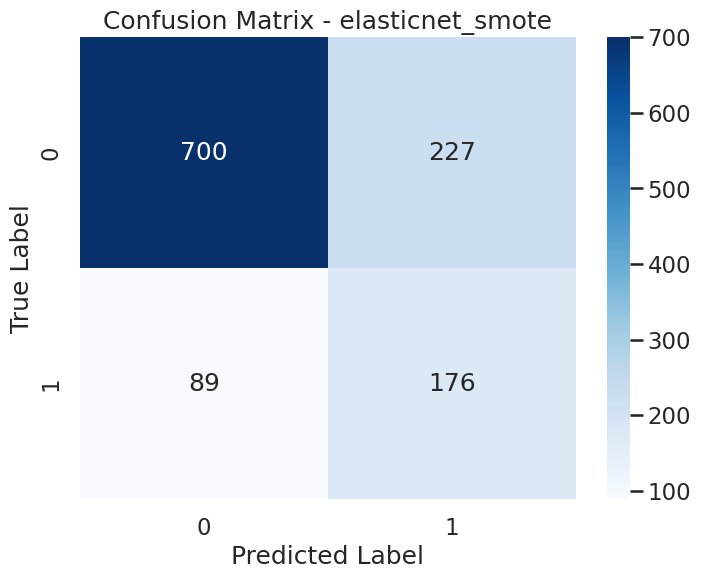

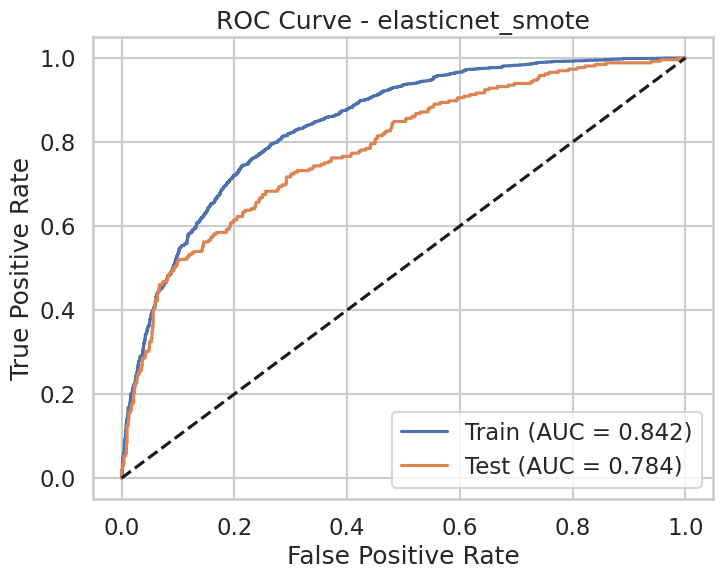

In [68]:
# Execute pipeline
pipeline_discretized = run_complete_analysis(X_train_discretized, X_test_discretized, y_train, y_test, is_feature_engineered=True)

1. **Régression Logistique avec `class weights`** :
   - Ce modèle montre une précision correcte (81%) et un F1 score amélioré (44%) par rapport au modèle sans balancing. Le rappel est également légèrement meilleur (32%), ce qui indique une capacité accrue à détecter la classe minoritaire. Le **feature engineering** semble avoir amélioré la capacité de généralisation du modèle.

2. **Ridge avec `class weights`** :
   - L'ajout de la régularisation L2 combiné avec `class weights` a permis d'améliorer le **rappel** (67%) de manière notable, bien que la précision soit réduite (42%). Cela indique une meilleure capacité à détecter les exemples de la classe minoritaire, mais au coût d'une augmentation des faux positifs.

3. **Lasso avec `class weights`** :
   - Le modèle Lasso, utilisant une régularisation L1, obtient des résultats similaires en termes de rappel et de précision que Ridge. Le **F1 score** est de 52%, ce qui montre une certaine robustesse du modèle, même avec une régularisation L1 qui tend à simplifier le modèle.

4. **ElasticNet avec `class weights`** :
   - ElasticNet, combinant les régularisations L1 et L2, obtient un **F1 score** de 52%. Le modèle se comporte de manière similaire à Lasso, bien que la régularisation combinée permette de trouver un compromis légèrement plus performant entre la réduction des caractéristiques et la capacité de généralisation.

Ensuite, nous avons utilisé **SMOTE** (Synthetic Minority Over-sampling Technique) pour équilibrer les classes avant l'entraînement des modèles avec **feature engineering**. Voici les principaux résultats :

- **Régression Logistique avec SMOTE** :
  - Le modèle montre une amélioration du rappel pour la classe minoritaire (65%) tout en maintenant une précision acceptable (43%). Le F1 score est à 52%, ce qui est un bon compromis pour une première itération.
  
- **Ridge, Lasso, ElasticNet avec SMOTE** :
  - Avec Ridge, nous avons observé une performance similaire à la régression logistique simple avec SMOTE. Lasso et ElasticNet, par contre, montrent un léger recul en termes de précision et de F1 score, ce qui pourrait indiquer que la régularisation L1 est moins bien adaptée dans ce contexte d'échantillonnage sur les données synthétiques.


Comparaison des features discrétisées :


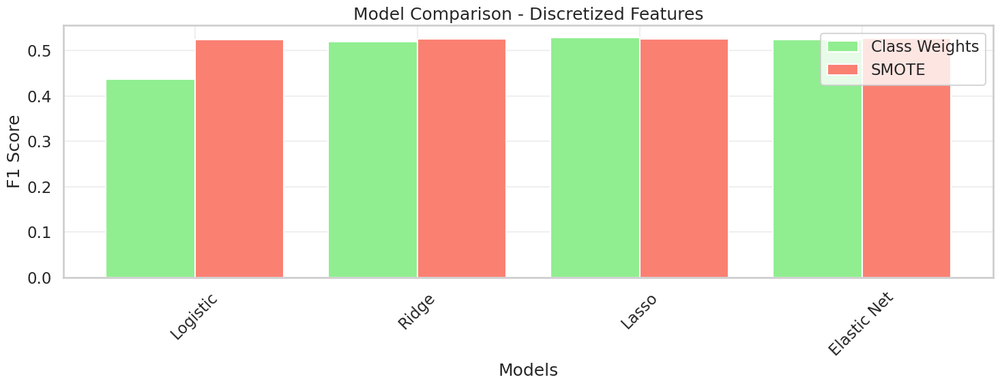


Résultats détaillés pour Discretized Features:


In [69]:
# Results
comparison.add_results('discretized', y_test, pipeline_discretized.results, is_feature_engineered=True)

print("\nComparaison des features discrétisées :")
comparison.plot_individual_comparison('discretized')

### Conclusions

- **Feature Engineering et Balancing** : Le **feature engineering** combiné avec `class weights` et **SMOTE** a permis d'améliorer les performances des modèles, en particulier pour le rappel de la classe minoritaire.
- **Régularisation** : Ridge reste le modèle le plus performant en termes de compromis entre précision et rappel, tandis que Lasso et ElasticNet ont montré des limitations dans ce contexte.

## Regression Logistique avec variables combinée

### Analyse Statistique

In [70]:
# Sur X_train_encoded_final qui contient nos variables discrétisées et encodées
matrice_corr = pd.concat([X_train_full[numerical_variables], y_train], axis=1).corr()
matrice_corr

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,BAD
LOAN,1.00,0.14,0.33,0.09,-0.00,-0.03,0.12,0.04,0.11,0.04,-0.13
MORTDUE,0.14,1.00,0.69,-0.09,-0.06,-0.00,0.06,0.02,0.29,0.13,-0.06
VALUE,0.33,0.69,1.00,0.01,-0.05,0.01,0.18,-0.02,0.33,0.12,-0.08
YOJ,0.09,-0.09,0.01,1.00,-0.06,0.04,0.20,-0.07,0.06,-0.01,-0.07
DEROG,-0.00,-0.06,-0.05,-0.06,1.00,0.14,-0.08,0.15,0.04,0.01,0.28
DELINQ,-0.03,-0.00,0.01,0.04,0.14,1.00,0.04,0.06,0.14,0.04,0.34
CLAGE,0.12,0.06,0.18,0.20,-0.08,0.04,1.00,-0.11,0.24,-0.03,-0.17
NINQ,0.04,0.02,-0.02,-0.07,0.15,0.06,-0.11,1.00,0.07,0.10,0.19
CLNO,0.11,0.29,0.33,0.06,0.04,0.14,0.24,0.07,1.00,0.21,-0.04
DEBTINC,0.04,0.13,0.12,-0.01,0.01,0.04,-0.03,0.10,0.21,1.00,0.10


Il ya des fortes corrélations entre :
- MORTDUE & VALUE (0.691)
- LOAN & VALUE (0.330)

VIF très élevés:
- VALUE (1018)
- MORTDUE (633)
- LOAN (289)
- DEBTINC (156)

Variables liées au crédit:
- DEROG & DELINQ (corrélation faible mais même concept)
- CLNO & CLAGE (lien conceptuel)

In [71]:
def create_improved_features_v2(X_train, X_test, y_train=None):
    """
    Crée des variables combinées améliorées avec MinMaxScaler

    Parameters:
    -----------
    X_train : pd.DataFrame
        Jeu de données d'entraînement
    X_test : pd.DataFrame
        Jeu de données de test
    y_train : pd.Series, optional
        Variable cible pour les données d'entraînement

    Returns:
    --------
    X_train_improved : pd.DataFrame
        Jeu de données d'entraînement transformé
    X_test_improved : pd.DataFrame
        Jeu de données de test transformé
    """
    # Initialiser les nouveaux dataframes
    X_train_improved = pd.DataFrame()
    X_test_improved = pd.DataFrame()

    # 1. Weighted Risk Score - Maintenu car il montre une bonne corrélation
    X_train_improved['WEIGHTED_RISK_SCORE'] = (
        3 * X_train['DEROG'] +
        2 * X_train['DELINQ'] +
        1 * X_train['NINQ']
    ) / 6

    # 2. Debt to Income - Conservé car c'est une métrique standard
    X_train_improved['DEBT_TO_INCOME'] = X_train['DEBTINC']

    # 3. Modified Credit History Score
    X_train_improved['CREDIT_QUALITY'] = np.where(
        X_train['CLAGE'] > 0,
        (X_train['CLNO'] / X_train['CLAGE']) * (1 / (1 + X_train['DEROG'] + X_train['DELINQ'])),
        0
    )

    # 4. Modified Loan Stability Ratio
    X_train_improved['LOAN_STABILITY'] = np.where(
        X_train['YOJ'] > 0,
        np.log1p(X_train['LOAN']) / (1 + np.log1p(X_train['YOJ'])),
        np.log1p(X_train['LOAN'])
    )

    # 5. Value Coverage Ratio - Version simplifiée
    X_train_improved['VALUE_COVERAGE'] = np.where(
        X_train['LOAN'] > 0,
        np.log1p(X_train['VALUE']) / np.log1p(X_train['LOAN']),
        np.log1p(X_train['VALUE'])
    )

    # Appliquer les mêmes transformations au jeu de données de test
    X_test_improved['WEIGHTED_RISK_SCORE'] = (
        3 * X_test['DEROG'] +
        2 * X_test['DELINQ'] +
        1 * X_test['NINQ']
    ) / 6

    X_test_improved['DEBT_TO_INCOME'] = X_test['DEBTINC']

    X_test_improved['CREDIT_QUALITY'] = np.where(
        X_test['CLAGE'] > 0,
        (X_test['CLNO'] / X_test['CLAGE']) * (1 / (1 + X_test['DEROG'] + X_test['DELINQ'])),
        0
    )

    X_test_improved['LOAN_STABILITY'] = np.where(
        X_test['YOJ'] > 0,
        np.log1p(X_test['LOAN']) / (1 + np.log1p(X_test['YOJ'])),
        np.log1p(X_test['LOAN'])
    )

    X_test_improved['VALUE_COVERAGE'] = np.where(
        X_test['LOAN'] > 0,
        np.log1p(X_test['VALUE']) / np.log1p(X_test['LOAN']),
        np.log1p(X_test['VALUE'])
    )

    # Gérer les valeurs infinies et NaN
    X_train_improved = X_train_improved.replace([np.inf, -np.inf], np.nan)
    X_test_improved = X_test_improved.replace([np.inf, -np.inf], np.nan)

    # Remplir les valeurs NaN avec la médiane du jeu d'entraînement
    train_medians = X_train_improved.median()
    X_train_improved = X_train_improved.fillna(train_medians)
    X_test_improved = X_test_improved.fillna(train_medians)

    # Utiliser MinMaxScaler au lieu de StandardScaler
    scaler = MinMaxScaler()
    X_train_improved = pd.DataFrame(
        scaler.fit_transform(X_train_improved),
        columns=X_train_improved.columns
    )
    X_test_improved = pd.DataFrame(
        scaler.transform(X_test_improved),
        columns=X_test_improved.columns
    )

    return X_train_improved, X_test_improved

Nous avons créé de nouvelles variables combinées pour capturer des informations plus complexes et améliorer la capacité prédictive des modèles. Ces nouvelles variables incluent :

- Weighted Risk Score : Une combinaison pondérée de plusieurs variables liées aux risques financiers.
- Modified Credit Quality et Loan Stability : Pour évaluer la qualité du crédit et la stabilité du prêt, utilisant des transformations log pour réduire les asymétries.
- Value Coverage Ratio : Indique la couverture de la valeur du prêt par rapport à la valeur globale.

Ces variables sont ensuite normalisées avec un MinMaxScaler.

In [72]:
# Analyser les nouvelles fonctionnalités créées
def analyze_features(X_train_improved, y_train):
    """
    Analyse la qualité des nouvelles fonctionnalités
    """
    from statsmodels.stats.outliers_influence import variance_inflation_factor

    # Calculer les corrélations avec la cible
    correlations = pd.DataFrame({
        'Variable': X_train_improved.columns,
        'Correlation_with_BAD': [np.corrcoef(X_train_improved[col], y_train)[0,1]
                                for col in X_train_improved.columns]
    })

    # Calculer le VIF
    vif_data = pd.DataFrame()
    vif_data["Variable"] = X_train_improved.columns
    vif_data["VIF"] = [variance_inflation_factor(X_train_improved.values, i)
                       for i in range(X_train_improved.shape[1])]

    print("Correlations with target:")
    print(correlations.sort_values('Correlation_with_BAD', key=abs, ascending=False))
    print("\nVIF Values:")
    print(vif_data.sort_values('VIF', ascending=False))

In [73]:
# Creation de new features
X_train_improved, X_test_improved = create_improved_features_v2(X_train, X_test)

# Analyse des features
analyze_features(X_train_improved, y_train)

Correlations with target:
              Variable  Correlation_with_BAD
0  WEIGHTED_RISK_SCORE                  0.44
1       DEBT_TO_INCOME                  0.15
4       VALUE_COVERAGE                  0.08
2       CREDIT_QUALITY                 -0.03
3       LOAN_STABILITY                 -0.03

VIF Values:
              Variable   VIF
1       DEBT_TO_INCOME 10.27
4       VALUE_COVERAGE  9.30
3       LOAN_STABILITY  1.90
0  WEIGHTED_RISK_SCORE  1.41
2       CREDIT_QUALITY  1.18


Nous avons créé de nouvelles variables combinées pour améliorer les performances du modèle. WEIGHTED_RISK_SCORE montre une forte corrélation avec la cible (BAD), indiquant son importance potentielle. Cependant, certaines variables comme DEBT_TO_INCOME et VALUE_COVERAGE ont des valeurs VIF élevées, ce qui suggère un possible risque de multicolinéarité.

In [74]:
if isinstance(y_train, pd.DataFrame):
   y_train = y_train.squeeze()

# Reset des indices
y_train = y_train.reset_index(drop=True)
X_train_improved = X_train_improved.reset_index(drop=True)
X_test_improved = X_test_improved.reset_index(drop=True)

### Résultats des Modèles avec Combinaison de variables



=== MODÈLES AVEC CLASS WEIGHTS (FEATURE ENGINEERING) ===
Optimization terminated successfully.
         Current function value: 0.392774
         Iterations 7

Statsmodels Logistic Regression Summary:
                           Logit Regression Results                           
Dep. Variable:                    BAD   No. Observations:                 4766
Model:                          Logit   Df Residuals:                     4760
Method:                           MLE   Df Model:                            5
Date:                Sun, 27 Oct 2024   Pseudo R-squ.:                  0.2004
Time:                        21:25:53   Log-Likelihood:                -1872.0
converged:                       True   LL-Null:                       -2341.0
Covariance Type:            nonrobust   LLR p-value:                1.494e-200
                          coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

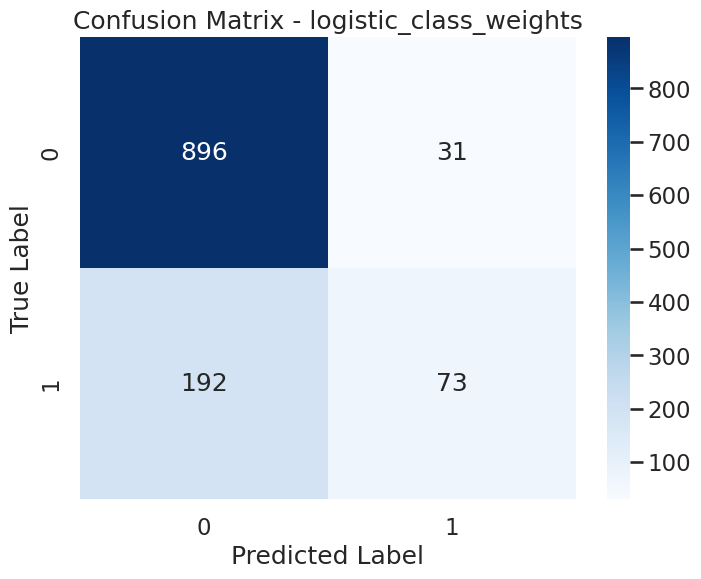

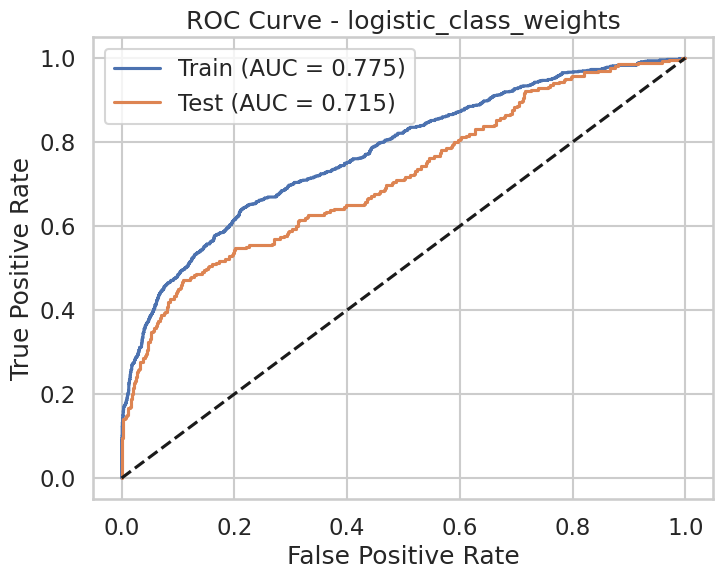


Fitting RIDGE model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.0868511373751352, 'penalty': 'l2'}
Meilleur score F1: 0.5082

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.0868511373751352, 'penalty': 'l2'}
   Score F1 moyen: 0.5082
2. Paramètres: {'C': 0.12648552168552957, 'penalty': 'l2'}
   Score F1 moyen: 0.5079
3. Paramètres: {'C': 0.18420699693267145, 'penalty': 'l2'}
   Score F1 moyen: 0.5066
4. Paramètres: {'C': 0.05963623316594643, 'penalty': 'l2'}
   Score F1 moyen: 0.5053
5. Paramètres: {'C': 0.2682695795279724, 'penalty': 'l2'}
   Score F1 moyen: 0.5052

Results for RIDGE_CLASS_WEIGHTS:

Training Set Metrics:
accuracy: 0.7887
precision: 0.4620
recall: 0.5597
f1: 0.5061
roc_auc: 0.7706

Test Set Metrics:
accuracy: 0.7651
precision: 0.4721
recall: 0.4792
f1: 0.4757
roc_auc: 0.7059

Classification Report - Test Set:
              precision    recall  f1-score   support

           0     0.8505    0.8468    0.8486       927
           1     0.4721    

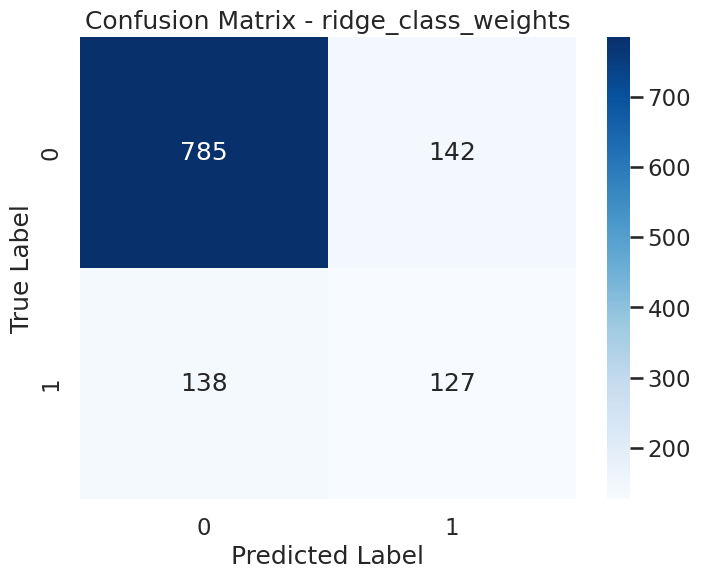

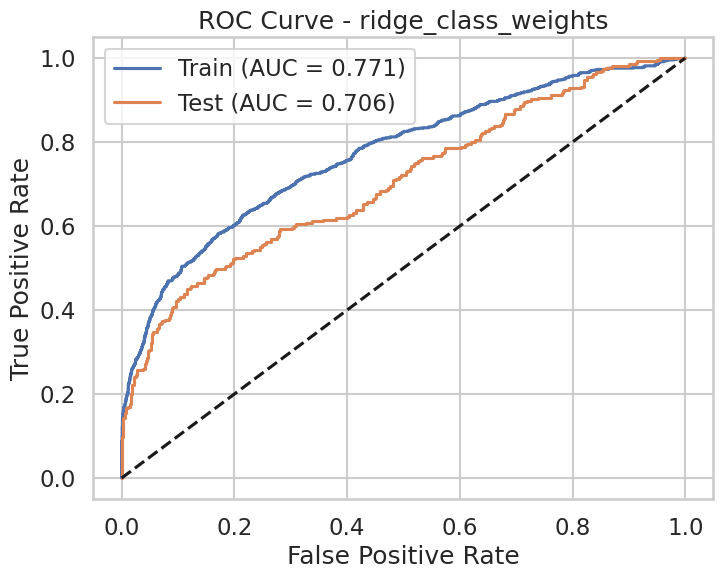


Fitting LASSO model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.024420530945486508, 'penalty': 'l1', 'solver': 'liblinear'}
Meilleur score F1: 0.5040

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.024420530945486508, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5040
2. Paramètres: {'C': 0.042919342601287755, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5014
3. Paramètres: {'C': 0.03906939937054615, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5014
4. Paramètres: {'C': 0.04714866363457392, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5014
5. Paramètres: {'C': 0.029470517025518096, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.5014

Results for LASSO_CLASS_WEIGHTS:

Training Set Metrics:
accuracy: 0.8032
precision: 0.4916
recall: 0.5108
f1: 0.5011
roc_auc: 0.7418

Test Set Metrics:
accuracy: 0.7768
precision: 0.4979
recall: 0.4415
f1: 0.4680
roc_auc: 0.6899

Classification Report - T

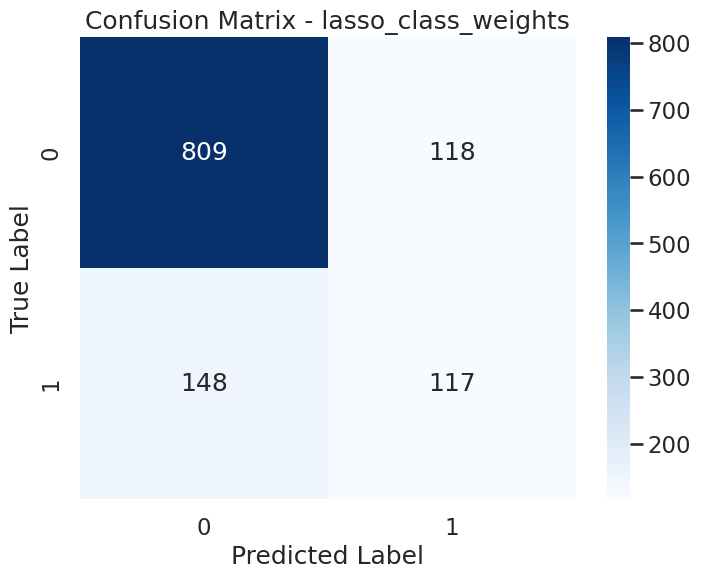

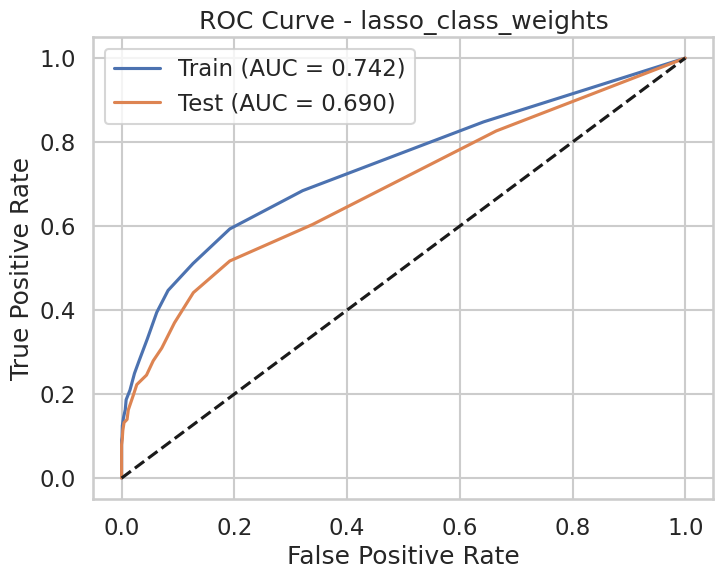


Fitting ELASTICNET model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.04520353656360243, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
Meilleur score F1: 0.5115

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.04520353656360243, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5115
2. Paramètres: {'C': 0.08531678524172805, 'l1_ratio': 0.5, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5101
3. Paramètres: {'C': 0.03856620421163472, 'l1_ratio': 0.6, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5094
4. Paramètres: {'C': 0.03290344562312667, 'l1_ratio': 0.5, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5092
5. Paramètres: {'C': 0.08531678524172805, 'l1_ratio': 0.6, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.5089

Results for ELASTICNET_CLASS_WEIGHTS:

Training Set Metrics:
accuracy: 0.7992
precision: 0.4827
recall: 0.5304
f1: 0.5054
roc_auc: 0.7

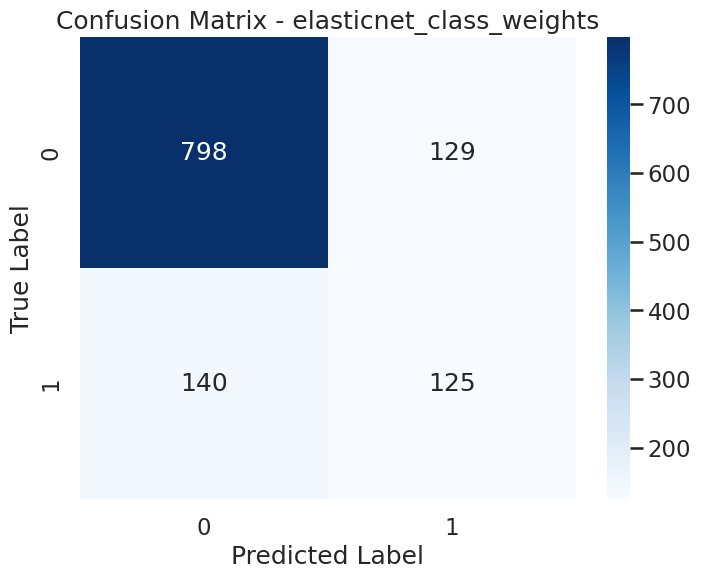

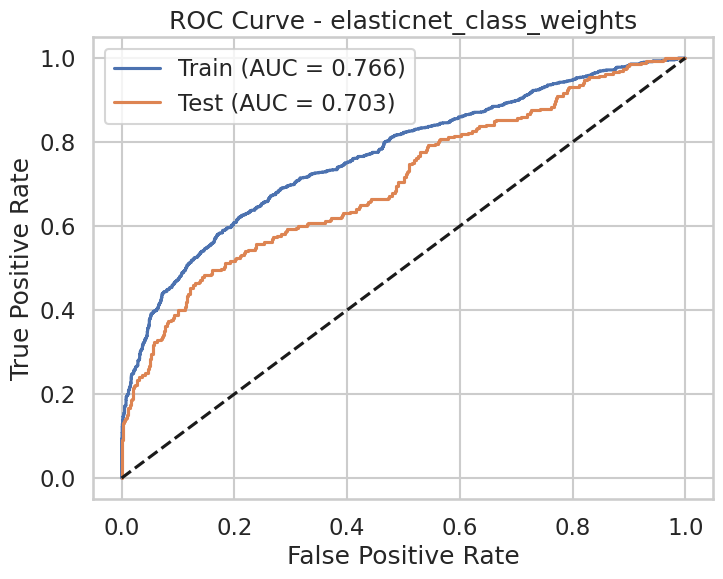


=== MODÈLES AVEC SMOTE (FEATURE ENGINEERING) ===
Optimization terminated successfully.
         Current function value: 0.556607
         Iterations 7

Statsmodels Logistic Regression Summary:
                           Logit Regression Results                           
Dep. Variable:                    BAD   No. Observations:                 7688
Model:                          Logit   Df Residuals:                     7682
Method:                           MLE   Df Model:                            5
Date:                Sun, 27 Oct 2024   Pseudo R-squ.:                  0.1970
Time:                        21:26:14   Log-Likelihood:                -4279.2
converged:                       True   LL-Null:                       -5328.9
Covariance Type:            nonrobust   LLR p-value:                     0.000
                          coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------

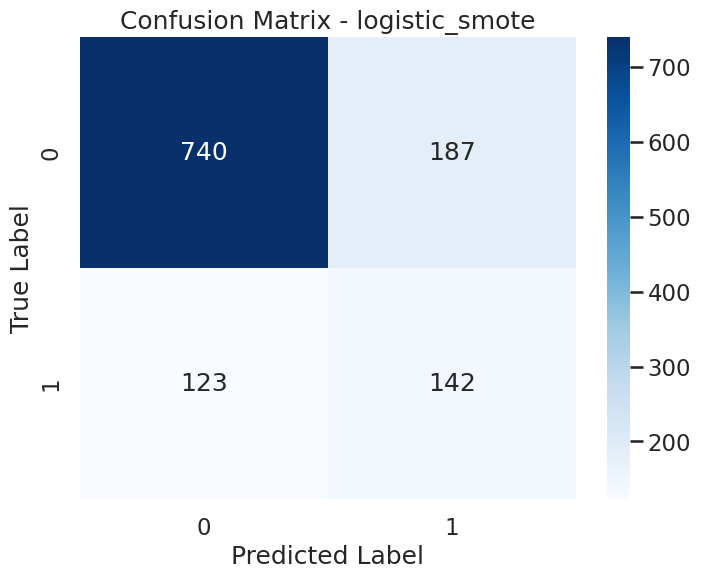

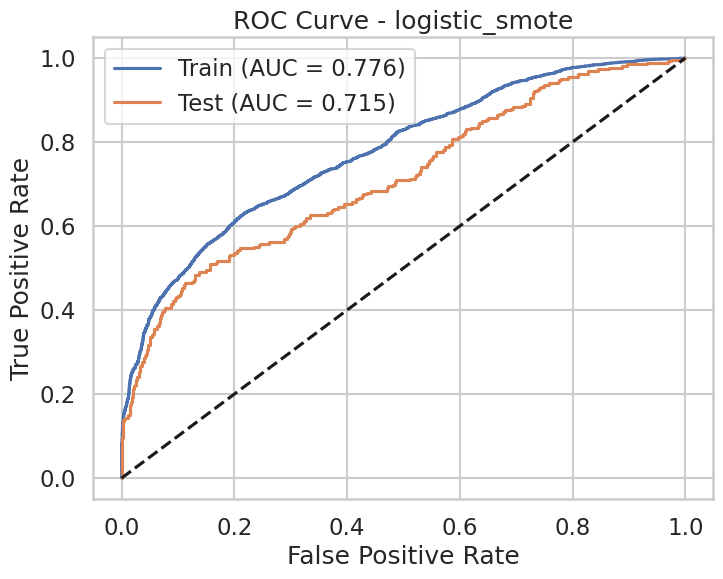


Fitting RIDGE model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 719.6856730011514, 'penalty': 'l2'}
Meilleur score F1: 0.6739

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 6866.488450042998, 'penalty': 'l2'}
   Score F1 moyen: 0.6739
2. Paramètres: {'C': 10000.0, 'penalty': 'l2'}
   Score F1 moyen: 0.6739
3. Paramètres: {'C': 719.6856730011514, 'penalty': 'l2'}
   Score F1 moyen: 0.6739
4. Paramètres: {'C': 4714.8663634573895, 'penalty': 'l2'}
   Score F1 moyen: 0.6739
5. Paramètres: {'C': 3237.45754281764, 'penalty': 'l2'}
   Score F1 moyen: 0.6737

Results for RIDGE_SMOTE:

Training Set Metrics:
accuracy: 0.7040
precision: 0.7510
recall: 0.6103
f1: 0.6734
roc_auc: 0.7757

Test Set Metrics:
accuracy: 0.7357
precision: 0.4247
recall: 0.5321
f1: 0.4724
roc_auc: 0.7160

Classification Report - Test Set:
              precision    recall  f1-score   support

           0     0.8558    0.7940    0.8237       927
           1     0.4247    0.5321    0.4724       265


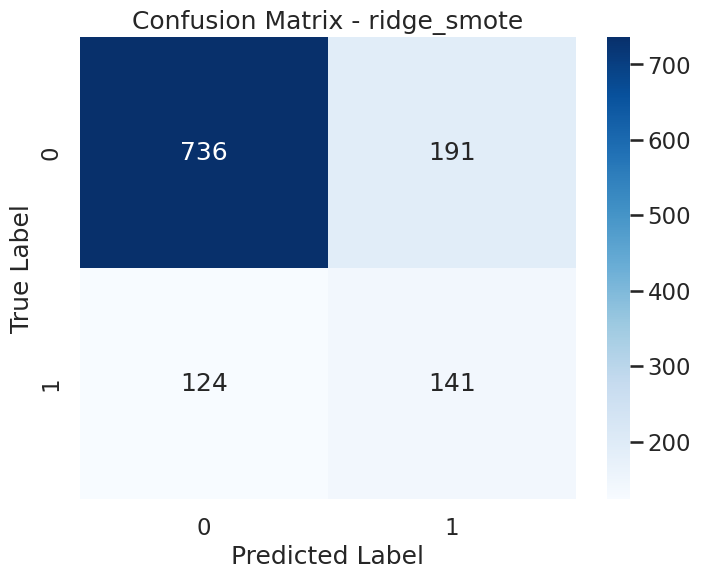

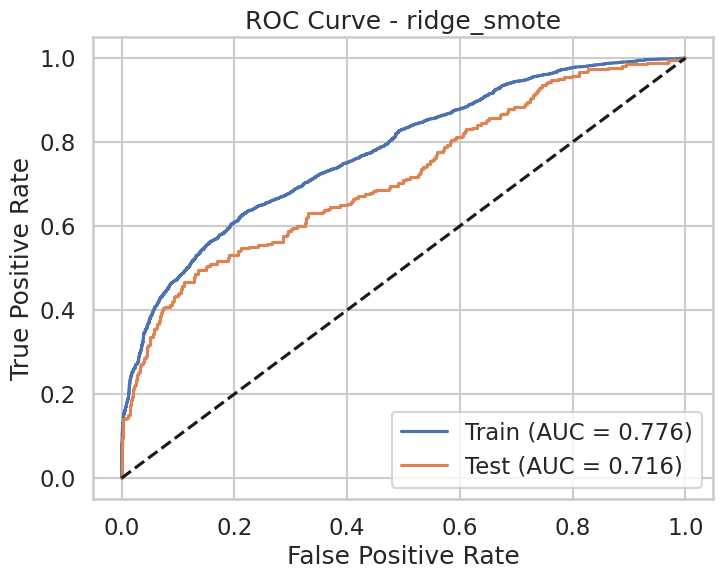


Fitting LASSO model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.0071968567300115215, 'penalty': 'l1', 'solver': 'liblinear'}
Meilleur score F1: 0.7038

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.0071968567300115215, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7038
2. Paramètres: {'C': 0.0079060432109077, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.7038
3. Paramètres: {'C': 0.00868511373751352, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.6976
4. Paramètres: {'C': 0.009540954763499943, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.6689
5. Paramètres: {'C': 0.010481131341546858, 'penalty': 'l1', 'solver': 'liblinear'}
   Score F1 moyen: 0.6651

Results for LASSO_SMOTE:

Training Set Metrics:
accuracy: 0.6809
precision: 0.6801
recall: 0.6831
f1: 0.6816
roc_auc: 0.7497

Test Set Metrics:
accuracy: 0.6485
precision: 0.3376
recall: 0.6038
f1: 0.4330
roc_auc: 0.6899

Classification Report - Test Set

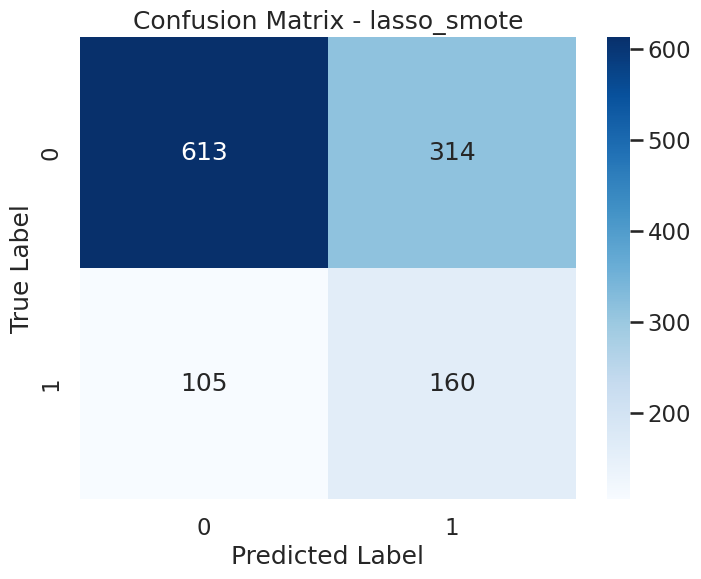

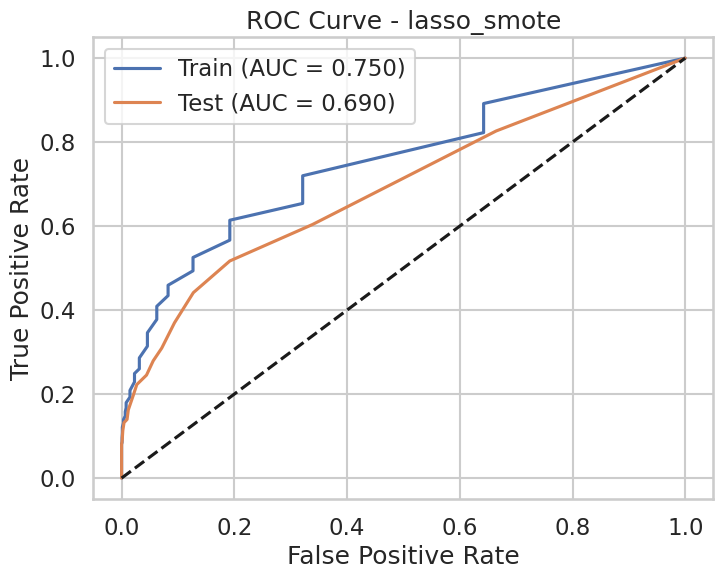


Fitting ELASTICNET model...

Résultats du GridSearch:
Meilleurs paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
Meilleur score F1: 0.6588

Top 5 combinaisons de paramètres:
1. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.6588
2. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.5, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.6577
3. Paramètres: {'C': 0.08531678524172805, 'l1_ratio': 0.7, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.6577
4. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.6, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.6576
5. Paramètres: {'C': 0.09999999999999999, 'l1_ratio': 0.39999999999999997, 'penalty': 'elasticnet', 'solver': 'saga'}
   Score F1 moyen: 0.6569

Results for ELASTICNET_SMOTE:

Training Set Metrics:
accuracy: 0.7032
precision: 0.7754
recall: 0.5721
f1: 0.6584
roc_

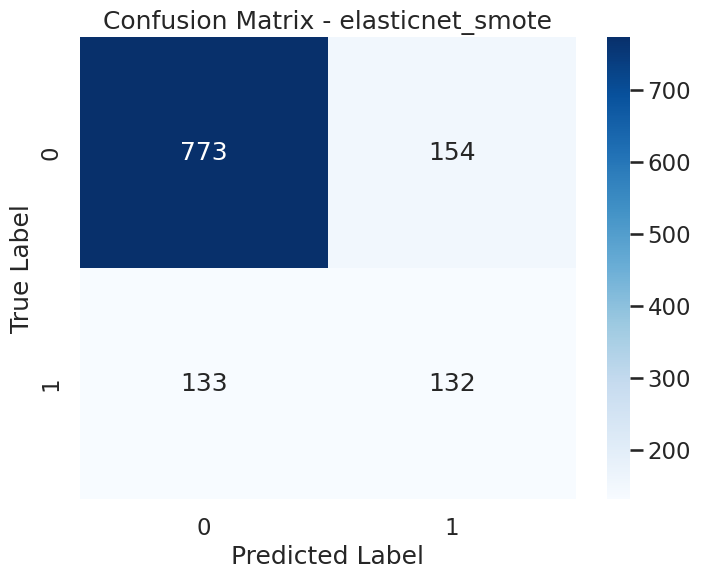

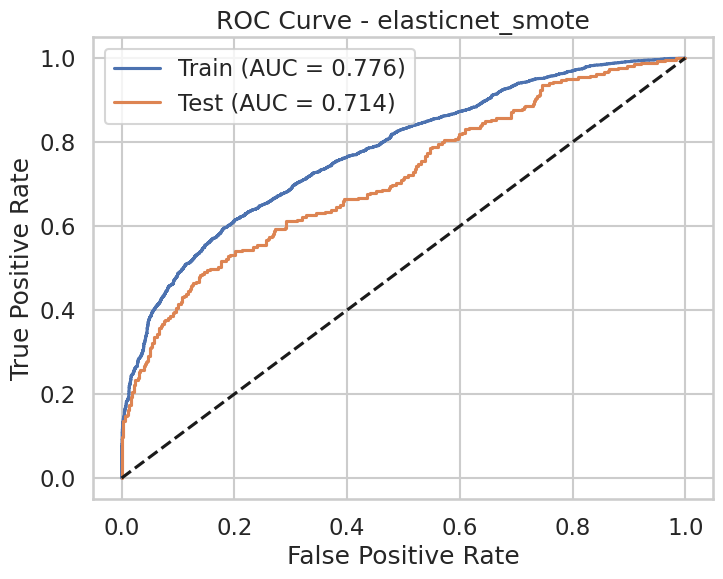

In [75]:
# Execute pipeline
pipeline_combined = run_complete_analysis(X_train_improved, X_test_improved, y_train, y_test, is_feature_engineered=True)


Comparaison des features combinées :


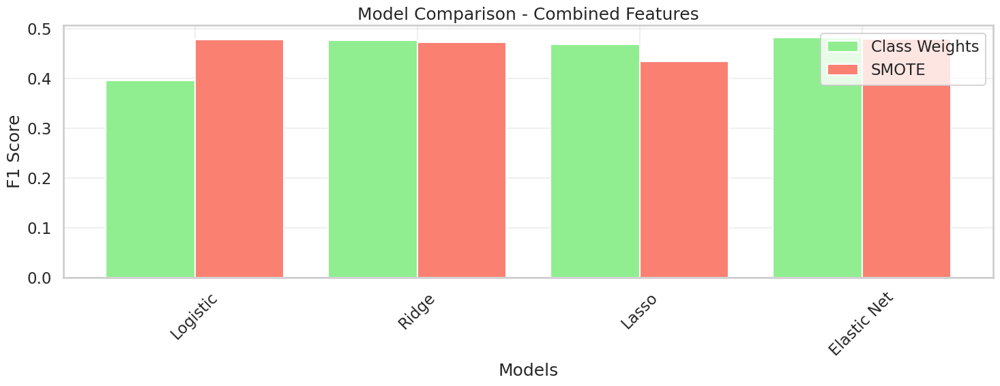


Résultats détaillés pour Combined Features:


In [76]:
comparison.add_results('combined', y_test, pipeline_combined.results, is_feature_engineered=True)

print("\nComparaison des features combinées :")
comparison.plot_individual_comparison('combined')

### Conclusions

- Les modèles avec `class weights` ont montré de bonnes performances en termes de précision, mais une amélioration modeste du rappel.
- Avec SMOTE, les modèles ont montré une augmentation du rappel au détriment de la précision, ce qui est courant lorsque l'on augmente artificiellement la classe minoritaire.
- WEIGHTED_RISK_SCORE a été la variable la plus pertinente, contribuant positivement à la détection de la classe cible.

## Comparaison entre les modèles de regression logistique

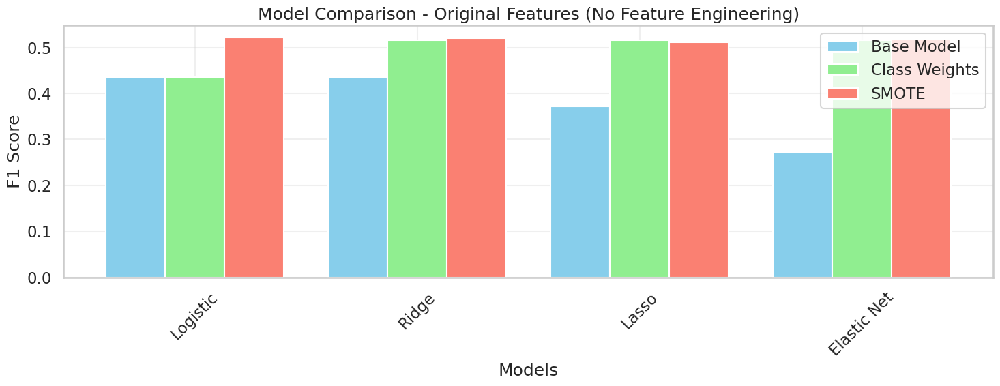


Résultats détaillés pour Original Features (No Feature Engineering):


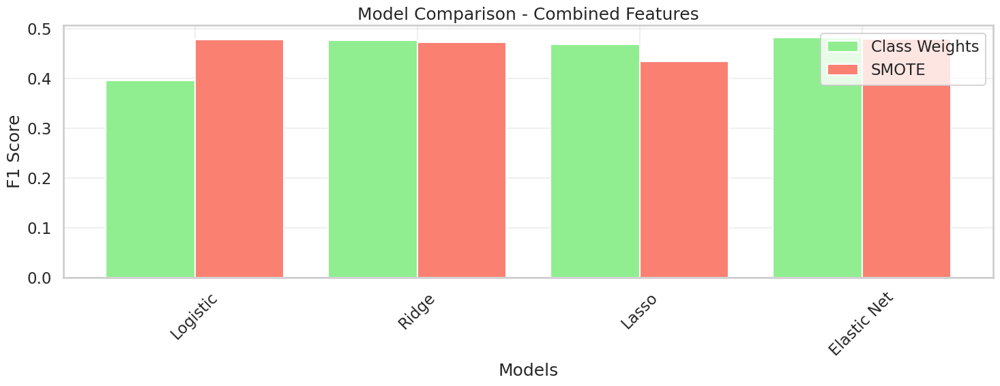


Résultats détaillés pour Combined Features:


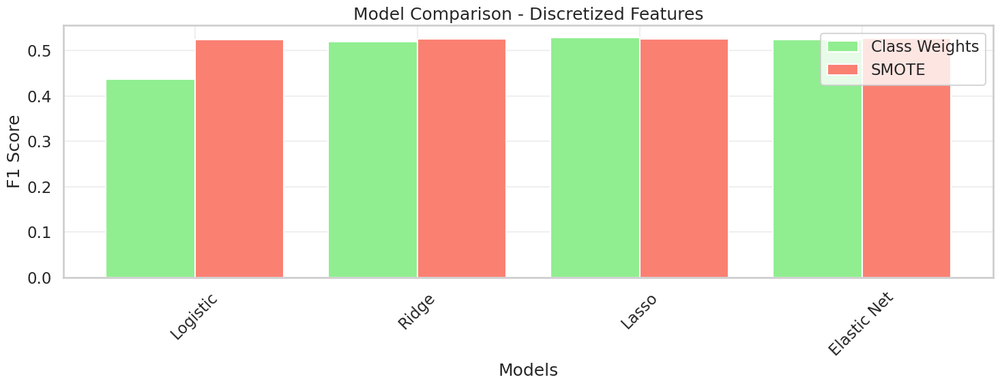


Résultats détaillés pour Discretized Features:



Final Comparison Across All Approaches:


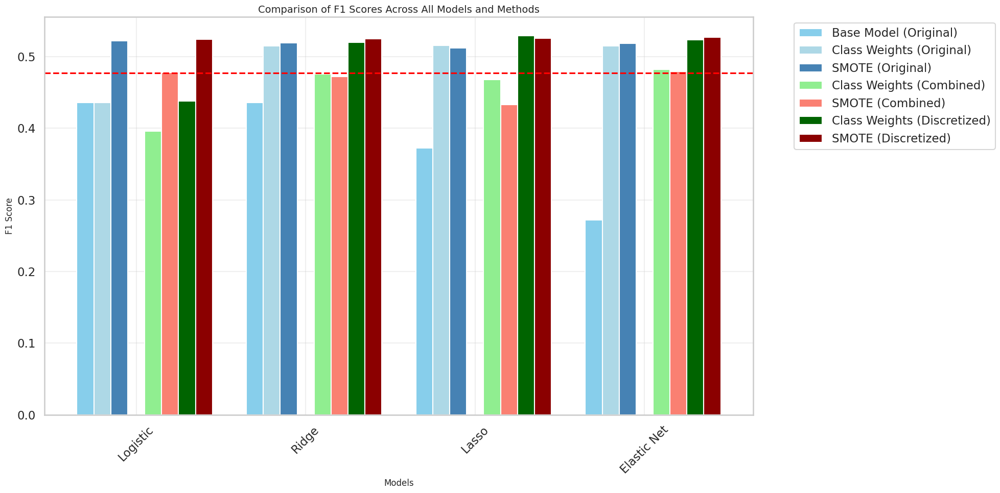


Tableau récapitulatif de tous les résultats:

=== RÉSUMÉ DES MEILLEURS MODÈLES ===

Meilleur modèle global:
Preprocessing: Discretized Features
Model: Lasso
Method: Class Weights
F1 Score: 0.5287
ROC AUC: 0.7862
Precision: 0.4269
Recall: 0.6943

Meilleurs modèles par type de prétraitement:

No Feature Engineering:
Preprocessing: No Feature Engineering
Model: Logistic
Method: SMOTE
F1 Score: 0.5217
ROC AUC: 0.7828
Precision: 0.4433
Recall: 0.6340

Combined Features:
Preprocessing: Combined Features
Model: Elastic Net
Method: Class Weights
F1 Score: 0.4817
ROC AUC: 0.7034
Precision: 0.4921
Recall: 0.4717

Discretized Features:
Preprocessing: Discretized Features
Model: Lasso
Method: Class Weights
F1 Score: 0.5287
ROC AUC: 0.7862
Precision: 0.4269
Recall: 0.6943


In [77]:
# Pour voir toutes les comparaisons
comparison.display_all_comparisons()

En conclusion, les modèles avec class weights semblent bien adaptés à notre jeu de données déséquilibré, et les caractéristiques combinées ont permis d'améliorer la capacité de nos modèles à détecter les cas positifs. Le modèle Lasso avec des caractéristiques discrétisées est actuellement le meilleur candidat pour poursuivre l'optimisation et l'amélioration des performances.

# XGBoost






## Performace du modèle

In [ ]:
# Chercher la combinaison du preprocessing optimal et hyperparamètres par GridSearchCV

# Meilleur score de recall (sur l'ensemble de validation) : 0.6504935370152761
# Meilleurs paramètres : {'model__learning_rate': 0.1,
#                         'model__max_depth': 7,
#                         'model__n_estimators': 200,
#                         'preprocessor__categorical__imputer': SimpleImputer(strategy='most_frequent'),
#                         'preprocessor__continuous__imputer': IterativeImputer(estimator=BayesianRidge()),
#                         'preprocessor__continuous__scaler': StandardScaler(),
#                         'preprocessor__ordinal__imputer': KNNImputer()}
# Recall d'entraînement : 0.6504329004329005
# Précision d'entraînement : 0.8890532544378699
# Recall sur le test : 0.7056603773584905
# Précision sur le test : 0.9166666666666666
# Temps d'exécution : 1989.9608845710754 secondes

# Commencer à compter le temps
start_time = time.time()

# Sélectionner les variables numériques continues et les variables catégorielles (exclusion de la variable MORTDUE et de la variable cible BAD)
X = df.drop(columns=['BAD', 'MORTDUE'])
y = df['BAD']  # Variable cible

# Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Diviser les données en un ensemble d'entraînement et un ensemble de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer des méthodes d'imputation et d'encodage pour chaque groupe de variables
preprocessor = ColumnTransformer(
    transformers=[
        ('continuous', Pipeline(steps=[
            ('imputer', KNNImputer(n_neighbors=5)),
            ('scaler', StandardScaler())
        ]), continuous_vars),

        ('categorical', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
        ]), categorical_vars),

        ('ordinal', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='median'))
        ]), ordinal_vars)
    ]
)

# Créer une grille de recherche avec les valeurs de LogisticRegression
param_grid = {
    'preprocessor__continuous__imputer': [
        IterativeImputer(estimator=BayesianRidge()),
        IterativeImputer(estimator=RandomForestRegressor(n_estimators=10, random_state=42)),
        KNNImputer(n_neighbors=5)  # Sử dụng KNNImputer
    ],
    'preprocessor__continuous__scaler': [StandardScaler(), MinMaxScaler(), RobustScaler()],
    'preprocessor__categorical__imputer': [SimpleImputer(strategy='most_frequent')],
    'preprocessor__ordinal__imputer': [
        SimpleImputer(strategy='most_frequent'),
        SimpleImputer(strategy='median'),
        KNNImputer(n_neighbors=5)
    ],
    'model__max_depth': [3, 5, 7],
    'model__n_estimators': [100, 200],
    'model__learning_rate': [0.01, 0.1]
}

# Créer un pipeline avec LogisticRegression et régularisation ElasticNet
memory = Memory(location='cache_folder', verbose=0)  # Dossier de cache
pipeline = Pipeline([
    ('preprocessor', preprocessor),  # Appliquer l'imputation, la normalisation et l'encodage
    ('model', XGBClassifier(random_state=42))
], memory=memory)

# Créer une validation croisée K-fold
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Utiliser GridSearchCV avec scoring basé sur recall
grid_search = GridSearchCV(pipeline, param_grid, cv=kf, scoring='recall', n_jobs=-1, return_train_score=True, error_score='raise')

# Effectuer la Grid Search et entraîner le modèle uniquement sur l'ensemble d'entraînement
grid_search.fit(X_train, y_train)

# Meilleurs résultats après GridSearchCV
if hasattr(grid_search, 'best_params_'):
    print(f"Meilleur score de recall (sur l'ensemble de validation) : {grid_search.best_score_}")
    print(f"Meilleurs paramètres : {grid_search.best_params_}")
else:
    print("Aucun meilleur paramètre trouvé. Il est possible que la grille de recherche ait échoué pour toutes les combinaisons de paramètres.")

# Évaluation sur l'ensemble d'entraînement via cross_val_predict
y_pred_train = cross_val_predict(grid_search.best_estimator_, X_train, y_train, cv=kf)
train_recall = recall_score(y_train, y_pred_train)
train_precision = precision_score(y_train, y_pred_train)
print(f"Recall d'entraînement : {train_recall}")
print(f"Précision d'entraînement : {train_precision}")

# Vérifier la précision et le recall sur l'ensemble de test
best_model = grid_search.best_estimator_
y_pred_test = best_model.predict(X_test)
test_recall = recall_score(y_test, y_pred_test)
test_precision = precision_score(y_test, y_pred_test)
print(f"Recall sur le test : {test_recall}")
print(f"Précision sur le test : {test_precision}")

# Terminer et calculer le temps d'exécution
end_time = time.time()
print(f"Temps d'exécution : {end_time - start_time} secondes")

Meilleur score de recall (sur l'ensemble de validation) : 0.6504935370152761
Meilleurs paramètres : {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 200, 'preprocessor__categorical__imputer': SimpleImputer(strategy='most_frequent'), 'preprocessor__continuous__imputer': IterativeImputer(estimator=BayesianRidge()), 'preprocessor__continuous__scaler': StandardScaler(), 'preprocessor__ordinal__imputer': KNNImputer()}
Recall d'entraînement : 0.6504329004329005
Précision d'entraînement : 0.8890532544378699
Recall sur le test : 0.7056603773584905
Précision sur le test : 0.9166666666666666
Temps d'exécution : 1989.9608845710754 secondes


Rapport de classification :
              precision    recall  f1-score   support

           0       0.92      0.98      0.95       927
           1       0.92      0.71      0.80       265

    accuracy                           0.92      1192
   macro avg       0.92      0.84      0.87      1192
weighted avg       0.92      0.92      0.92      1192

Matrice de confusion :
[[910  17]
 [ 78 187]]


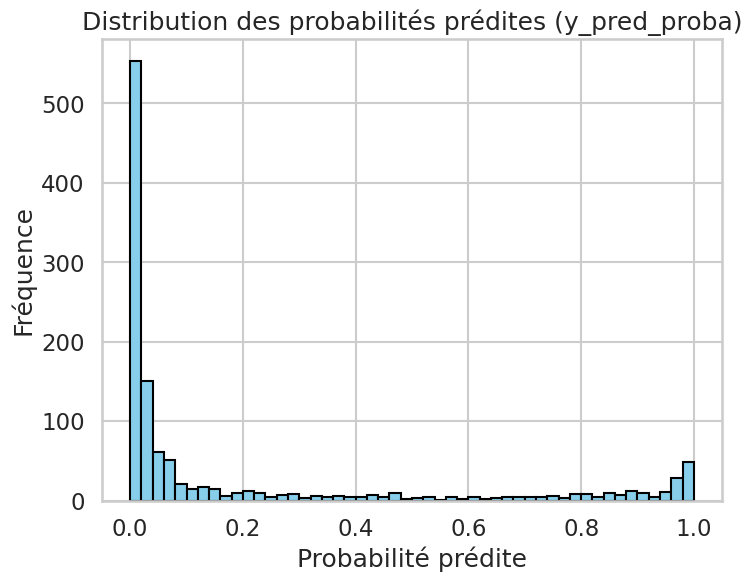

Seuil optimal (ROC AUC) : 0.13262459635734558
ROC AUC : 0.9569192566811179
Matrice de confusion au seuil optimal :
[[843  84]
 [ 22 243]]

Rapport de classification au seuil optimal :
              precision    recall  f1-score   support

           0       0.97      0.91      0.94       927
           1       0.74      0.92      0.82       265

    accuracy                           0.91      1192
   macro avg       0.86      0.91      0.88      1192
weighted avg       0.92      0.91      0.91      1192



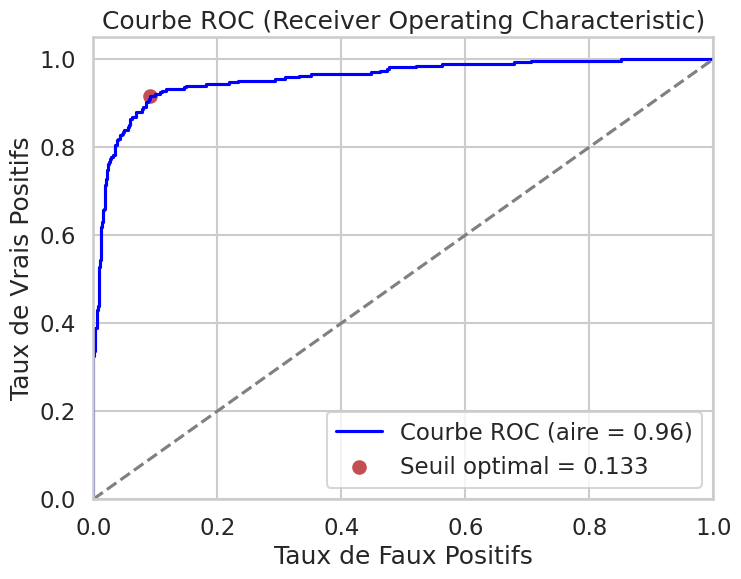

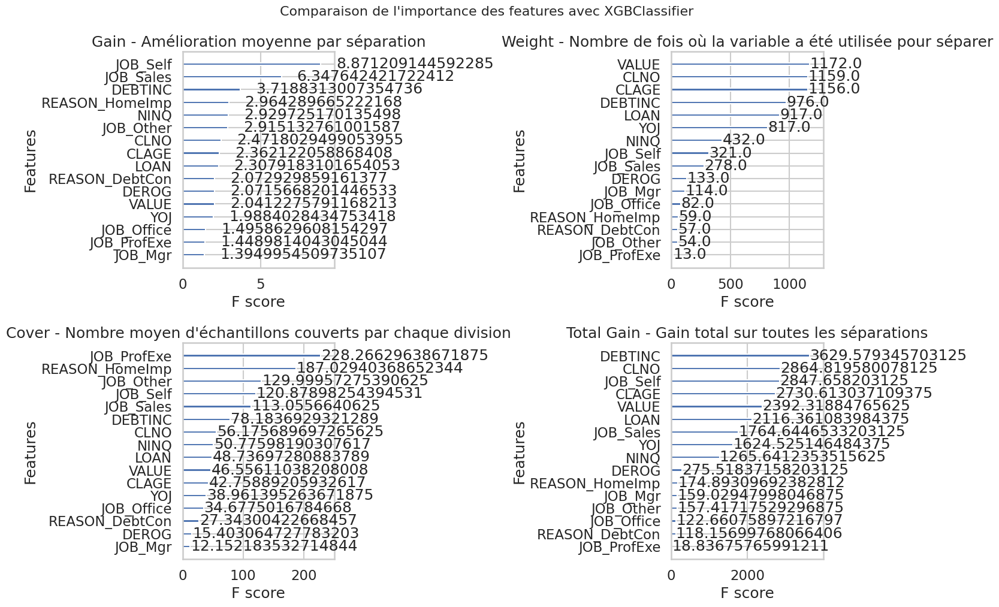

In [79]:
# Modèle XGBoost version sans SMOTE
# Étape 1 : Séparer la variable cible et les variables explicatives
X = df.drop(columns=['BAD', 'MORTDUE'])  # Exclure la variable cible et la variable MORTDUE des données
y = df['BAD']  # Variable cible

# Étape 2 : Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Étape 3 : Créer des méthodes d'imputation et de normalisation pour chaque groupe de variables
preprocessor = ColumnTransformer(
    transformers=[
        # Appliquer IterativeImputer avec BayesianRidge et StandardScaler pour les variables continues
        ('continuous', Pipeline([
            ('imputer', IterativeImputer(estimator=BayesianRidge())),  # Utiliser BayesianRidge pour imputer
            ('scaler', StandardScaler())  # Utiliser StandardScaler pour normaliser
        ]), continuous_vars),  # Appliqué aux variables continues

        # Appliquer SimpleImputer avec stratégie 'most_frequent' et OneHotEncoder pour les variables catégorielles
        ('categorical', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputation most frequent
            ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Encodage one-hot
        ]), categorical_vars),  # Appliqué aux variables catégorielles

        # Appliquer KNNImputer pour les variables ordinales (pas de scaling)
        ('ordinal', Pipeline([
            ('imputer', KNNImputer(n_neighbors=5))  # Utiliser KNNImputer pour les variables ordinales
        ]), ordinal_vars)  # Appliqué aux variables ordinales
    ]
)

# Étape 4 : Diviser les données en ensemble d'entraînement et de test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Étape 5 : Appliquer le prétraitement aux ensembles d'entraînement et de test
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Étape 6 : Entraîner le modèle XGBoost avec les données traitées
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    learning_rate=0.1,  # Valeur obtenue par GridSearchCV
    max_depth=7,        # Valeur obtenue par GridSearchCV
    n_estimators=200    # Valeur obtenue par GridSearchCV
)

# Entraîner le modèle avec les données traitées
xgb_model.fit(X_train_processed, y_train)

# Étape 7 : Prédire sur l'ensemble de test
y_pred = xgb_model.predict(X_test_processed)

# Afficher le rapport de classification avec des indicateurs tels que la précision, le rappel, le F1-score
print("Rapport de classification :")
print(classification_report(y_test, y_pred))

# Afficher la matrice de confusion pour voir le nombre de True Positives, False Positives, False Negatives, True Negatives
print("Matrice de confusion :")
print(confusion_matrix(y_test, y_pred))

# La valeur du seuil (threshold) à laquelle la différence TPR - FPR est la plus grande (c'est-à-dire la distance maximale par rapport au point parfait (0,1)) sera choisie comme seuil optimal.
# Le code np.argmax(tpr - fpr) trouve la position où cette différence est la plus grande.

# Étape 8 : Prédire les probabilités sur l'ensemble de test encodé
y_pred_proba = xgb_model.predict_proba(X_test_processed)[:, 1]

# Étape 8.1 : Tracer un histogramme pour visualiser la distribution des probabilités prédites
plt.figure(figsize=(8, 6))
plt.hist(y_pred_proba, bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution des probabilités prédites (y_pred_proba)')
plt.xlabel('Probabilité prédite')
plt.ylabel('Fréquence')
plt.show()

# Étape 9 : Calculer le ROC AUC et trouver le seuil optimal
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Trouver le seuil optimal en optimisant la distance entre (TPR, FPR) et le point parfait (0,1)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

print(f'Seuil optimal (ROC AUC) : {optimal_threshold}')
print(f'ROC AUC : {roc_auc}')

# Étape 10 : Prédire les classes binaires avec le seuil optimal
y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)

# Étape 11 : Calculer la matrice de confusion
cm = confusion_matrix(y_test, y_pred_optimal)
print("Matrice de confusion au seuil optimal :")
print(cm)

# Ou imprimer le rapport de classification complet
print("\nRapport de classification au seuil optimal :")
print(classification_report(y_test, y_pred_optimal))

# Étape 13 : Tracer la courbe ROC AUC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'Courbe ROC (aire = {roc_auc:.2f})')
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], marker='o', color='r', label=f'Seuil optimal = {optimal_threshold:.3f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Ligne à 45 degrés
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de Faux Positifs')
plt.ylabel('Taux de Vrais Positifs')
plt.title('Courbe ROC (Receiver Operating Characteristic)')
plt.legend(loc='best')
plt.show()

# Étape 14 : Afficher l'importance des caractéristiques avec les noms des variables
plt.figure(figsize=(16, 10))

#######################################################
# On veut lire le résultat par les noms des variables
# Étape 1 : Extraire les noms des variables après le prétraitement
# Noms des variables continues et ordinales (sans modification après prétraitement)
continuous_names = continuous_vars  # Noms des variables continues d'origine
ordinal_names = ordinal_vars  # Noms des variables ordinales d'origine

# Noms des variables catégoriques après OneHotEncoder
# Voici comment obtenir les noms des variables catégoriques après encodage
onehot_categorical_names = preprocessor.named_transformers_['categorical'].named_steps['encoder'].get_feature_names_out(categorical_vars)

# Étape 2 : Combiner tous les noms de variables en un seul tableau
# On combine les variables continues, ordinales et catégoriques encodées
feature_names = np.hstack([continuous_names, ordinal_names, onehot_categorical_names])
#######################################################

# Critère 1 : Gain (amélioration moyenne par séparation)
plt.subplot(2, 2, 1)
ax1 = plot_importance(xgb_model, importance_type='gain', title='Importance par Gain', ax=plt.gca())
plt.title("Gain - Amélioration moyenne par séparation")
# Sửa lại cách lấy text từ các nhãn
ax1.set_yticklabels([feature_names[int(f.get_text()[1:])] for f in ax1.get_yticklabels()])

# Critère 2 : Weight (nombre de fois où la variable a été utilisée pour séparer)
plt.subplot(2, 2, 2)
ax2 = plot_importance(xgb_model, importance_type='weight', title='Importance par Weight', ax=plt.gca())
plt.title("Weight - Nombre de fois où la variable a été utilisée pour séparer")
ax2.set_yticklabels([feature_names[int(f.get_text()[1:])] for f in ax2.get_yticklabels()])

# Critère 3 : Cover (nombre moyen d'échantillons couverts par chaque division)
plt.subplot(2, 2, 3)
ax3 = plot_importance(xgb_model, importance_type='cover', title='Importance par Cover', ax=plt.gca())
plt.title("Cover - Nombre moyen d'échantillons couverts par chaque division")
ax3.set_yticklabels([feature_names[int(f.get_text()[1:])] for f in ax3.get_yticklabels()])

# Critère 4 : Total Gain (gain total sur toutes les séparations)
plt.subplot(2, 2, 4)
ax4 = plot_importance(xgb_model, importance_type='total_gain', title='Importance par Total Gain', ax=plt.gca())
plt.title("Total Gain - Gain total sur toutes les séparations")
ax4.set_yticklabels([feature_names[int(f.get_text()[1:])] for f in ax4.get_yticklabels()])

plt.tight_layout()
plt.suptitle("Comparaison de l'importance des features avec XGBClassifier", fontsize=16, y=1.02)
plt.show()

* Gain (Amélioration moyenne par séparation) :

Signification : Le gain mesure l'amélioration moyenne du modèle (réduction de l'erreur) lorsque chaque variable est utilisée pour diviser les données. Cela nous donne une idée de la contribution de chaque variable à l'amélioration du modèle.

Analyse :
La variable JOB_Self a la valeur de gain la plus élevée (8,87), ce qui signifie qu'elle apporte la plus grande amélioration de l'erreur dans le modèle. Cela indique que JOB_Self est très importante lorsqu'elle est utilisée pour les séparations.

D'autres variables comme JOB_Sales (6,35), DEBTINC (3,71), et REASON_HomeImp (2,96) ont aussi un gain élevé, ce qui montre leur impact significatif sur les performances du modèle, mais elles sont moins influentes comparées à JOB_Self.

* Weight (Nombre de fois où la variable a été utilisée pour séparer) :

Signification : Le weight représente le nombre de fois qu'une variable a été utilisée pour effectuer une séparation dans les arbres de décision. Cela nous donne une idée de la fréquence d'utilisation de chaque variable.

Analyse :
VALUE a été utilisée le plus souvent (1172 fois), ce qui montre qu'elle est souvent choisie lors de la construction des arbres de décision.

D'autres variables comme CLNO (1159 fois) et CLAGE (1156 fois) sont également très fréquemment utilisées, ce qui indique qu'elles jouent un rôle important dans la structure de l'arbre.

Bien que JOB_Self ait un gain très élevé, elle n'a été utilisée que 321 fois, montrant que même si son impact est fort, elle est moins souvent sélectionnée que d'autres variables comme VALUE ou CLNO.

* Cover (Nombre moyen d'échantillons couverts par chaque division) :

Signification : Le cover mesure le nombre moyen d'échantillons affectés par une séparation effectuée par une variable. Cela aide à évaluer l'ampleur de l'impact d'une variable en termes de taille de données couvertes.

Analyse :
JOB_ProfExe a le cover le plus élevé (228), ce qui signifie qu'elle affecte un grand nombre d'échantillons à chaque division.
REASON_HomeImp (187) et JOB_Other (130) ont aussi un cover relativement élevé, montrant qu'elles influencent une grande partie des données lors des séparations.

DEBTINC (78) et CLNO (56) ont également des valeurs de cover notables, bien que plus faibles.

* Total Gain (Gain total sur toutes les séparations) :

Signification : Le total gain représente la somme des gains de chaque variable à travers toutes les décisions prises dans le modèle. Cela mesure la contribution globale d'une variable à l'amélioration du modèle.

Analyse :

DEBTINC a le gain total le plus élevé (3629), montrant qu'elle contribue de manière significative à l'amélioration globale du modèle à travers toutes les séparations.

CLNO (2864) et JOB_Self (2847) sont aussi des variables avec un gain total élevé, ce qui confirme leur importance dans le modèle.
CLAGE et VALUE apportent également une contribution non négligeable avec des gains totaux respectifs de 2730 et 2392.

* Conclusion :

  * JOB_Self se distingue par son gain élevé, ce qui signifie qu'elle apporte une amélioration significative à chaque fois qu'elle est utilisée. Cependant, elle n'est pas utilisée aussi fréquemment que VALUE ou CLNO. Cela montre que JOB_Self est très importante lorsqu'elle est sélectionnée, mais elle est moins souvent choisie.

  * VALUE et CLNO sont les variables les plus fréquemment utilisées dans les arbres de décision (Weight), mais elles n'apportent pas nécessairement les plus grandes améliorations en termes de gain.

  * JOB_ProfExe couvre le plus grand nombre d'échantillons (Cover), mais son impact sur l'amélioration du modèle est relativement faible.

  * En termes de gain total, DEBTINC, CLNO, et JOB_Self sont les trois variables qui ont le plus contribué à la performance globale du modèle.

## Optimisation du modèle XGBoost

**Idée 1** : On souhaite voir comment le SMOTE optimise la métrique 'recall'.

Rapport de classification (avec SMOTE) :
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       927
           1       0.89      0.78      0.83       265

    accuracy                           0.93      1192
   macro avg       0.92      0.88      0.89      1192
weighted avg       0.93      0.93      0.93      1192

Matrice de confusion (avec SMOTE) :
[[902  25]
 [ 59 206]]


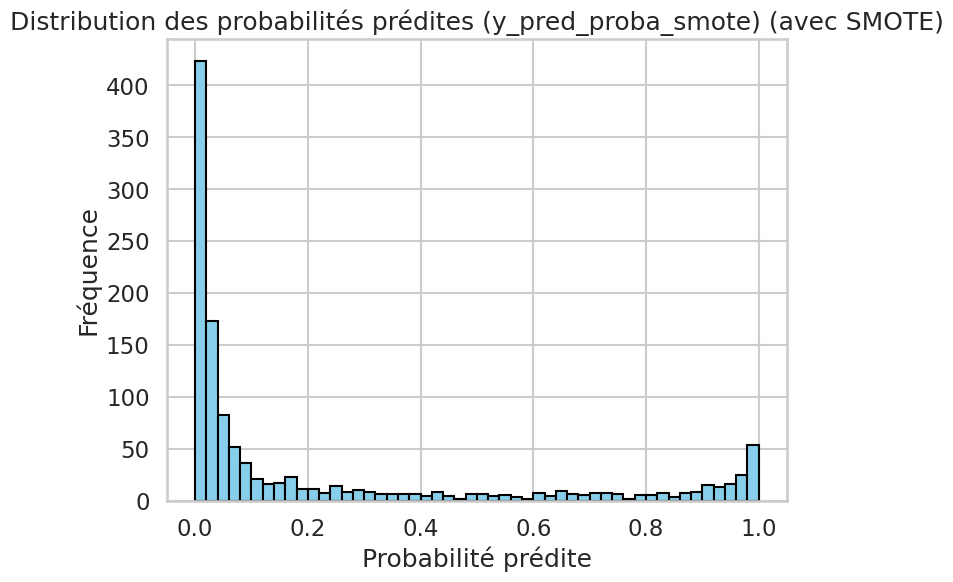

Seuil optimal (ROC AUC) avec SMOTE : 0.22485044598579407
ROC AUC (avec SMOTE) : 0.9581079155726526
Matrice de confusion au seuil optimal (avec SMOTE) :
[[845  82]
 [ 23 242]]

Rapport de classification au seuil optimal :
              precision    recall  f1-score   support

           0       0.97      0.91      0.94       927
           1       0.74      0.92      0.82       265

    accuracy                           0.91      1192
   macro avg       0.86      0.91      0.88      1192
weighted avg       0.92      0.91      0.91      1192



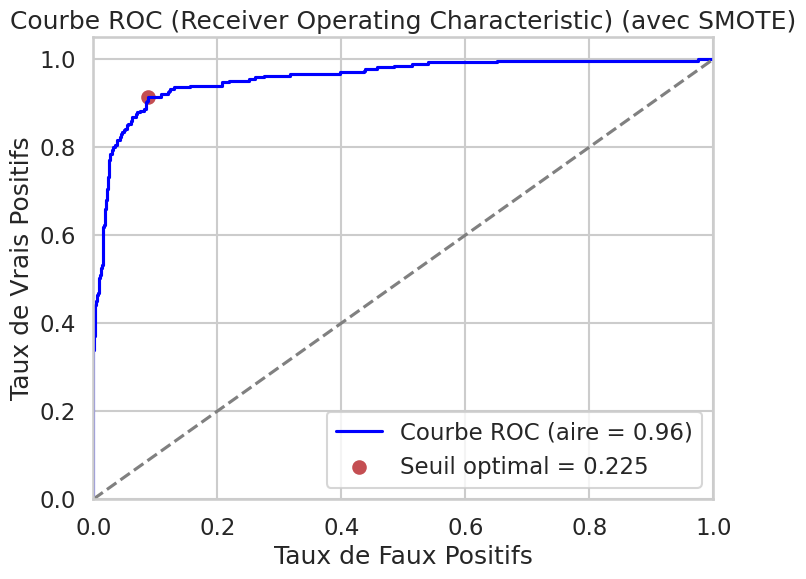

In [80]:
# Modèle XGBoost version avec SMOTE : On veut voir l'effet de SMOTE sur la classe minoritaire
# Étape 1 : Séparer la variable cible et les variables explicatives
X = df.drop(columns=['BAD', 'MORTDUE'])  # Exclure la variable cible et la variable MORTDUE des données
y = df['BAD']  # Variable cible

# Étape 2 : Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Étape 3 : Créer des méthodes d'imputation et de normalisation pour chaque groupe de variables
preprocessor = ColumnTransformer(
    transformers=[
        # Appliquer IterativeImputer avec BayesianRidge et StandardScaler pour les variables continues
        ('continuous', Pipeline([
            ('imputer', IterativeImputer(estimator=BayesianRidge())),  # Utiliser BayesianRidge pour imputer
            ('scaler', StandardScaler())  # Utiliser StandardScaler pour normaliser
        ]), continuous_vars),  # Appliqué aux variables continues

        # Appliquer SimpleImputer avec stratégie 'most_frequent' et OneHotEncoder pour les variables catégorielles
        ('categorical', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputation most frequent
            ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Encodage one-hot
        ]), categorical_vars),  # Appliqué aux variables catégorielles

        # Appliquer KNNImputer pour les variables ordinales (pas de scaling)
        ('ordinal', Pipeline([
            ('imputer', KNNImputer(n_neighbors=5))  # Utiliser KNNImputer pour les variables ordinales
        ]), ordinal_vars)  # Appliqué aux variables ordinales
    ]
)

# Étape 4 : Diviser les données en ensemble d'entraînement et de test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Étape 5 : Appliquer le prétraitement aux ensembles d'entraînement et de test
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Étape 6 : Appliquer SMOTE pour traiter le déséquilibre des classes après le prétraitement
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_processed, y_train)

# Étape 7 : Entraîner le modèle XGBoost avec les données traitées par SMOTE
xgb_model_smote = xgb.XGBClassifier(
    objective='binary:logistic',
    learning_rate=0.1,  # Valeur obtenue par GridSearchCV
    max_depth=7,        # Valeur obtenue par GridSearchCV
    n_estimators=200    # Valeur obtenue par GridSearchCV
)

# Entraîner le modèle avec les données traitées par SMOTE
xgb_model_smote.fit(X_train_smote, y_train_smote)

# Étape 8 : Prédire sur l'ensemble de test
y_pred_smote = xgb_model_smote.predict(X_test_processed)

# Afficher le rapport de classification avec des indicateurs tels que la précision, le rappel, le F1-score
print("Rapport de classification (avec SMOTE) :")
print(classification_report(y_test, y_pred_smote))

# Afficher la matrice de confusion pour voir le nombre de True Positives, False Positives, False Negatives, True Negatives
print("Matrice de confusion (avec SMOTE) :")
print(confusion_matrix(y_test, y_pred_smote))

# Étape 9 : Prédire les probabilités sur l'ensemble de test encodé
y_pred_proba_smote = xgb_model_smote.predict_proba(X_test_processed)[:, 1]

# Étape 9.1 : Tracer un histogramme pour visualiser la distribution des probabilités prédites
plt.figure(figsize=(8, 6))
plt.hist(y_pred_proba_smote, bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution des probabilités prédites (y_pred_proba_smote) (avec SMOTE)')
plt.xlabel('Probabilité prédite')
plt.ylabel('Fréquence')
plt.show()

# Étape 10 : Calculer le ROC AUC et trouver le seuil optimal
fpr_smote, tpr_smote, thresholds_smote = roc_curve(y_test, y_pred_proba_smote)
roc_auc_smote = auc(fpr_smote, tpr_smote)

# Trouver le seuil optimal en optimisant la distance entre (TPR, FPR) et le point parfait (0,1)
optimal_idx_smote = np.argmax(tpr_smote - fpr_smote)
optimal_threshold_smote = thresholds_smote[optimal_idx_smote]

print(f'Seuil optimal (ROC AUC) avec SMOTE : {optimal_threshold_smote}')
print(f'ROC AUC (avec SMOTE) : {roc_auc_smote}')

# Étape 11 : Prédire les classes binaires avec le seuil optimal
y_pred_optimal_smote = (y_pred_proba_smote >= optimal_threshold_smote).astype(int)

# Étape 12 : Calculer la matrice de confusion avec le seuil optimal
cm_smote = confusion_matrix(y_test, y_pred_optimal_smote)
print("Matrice de confusion au seuil optimal (avec SMOTE) :")
print(cm_smote)

# Ou imprimer le rapport de classification complet
print("\nRapport de classification au seuil optimal :")
print(classification_report(y_test, y_pred_optimal))

# Étape 13 : Tracer la courbe ROC AUC
plt.figure(figsize=(8, 6))
plt.plot(fpr_smote, tpr_smote, color='blue', label=f'Courbe ROC (aire = {roc_auc_smote:.2f})')
plt.scatter(fpr_smote[optimal_idx_smote], tpr_smote[optimal_idx_smote], marker='o', color='r', label=f'Seuil optimal = {optimal_threshold_smote:.3f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Ligne à 45 degrés
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de Faux Positifs')
plt.ylabel('Taux de Vrais Positifs')
plt.title('Courbe ROC (Receiver Operating Characteristic) (avec SMOTE)')
plt.legend(loc='best')
plt.show()

**Idée 2** : On va équilibre le poids entre 2 classes et voir l'effet sur la performace.

Rapport de classification (avec class_weight) :
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       927
           1       0.89      0.80      0.84       265

    accuracy                           0.93      1192
   macro avg       0.92      0.89      0.90      1192
weighted avg       0.93      0.93      0.93      1192

Matrice de confusion (avec class_weight) :
[[900  27]
 [ 53 212]]


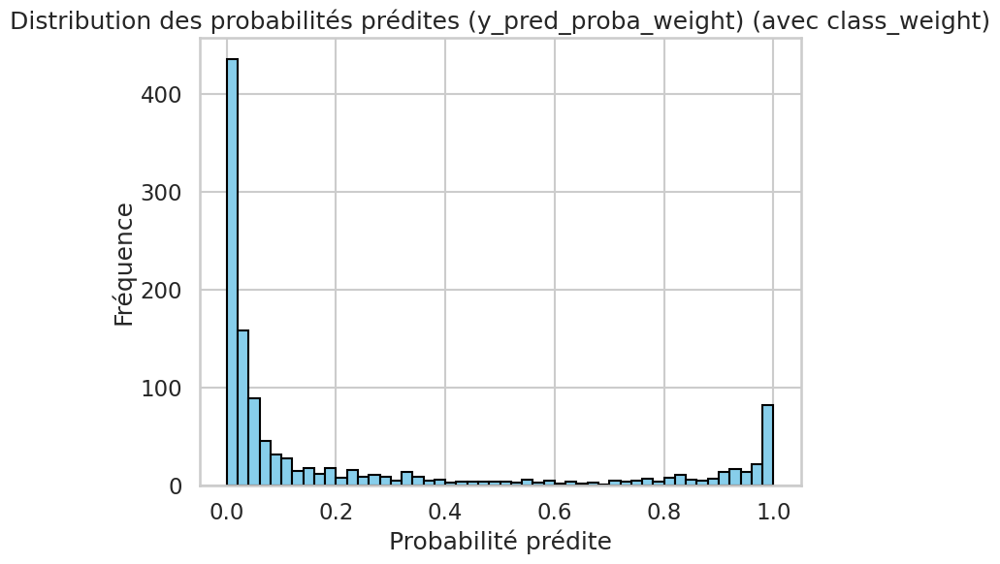

Seuil optimal (ROC AUC) avec class_weight : 0.27254313230514526
ROC AUC (avec class_weight) : 0.9586615375221348
Matrice de confusion au seuil optimal (avec class_weight) :
[[855  72]
 [ 28 237]]

Rapport de classification au seuil optimal :
              precision    recall  f1-score   support

           0       0.97      0.92      0.94       927
           1       0.77      0.89      0.83       265

    accuracy                           0.92      1192
   macro avg       0.87      0.91      0.89      1192
weighted avg       0.92      0.92      0.92      1192



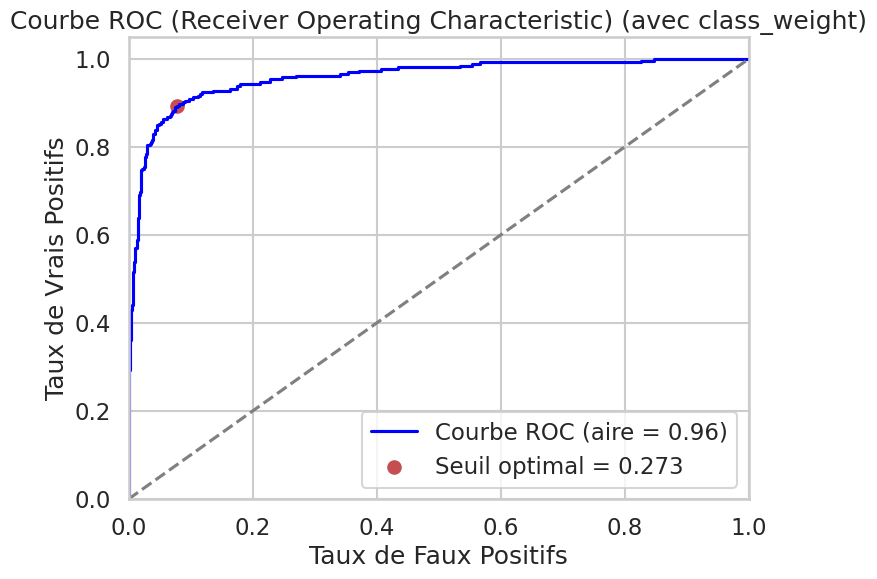

In [81]:
# Modèle XGBoost version avec class_weight : On veut équilibrer les classes avec class-weight
# Étape 1 : Séparer la variable cible et les variables explicatives
X = df.drop(columns=['BAD', 'MORTDUE'])  # Exclure la variable cible et la variable MORTDUE des données
y = df['BAD']  # Variable cible

# Étape 2 : Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Étape 3 : Créer des méthodes d'imputation et de normalisation pour chaque groupe de variables
preprocessor = ColumnTransformer(
    transformers=[
        # Appliquer IterativeImputer avec BayesianRidge et StandardScaler pour les variables continues
        ('continuous', Pipeline([
            ('imputer', IterativeImputer(estimator=BayesianRidge())),  # Utiliser BayesianRidge pour imputer
            ('scaler', StandardScaler())  # Utiliser StandardScaler pour normaliser
        ]), continuous_vars),  # Appliqué aux variables continues

        # Appliquer SimpleImputer avec stratégie 'most_frequent' et OneHotEncoder pour les variables catégorielles
        ('categorical', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputation most frequent
            ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Encodage one-hot
        ]), categorical_vars),  # Appliqué aux variables catégorielles

        # Appliquer KNNImputer pour les variables ordinales (pas de scaling)
        ('ordinal', Pipeline([
            ('imputer', KNNImputer(n_neighbors=5))  # Utiliser KNNImputer pour les variables ordinales
        ]), ordinal_vars)  # Appliqué aux variables ordinales
    ]
)

# Étape 4 : Diviser les données en ensemble d'entraînement et de test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Étape 5 : Appliquer le prétraitement aux ensembles d'entraînement et de test
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Étape 6 : Utiliser le class_weight pour équilibrer les classes sans SMOTE
# Nous utilisons scale_pos_weight pour équilibrer les classes avec un ratio 50/50
# La formule pour scale_pos_weight est : scale_pos_weight = (n_samples - n_pos) / n_pos

# Calculer scale_pos_weight basé sur les données d'entraînement
n_pos = sum(y_train)
n_neg = len(y_train) - n_pos
scale_pos_weight = n_neg / n_pos  # Ici, nous ajustons le ratio des classes pour être équilibré

# Étape 7 : Entraîner le modèle XGBoost avec class_weight
xgb_model_weight = xgb.XGBClassifier(
    objective='binary:logistic',
    learning_rate=0.1,  # Valeur obtenue par GridSearchCV
    max_depth=7,        # Valeur obtenue par GridSearchCV
    n_estimators=200,   # Valeur obtenue par GridSearchCV
    scale_pos_weight=scale_pos_weight  # Utilisation de class weight pour équilibrer les classes
)

# Entraîner le modèle avec les données traitées sans SMOTE mais avec scale_pos_weight
xgb_model_weight.fit(X_train_processed, y_train)

# Étape 8 : Prédire sur l'ensemble de test
y_pred_weight = xgb_model_weight.predict(X_test_processed)

# Afficher le rapport de classification avec des indicateurs tels que la précision, le rappel, le F1-score
print("Rapport de classification (avec class_weight) :")
print(classification_report(y_test, y_pred_weight))

# Afficher la matrice de confusion pour voir le nombre de True Positives, False Positives, False Negatives, True Negatives
print("Matrice de confusion (avec class_weight) :")
print(confusion_matrix(y_test, y_pred_weight))

# Étape 9 : Prédire les probabilités sur l'ensemble de test encodé
y_pred_proba_weight = xgb_model_weight.predict_proba(X_test_processed)[:, 1]

# Étape 9.1 : Tracer un histogramme pour visualiser la distribution des probabilités prédites
plt.figure(figsize=(8, 6))
plt.hist(y_pred_proba_weight, bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution des probabilités prédites (y_pred_proba_weight) (avec class_weight)')
plt.xlabel('Probabilité prédite')
plt.ylabel('Fréquence')
plt.show()

# Étape 10 : Calculer le ROC AUC et trouver le seuil optimal
fpr_weight, tpr_weight, thresholds_weight = roc_curve(y_test, y_pred_proba_weight)
roc_auc_weight = auc(fpr_weight, tpr_weight)

# Trouver le seuil optimal en optimisant la distance entre (TPR, FPR) et le point parfait (0,1)
optimal_idx_weight = np.argmax(tpr_weight - fpr_weight)
optimal_threshold_weight = thresholds_weight[optimal_idx_weight]

print(f'Seuil optimal (ROC AUC) avec class_weight : {optimal_threshold_weight}')
print(f'ROC AUC (avec class_weight) : {roc_auc_weight}')

# Étape 11 : Prédire les classes binaires avec le seuil optimal
y_pred_optimal_weight = (y_pred_proba_weight >= optimal_threshold_weight).astype(int)

# Étape 12 : Calculer la matrice de confusion avec le seuil optimal
cm_weight = confusion_matrix(y_test, y_pred_optimal_weight)
print("Matrice de confusion au seuil optimal (avec class_weight) :")
print(cm_weight)

# Ou imprimer le rapport de classification complet
print("\nRapport de classification au seuil optimal :")
print(classification_report(y_test, y_pred_optimal_weight))

# Étape 13 : Tracer la courbe ROC AUC
plt.figure(figsize=(8, 6))
plt.plot(fpr_weight, tpr_weight, color='blue', label=f'Courbe ROC (aire = {roc_auc_weight:.2f})')
plt.scatter(fpr_weight[optimal_idx_weight], tpr_weight[optimal_idx_weight], marker='o', color='r', label=f'Seuil optimal = {optimal_threshold_weight:.3f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Ligne à 45 degrés
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de Faux Positifs')
plt.ylabel('Taux de Vrais Positifs')
plt.title('Courbe ROC (Receiver Operating Characteristic) (avec class_weight)')
plt.legend(loc='best')
plt.show()

,Accuracy,Precision,Recall,F1-Score,ROC AUC
Avec SMOTE,0.93,0.89,0.78,0.83,0.96
Sans SMOTE,0.92,0.92,0.71,0.80,0.96
Avec Class Weight,0.93,0.89,0.80,0.84,0.96


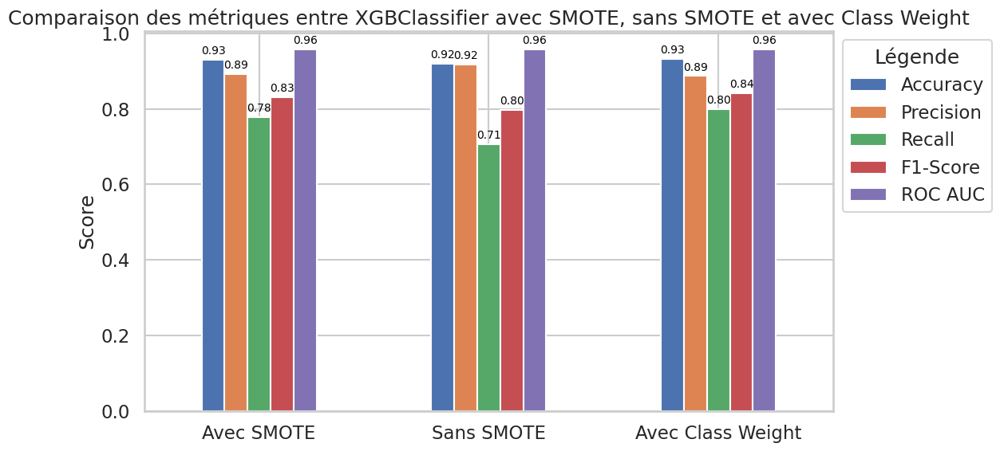

In [82]:
# Comparer les résultats entre la version avec SMOTE, sans SMOTE et avec class_weight
comparison_metrics_xgb = {
    "Accuracy": [accuracy_score(y_test, y_pred_smote), accuracy_score(y_test, y_pred), accuracy_score(y_test, y_pred_weight)],
    "Precision": [precision_score(y_test, y_pred_smote), precision_score(y_test, y_pred), precision_score(y_test, y_pred_weight)],
    "Recall": [recall_score(y_test, y_pred_smote), recall_score(y_test, y_pred), recall_score(y_test, y_pred_weight)],
    "F1-Score": [f1_score(y_test, y_pred_smote), f1_score(y_test, y_pred), f1_score(y_test, y_pred_weight)],
    "ROC AUC": [roc_auc_smote, roc_auc, roc_auc_weight]  # Ajout du score ROC AUC
}

# Créer un DataFrame pour afficher les résultats
df_comparison_metrics_xgb = pd.DataFrame(comparison_metrics_xgb, index=["Avec SMOTE", "Sans SMOTE", "Avec Class Weight"])
display(df_comparison_metrics_xgb)

# Tracer un graphique en barres pour comparer les métriques entre les trois modèles
ax = df_comparison_metrics_xgb.plot(kind="bar", figsize=(12, 6))
plt.title("Comparaison des métriques entre XGBClassifier avec SMOTE, sans SMOTE et avec Class Weight")
plt.ylabel("Score")
plt.xticks(rotation=0)  # Rotation des étiquettes de l'axe des X

# Ajouter des annotations sur chaque barre
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

# Ajuster la légende et la mise en page
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title="Légende")
plt.tight_layout()  # Pour éviter les chevauchements
plt.show()



**Avantages de l'utilisation de scale_pos_weight :**

* Amélioration de la précision pour la classe positive : En augmentant le poids de la classe positive, le modèle devient plus sensible aux échantillons appartenant à cette classe.

* Optimisation du temps d'entraînement : Au lieu d'utiliser des techniques de suréchantillonnage (comme SMOTE) pour créer davantage d'exemples dans la classe positive, le paramètre scale_pos_weight permet d'équilibrer les classes sans avoir besoin de générer de nouvelles données, ce qui réduit le temps d'entraînement.

* Efficacité avec des données fortement déséquilibrées : Lorsque le déséquilibre entre les classes est très important (par exemple 100:1), l'utilisation de scale_pos_weight peut améliorer considérablement la performance globale du modèle.

**Conclusion**

A partir de la performace de 2 méthodes, on décide d'adopter la version de class_weight au final pour générer la grille de score.

## Grille de score à partir de modèle XGBClassifier





In [83]:
# Créer la Grille de Score avec groupby selon categorical_vars et ordinal_vars
# Prédire les étiquettes sur l'ensemble d'entraînement avec le modèle utilisant class_weight
y_pred_train_weight = xgb_model_weight.predict(X_train_processed)

# Fusionner les colonnes de X_train avec y_train réel et les étiquettes prédites par class_weight
df_results_weight = pd.DataFrame(X_train, columns=continuous_vars + categorical_vars + ordinal_vars)  # Ajouter toutes les variables explicatives
df_results_weight['y_true'] = y_train.values  # Ajouter la colonne de la cible réelle
df_results_weight['y_pred'] = y_pred_train_weight  # Ajouter la colonne des prédictions

# Grouper par les variables catégorielles et ordinales
group_vars = categorical_vars + ordinal_vars  # Combiner les variables catégorielles et ordinales

# Étape 1 : Calculer le Taux de Défaut (Default Rate) pour chaque groupe
taux_de_defaut_weight = df_results_weight.groupby(group_vars).apply(lambda group: np.mean(group['y_true']))

# Étape 2 : Calculer la Contribution (basée sur le Taux de Défaut)
contribution_weight = taux_de_defaut_weight / taux_de_defaut_weight.sum() * 100  # Contribution calculée en %

# Étape 3 : Calculer l'Effetif (distribution du nombre d'échantillons dans chaque groupe de modalité)
effectif_weight = df_results_weight.groupby(group_vars).size() / len(df_results_weight) * 100  # Calculer le % de chaque groupe

# Étape 4 : Créer le DataFrame de la Grille de Score pour class_weight
grille_de_score_xgboost_weight = pd.DataFrame({
    'Taux de défaut (%)': taux_de_defaut_weight * 100,  # Convertir en %
    'Contribution (%)': contribution_weight,
    'Effectif (%)': effectif_weight
})

# Afficher la Grille de Score
print(grille_de_score_xgboost_weight)

# Si l'on souhaite l'exporter en fichier Excel pour des ajustements
grille_de_score_xgboost_weight.to_excel('grille_de_score_xgboost_weight.xlsx')
files.download('grille_de_score_xgboost_weight.xlsx')

                           Taux de défaut (%)  Contribution (%)  Effectif (%)
REASON  JOB  DEROG DELINQ                                                    
DebtCon Mgr  0.00  0.00                 10.04              0.07          5.85
                   1.00                 22.58              0.15          0.65
                   2.00                 37.50              0.25          0.17
                   3.00                100.00              0.66          0.06
                   4.00                100.00              0.66          0.04
...                                       ...               ...           ...
HomeImp Self 0.00  2.00                100.00              0.66          0.02
                   6.00                100.00              0.66          0.02
                   7.00                100.00              0.66          0.02
             1.00  0.00                 18.18              0.12          0.23
                   7.00                100.00              0.66 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# LightGBM

## Performance du modèle

In [ ]:
# Meilleur score de recall (sur l'ensemble de validation) : 0.6558813160987074
# Meilleurs paramètres : {'model__learning_rate': 0.1,
#                         'model__max_depth': 7,
#                         'model__n_estimators': 200,
#                         'preprocessor__categorical__imputer': SimpleImputer(strategy='most_frequent'),
#                         'preprocessor__continuous__imputer': IterativeImputer(estimator=BayesianRidge()),
#                         'preprocessor__continuous__scaler': RobustScaler(),
#                         'preprocessor__ordinal__imputer': KNNImputer()}
# Recall d'entraînement : 0.6558441558441559
# Précision d'entraînement : 0.8951255539143279
# Recall sur le test : 0.6943396226415094
# Précision sur le test : 0.92
# Temps d'exécution : 1061.1643612384796 secondes

# Commencer à compter le temps
start_time = time.time()

# Sélectionner les variables numériques continues et les variables catégorielles (exclusion de la variable MORTDUE et de la variable cible BAD)
X = df.drop(columns=['BAD', 'MORTDUE'])
y = df['BAD']  # Variable cible

# Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Diviser les données en un ensemble d'entraînement et un ensemble de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer des méthodes d'imputation et d'encodage pour chaque groupe de variables
preprocessor = ColumnTransformer(
    transformers=[
        ('continuous', Pipeline(steps=[
            ('imputer', KNNImputer(n_neighbors=5)),
            ('scaler', StandardScaler())
        ]), continuous_vars),

        ('categorical', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
        ]), categorical_vars),

        ('ordinal', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='median'))
        ]), ordinal_vars)
    ]
)

# Créer une grille de recherche avec les valeurs pour LightGBM Classifier
param_grid = {
    'preprocessor__continuous__imputer': [
        IterativeImputer(estimator=BayesianRidge()),
        IterativeImputer(estimator=RandomForestRegressor(n_estimators=10, random_state=42)),
        KNNImputer(n_neighbors=5)  # Sử dụng KNNImputer
    ],
    'preprocessor__continuous__scaler': [StandardScaler(), MinMaxScaler(), RobustScaler()],
    'preprocessor__categorical__imputer': [SimpleImputer(strategy='most_frequent')],
    'preprocessor__ordinal__imputer': [
        SimpleImputer(strategy='most_frequent'),
        SimpleImputer(strategy='median'),
        KNNImputer(n_neighbors=5)
    ],
    # Paramètres pour LightGBM Classifier (sans num_leaves, min_child_samples, reg_alpha, reg_lambda)
    'model__max_depth': [5, 7],
    'model__n_estimators': [100, 200],
    'model__learning_rate': [0.05, 0.1]
}

# Créer un pipeline avec LightGBM Classifier
memory = Memory(location='cache_folder', verbose=0)  # Dossier de cache
pipeline = Pipeline([
    ('preprocessor', preprocessor),  # Appliquer l'imputation, la normalisation et l'encodage
    ('model', lgb.LGBMClassifier(random_state=42))  # Utiliser LightGBM Classifier
], memory=memory)

# Créer une validation croisée K-fold
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Utiliser GridSearchCV avec scoring basé sur recall
grid_search = GridSearchCV(pipeline, param_grid, cv=kf, scoring='recall', n_jobs=-1, return_train_score=True, error_score='raise')

# Effectuer la Grid Search et entraîner le modèle uniquement sur l'ensemble d'entraînement
grid_search.fit(X_train, y_train)

# Meilleurs résultats après GridSearchCV
if hasattr(grid_search, 'best_params_'):
    print(f"Meilleur score de recall (sur l'ensemble de validation) : {grid_search.best_score_}")
    print(f"Meilleurs paramètres : {grid_search.best_params_}")
else:
    print("Aucun meilleur paramètre trouvé. Il est possible que la grille de recherche ait échoué pour toutes les combinaisons de paramètres.")

# Évaluation sur l'ensemble d'entraînement via cross_val_predict
y_pred_train = cross_val_predict(grid_search.best_estimator_, X_train, y_train, cv=kf)
train_recall = recall_score(y_train, y_pred_train)
train_precision = precision_score(y_train, y_pred_train)
print(f"Recall d'entraînement : {train_recall}")
print(f"Précision d'entraînement : {train_precision}")

# Vérifier la précision et le recall sur l'ensemble de test
best_model = grid_search.best_estimator_
y_pred_test = best_model.predict(X_test)
test_recall = recall_score(y_test, y_pred_test)
test_precision = precision_score(y_test, y_pred_test)
print(f"Recall sur le test : {test_recall}")
print(f"Précision sur le test : {test_precision}")

# Terminer et calculer le temps d'exécution
end_time = time.time()
print(f"Temps d'exécution : {end_time - start_time} secondes")

[LightGBM] [Info] Number of positive: 924, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1675
[LightGBM] [Info] Number of data points in the train set: 4768, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.193792 -> initscore=-1.425557
[LightGBM] [Info] Start training from score -1.425557
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Info] Number of positive: 924, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1675
[LightGBM] [Info] Number of data points in the train set: 4768, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.193792 -> initscore=-1.425557
[LightGBM] [Info] Start training from score -1.425557
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

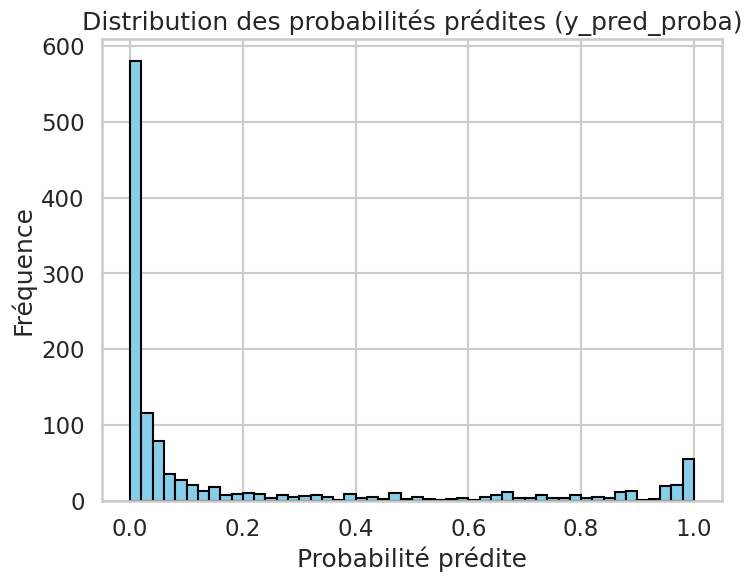

Seuil optimal (ROC AUC) : 0.20107686333762234
ROC AUC : 0.958738881765077
Matrice de confusion au seuil optimal :
[[871  56]
 [ 34 231]]

Rapport de classification au seuil optimal :
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       927
           1       0.80      0.87      0.84       265

    accuracy                           0.92      1192
   macro avg       0.88      0.91      0.89      1192
weighted avg       0.93      0.92      0.93      1192



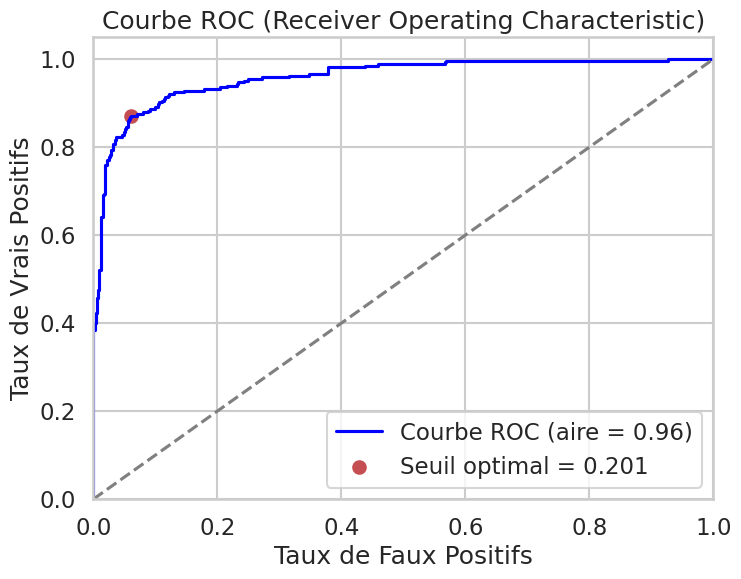

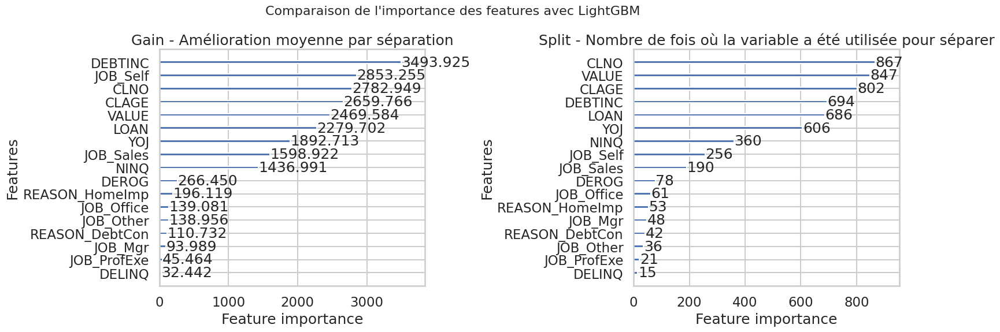

In [90]:
# Modèle LightGBM version sans SMOTE
# Étape 1 : Séparer la variable cible et les variables explicatives
X = df.drop(columns=['BAD', 'MORTDUE'])  # Exclure la variable cible et la variable MORTDUE des données
y = df['BAD']  # Variable cible

# Étape 2 : Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Étape 3 : Créer des méthodes d'imputation et de normalisation pour chaque groupe de variables
preprocessor = ColumnTransformer(
    transformers=[
        # Appliquer IterativeImputer avec BayesianRidge et RobustScaler pour les variables continues
        ('continuous', Pipeline([
            ('imputer', IterativeImputer(estimator=BayesianRidge())),  # Utiliser BayesianRidge pour imputer
            ('scaler', RobustScaler())  # Utiliser RobustScaler pour normaliser
        ]), continuous_vars),  # Appliqué aux variables continues

        # Appliquer SimpleImputer avec stratégie 'most_frequent' et OneHotEncoder pour les variables catégorielles
        ('categorical', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputation most frequent
            ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Encodage one-hot
        ]), categorical_vars),  # Appliqué aux variables catégorielles

        # Appliquer KNNImputer pour les variables ordinales (pas de scaling)
        ('ordinal', Pipeline([
            ('imputer', KNNImputer(n_neighbors=5))  # Utiliser KNNImputer pour les variables ordinales
        ]), ordinal_vars)  # Appliqué aux variables ordinales
    ]
)

# Étape 4 : Diviser les données en ensemble d'entraînement et de test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Étape 5 : Appliquer le prétraitement aux ensembles d'entraînement et de test
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Étape 6 : Entraîner le modèle LightGBM avec les données traitées
lgb_model = lgb.LGBMClassifier(
    learning_rate=0.1,  # Valeur obtenue par GridSearchCV
    max_depth=7,        # Valeur obtenue par GridSearchCV
    n_estimators=200,   # Valeur obtenue par GridSearchCV
    random_state=42
)

# Entraîner le modèle avec les données traitées
lgb_model.fit(X_train_processed, y_train)

# Étape 7 : Prédire sur l'ensemble de test
y_pred = lgb_model.predict(X_test_processed)

# Afficher le rapport de classification avec des indicateurs tels que la précision, le rappel, le F1-score
print("Rapport de classification :")
print(classification_report(y_test, y_pred))

# Afficher la matrice de confusion pour voir le nombre de True Positives, False Positives, False Negatives, True Negatives
print("Matrice de confusion :")
print(confusion_matrix(y_test, y_pred))

# Étape 8 : Prédire les probabilités sur l'ensemble de test encodé
y_pred_proba = lgb_model.predict_proba(X_test_processed)[:, 1]

# Étape 8.1 : Tracer un histogramme pour visualiser la distribution des probabilités prédites
plt.figure(figsize=(8, 6))
plt.hist(y_pred_proba, bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution des probabilités prédites (y_pred_proba)')
plt.xlabel('Probabilité prédite')
plt.ylabel('Fréquence')
plt.show()

# Étape 9 : Calculer le ROC AUC et trouver le seuil optimal
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Trouver le seuil optimal en optimisant la distance entre (TPR, FPR) et le point parfait (0,1)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

print(f'Seuil optimal (ROC AUC) : {optimal_threshold}')
print(f'ROC AUC : {roc_auc}')

# Étape 10 : Prédire les classes binaires avec le seuil optimal
y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)

# Étape 11 : Calculer la matrice de confusion au seuil optimal
cm = confusion_matrix(y_test, y_pred_optimal)
print("Matrice de confusion au seuil optimal :")
print(cm)

# Ou imprimer le rapport de classification complet
print("\nRapport de classification au seuil optimal :")
print(classification_report(y_test, y_pred_optimal))

# Étape 13 : Tracer la courbe ROC AUC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'Courbe ROC (aire = {roc_auc:.2f})')
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], marker='o', color='r', label=f'Seuil optimal = {optimal_threshold:.3f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Ligne à 45 degrés
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de Faux Positifs')
plt.ylabel('Taux de Vrais Positifs')
plt.title('Courbe ROC (Receiver Operating Characteristic)')
plt.legend(loc='best')
plt.show()

# Étape 14 : Afficher l'importance des caractéristiques avec les noms des variables
plt.figure(figsize=(16, 10))

#######################################################
# On veut lire le résultat par les noms des variables
# Étape 1 : Extraire les noms des variables après le prétraitement
# Noms des variables continues et ordinales (sans modification après prétraitement)
continuous_names = continuous_vars  # Noms des variables continues d'origine
ordinal_names = ordinal_vars  # Noms des variables ordinales d'origine

# Noms des variables catégoriques après OneHotEncoder
# Voici comment obtenir les noms des variables catégoriques après encodage
onehot_categorical_names = preprocessor.named_transformers_['categorical'].named_steps['encoder'].get_feature_names_out(categorical_vars)

# Étape 2 : Combiner tous les noms de variables en un seul tableau
# On combine les variables continues, ordinales et catégoriques encodées
feature_names = np.hstack([continuous_names, ordinal_names, onehot_categorical_names])
#######################################################

# Critère 1 : Gain (amélioration moyenne par séparation)
plt.subplot(2, 2, 1)
ax1 = lgb.plot_importance(lgb_model, importance_type='gain', title='Importance par Gain', ax=plt.gca())
plt.title("Gain - Amélioration moyenne par séparation")
yticks = ax1.get_yticklabels()
ax1.set_yticklabels([feature_names[int(tick.get_text().replace('Column_', ''))] for tick in yticks])

# Critère 2 : Split (nombre de fois où la variable a été utilisée pour séparer)
plt.subplot(2, 2, 2)
ax2 = lgb.plot_importance(lgb_model, importance_type='split', title='Importance par Split', ax=plt.gca())
plt.title("Split - Nombre de fois où la variable a été utilisée pour séparer")
yticks = ax2.get_yticklabels()
ax2.set_yticklabels([feature_names[int(tick.get_text().replace('Column_', ''))] for tick in yticks])

plt.tight_layout()
plt.suptitle("Comparaison de l'importance des features avec LightGBM", fontsize=16, y=1.02)
plt.show()

## Optimisation du modèle LightGBM

De même manière en XGBoost, on a 2 idées pour optimiser la performance du modèle.

**Idée 1** : On souhaite voir comment le SMOTE optimise la métrique 'recall'.

[LightGBM] [Info] Number of positive: 3844, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3548
[LightGBM] [Info] Number of data points in the train set: 7688, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

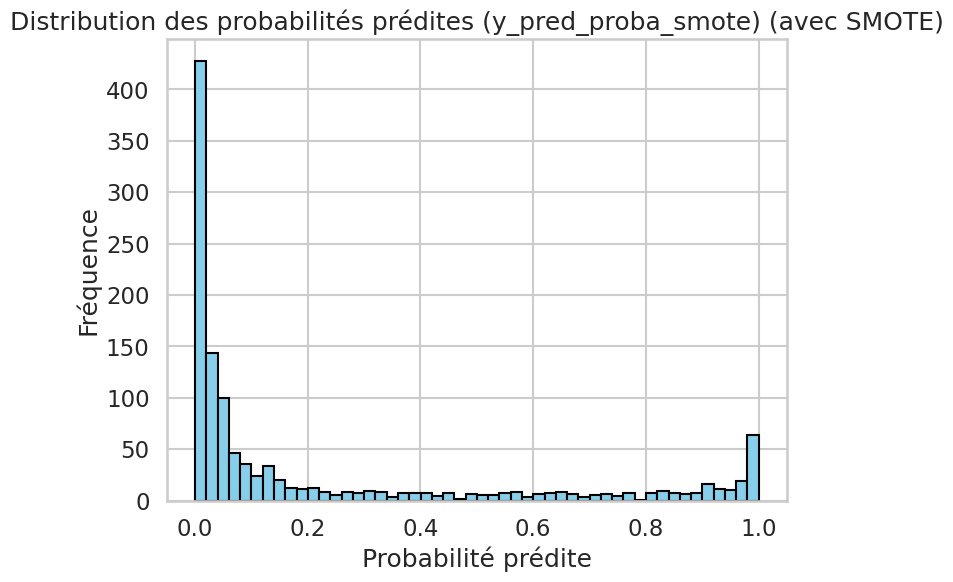

Seuil optimal (ROC AUC) avec SMOTE : 0.2391086058727581
ROC AUC (avec SMOTE) : 0.956426695976064
Matrice de confusion au seuil optimal (avec SMOTE) :
[[850  77]
 [ 24 241]]

Rapport de classification au seuil optimal :
              precision    recall  f1-score   support

           0       0.97      0.92      0.94       927
           1       0.76      0.91      0.83       265

    accuracy                           0.92      1192
   macro avg       0.87      0.91      0.89      1192
weighted avg       0.92      0.92      0.92      1192



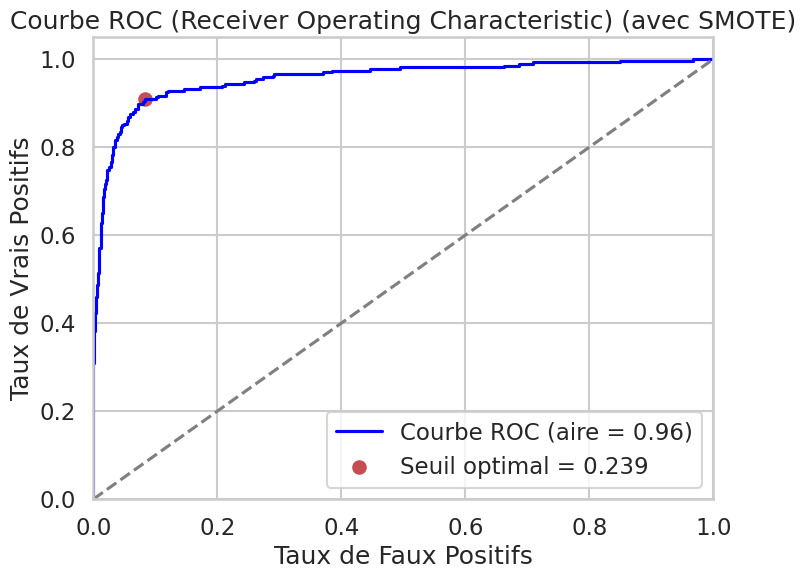

In [89]:
# Modèle LightGBM avec SMOTE
# Étape 1 : Séparer la variable cible et les variables explicatives
X = df.drop(columns=['BAD', 'MORTDUE'])  # Exclure la variable cible et la variable MORTDUE des données
y = df['BAD']  # Variable cible

# Étape 2 : Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Étape 3 : Créer des méthodes d'imputation et de normalisation pour chaque groupe de variables
preprocessor = ColumnTransformer(
    transformers=[
        # Appliquer IterativeImputer avec BayesianRidge et RobustScaler pour les variables continues
        ('continuous', Pipeline([
            ('imputer', IterativeImputer(estimator=BayesianRidge())),  # Utiliser BayesianRidge pour imputer
            ('scaler', RobustScaler())  # Utiliser RobustScaler pour normaliser
        ]), continuous_vars),  # Appliqué aux variables continues

        # Appliquer SimpleImputer avec stratégie 'most_frequent' et OneHotEncoder pour les variables catégorielles
        ('categorical', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputation most frequent
            ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Encodage one-hot
        ]), categorical_vars),  # Appliqué aux variables catégorielles

        # Appliquer KNNImputer pour les variables ordinales (pas de scaling)
        ('ordinal', Pipeline([
            ('imputer', KNNImputer(n_neighbors=5))  # Utiliser KNNImputer pour les variables ordinales
        ]), ordinal_vars)  # Appliqué aux variables ordinales
    ]
)

# Étape 4 : Diviser les données en ensemble d'entraînement et de test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Étape 5 : Appliquer le prétraitement aux ensembles d'entraînement et de test
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Étape 6 : Appliquer SMOTE pour traiter le déséquilibre des classes après le prétraitement
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_processed, y_train)

# Étape 7 : Entraîner le modèle LightGBM avec les données traitées par SMOTE
lgb_model_smote = lgb.LGBMClassifier(
    learning_rate=0.1,  # Valeur obtenue par GridSearchCV
    max_depth=7,        # Valeur obtenue par GridSearchCV
    n_estimators=200,   # Valeur obtenue par GridSearchCV
    random_state=42
)

# Entraîner le modèle avec les données traitées par SMOTE
lgb_model_smote.fit(X_train_smote, y_train_smote)

# Étape 8 : Prédire sur l'ensemble de test
y_pred_smote = lgb_model_smote.predict(X_test_processed)

# Afficher le rapport de classification avec des indicateurs tels que la précision, le rappel, le F1-score
print("Rapport de classification (avec SMOTE) :")
print(classification_report(y_test, y_pred_smote))

# Afficher la matrice de confusion pour voir le nombre de True Positives, False Positives, False Negatives, True Negatives
print("Matrice de confusion (avec SMOTE) :")
print(confusion_matrix(y_test, y_pred_smote))

# Étape 9 : Prédire les probabilités sur l'ensemble de test encodé
y_pred_proba_smote = lgb_model_smote.predict_proba(X_test_processed)[:, 1]

# Étape 9.1 : Tracer un histogramme pour visualiser la distribution des probabilités prédites
plt.figure(figsize=(8, 6))
plt.hist(y_pred_proba_smote, bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution des probabilités prédites (y_pred_proba_smote) (avec SMOTE)')
plt.xlabel('Probabilité prédite')
plt.ylabel('Fréquence')
plt.show()

# Étape 10 : Calculer le ROC AUC et trouver le seuil optimal
fpr_smote, tpr_smote, thresholds_smote = roc_curve(y_test, y_pred_proba_smote)
roc_auc_smote = auc(fpr_smote, tpr_smote)

# Trouver le seuil optimal en optimisant la distance entre (TPR, FPR) et le point parfait (0,1)
optimal_idx_smote = np.argmax(tpr_smote - fpr_smote)
optimal_threshold_smote = thresholds_smote[optimal_idx_smote]

print(f'Seuil optimal (ROC AUC) avec SMOTE : {optimal_threshold_smote}')
print(f'ROC AUC (avec SMOTE) : {roc_auc_smote}')

# Étape 11 : Prédire les classes binaires avec le seuil optimal
y_pred_optimal_smote = (y_pred_proba_smote >= optimal_threshold_smote).astype(int)

# Étape 12 : Calculer la matrice de confusion avec le seuil optimal
cm_smote = confusion_matrix(y_test, y_pred_optimal_smote)
print("Matrice de confusion au seuil optimal (avec SMOTE) :")
print(cm_smote)

# Ou imprimer le rapport de classification complet
print("\nRapport de classification au seuil optimal :")
print(classification_report(y_test, y_pred_optimal_smote))

# Étape 13 : Tracer la courbe ROC AUC
plt.figure(figsize=(8, 6))
plt.plot(fpr_smote, tpr_smote, color='blue', label=f'Courbe ROC (aire = {roc_auc_smote:.2f})')
plt.scatter(fpr_smote[optimal_idx_smote], tpr_smote[optimal_idx_smote], marker='o', color='r', label=f'Seuil optimal = {optimal_threshold_smote:.3f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Ligne à 45 degrés
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de Faux Positifs')
plt.ylabel('Taux de Vrais Positifs')
plt.title('Courbe ROC (Receiver Operating Characteristic) (avec SMOTE)')
plt.legend(loc='best')
plt.show()


**Idée 2** : On va équilibre le poids entre 2 classes et voir l'effet sur la performace.

[LightGBM] [Info] Number of positive: 924, number of negative: 3844
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1675
[LightGBM] [Info] Number of data points in the train set: 4768, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.193792 -> initscore=-1.425557
[LightGBM] [Info] Start training from score -1.425557
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

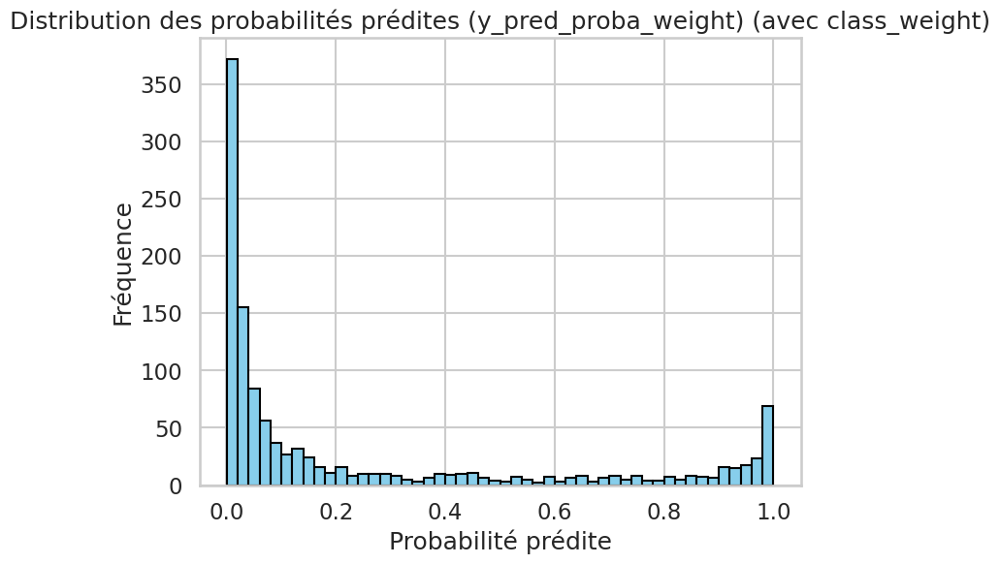

Seuil optimal (ROC AUC) avec class_weight : 0.3721303251899397
ROC AUC (avec class_weight) : 0.9575583643727993
Matrice de confusion au seuil optimal (avec class_weight) :
[[858  69]
 [ 27 238]]

Rapport de classification au seuil optimal :
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       927
           1       0.78      0.90      0.83       265

    accuracy                           0.92      1192
   macro avg       0.87      0.91      0.89      1192
weighted avg       0.93      0.92      0.92      1192



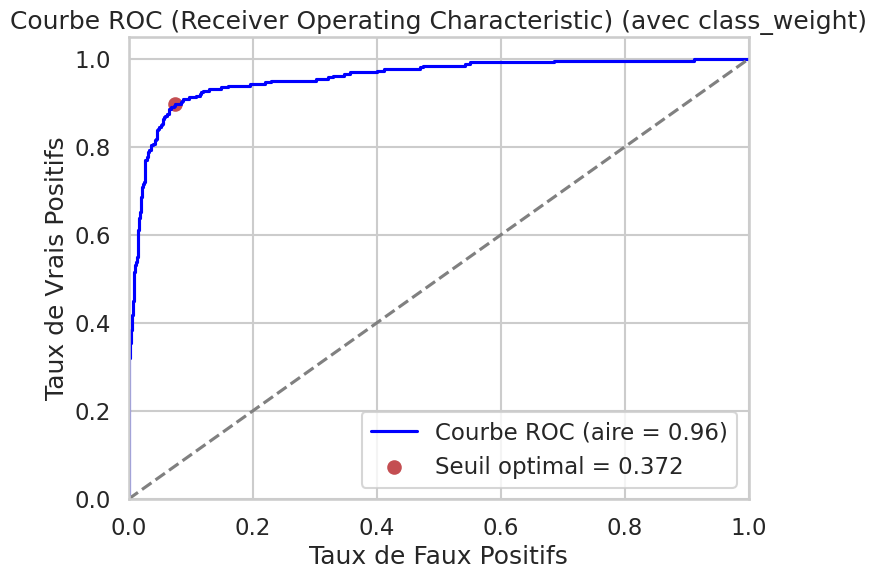

In [85]:
# Modèle LightGBM avec class_weight
# Étape 1 : Séparer la variable cible et les variables explicatives
X = df.drop(columns=['BAD', 'MORTDUE'])  # Exclure la variable cible et la variable MORTDUE des données
y = df['BAD']  # Variable cible

# Étape 2 : Définir les groupes de variables
numeric_features = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO', 'DEROG', 'DELINQ']
continuous_vars = ['LOAN', 'VALUE', 'YOJ', 'DEBTINC', 'CLAGE', 'NINQ', 'CLNO']
ordinal_vars = ['DEROG', 'DELINQ']
categorical_vars = ['REASON', 'JOB']

# Étape 3 : Créer des méthodes d'imputation et de normalisation pour chaque groupe de variables
preprocessor = ColumnTransformer(
    transformers=[
        # Appliquer IterativeImputer avec BayesianRidge et RobustScaler pour les variables continues
        ('continuous', Pipeline([
            ('imputer', IterativeImputer(estimator=BayesianRidge())),  # Utiliser BayesianRidge pour imputer
            ('scaler', RobustScaler())  # Utiliser RobustScaler pour normaliser
        ]), continuous_vars),  # Appliqué aux variables continues

        # Appliquer SimpleImputer avec stratégie 'most_frequent' et OneHotEncoder pour les variables catégorielles
        ('categorical', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Imputation most frequent
            ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Encodage one-hot
        ]), categorical_vars),  # Appliqué aux variables catégorielles

        # Appliquer KNNImputer pour les variables ordinales (pas de scaling)
        ('ordinal', Pipeline([
            ('imputer', KNNImputer(n_neighbors=5))  # Utiliser KNNImputer pour les variables ordinales
        ]), ordinal_vars)  # Appliqué aux variables ordinales
    ]
)

# Étape 4 : Diviser les données en ensemble d'entraînement et de test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Étape 5 : Appliquer le prétraitement aux ensembles d'entraînement et de test
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Étape 6 : Utiliser le class_weight pour équilibrer les classes sans SMOTE
# Nous utilisons scale_pos_weight pour équilibrer les classes avec un ratio 50/50
# La formule pour scale_pos_weight est : scale_pos_weight = (n_samples - n_pos) / n_pos

# Calculer scale_pos_weight basé sur les données d'entraînement
n_pos = sum(y_train)
n_neg = len(y_train) - n_pos
scale_pos_weight = n_neg / n_pos  # Ici, nous ajustons le ratio des classes pour être équilibré

# Étape 7 : Entraîner le modèle LightGBM avec class_weight
lgb_model_weight = lgb.LGBMClassifier(
    learning_rate=0.1,       # Valeur obtenue par GridSearchCV
    max_depth=7,             # Valeur obtenue par GridSearchCV
    n_estimators=200,        # Valeur obtenue par GridSearchCV
    scale_pos_weight=scale_pos_weight,  # Utilisation de class weight pour équilibrer les classes
    random_state=42
)

# Entraîner le modèle avec les données traitées sans SMOTE mais avec scale_pos_weight
lgb_model_weight.fit(X_train_processed, y_train)

# Étape 8 : Prédire sur l'ensemble de test
y_pred_weight = lgb_model_weight.predict(X_test_processed)

# Afficher le rapport de classification avec des indicateurs tels que la précision, le rappel, le F1-score
print("Rapport de classification (avec class_weight) :")
print(classification_report(y_test, y_pred_weight))

# Afficher la matrice de confusion pour voir le nombre de True Positives, False Positives, False Negatives, True Negatives
print("Matrice de confusion (avec class_weight) :")
print(confusion_matrix(y_test, y_pred_weight))

# Étape 9 : Prédire les probabilités sur l'ensemble de test encodé
y_pred_proba_weight = lgb_model_weight.predict_proba(X_test_processed)[:, 1]

# Étape 9.1 : Tracer un histogramme pour visualiser la distribution des probabilités prédites
plt.figure(figsize=(8, 6))
plt.hist(y_pred_proba_weight, bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution des probabilités prédites (y_pred_proba_weight) (avec class_weight)')
plt.xlabel('Probabilité prédite')
plt.ylabel('Fréquence')
plt.show()

# Étape 10 : Calculer le ROC AUC et trouver le seuil optimal
fpr_weight, tpr_weight, thresholds_weight = roc_curve(y_test, y_pred_proba_weight)
roc_auc_weight = auc(fpr_weight, tpr_weight)

# Trouver le seuil optimal en optimisant la distance entre (TPR, FPR) et le point parfait (0,1)
optimal_idx_weight = np.argmax(tpr_weight - fpr_weight)
optimal_threshold_weight = thresholds_weight[optimal_idx_weight]

print(f'Seuil optimal (ROC AUC) avec class_weight : {optimal_threshold_weight}')
print(f'ROC AUC (avec class_weight) : {roc_auc_weight}')

# Étape 11 : Prédire les classes binaires avec le seuil optimal
y_pred_optimal_weight = (y_pred_proba_weight >= optimal_threshold_weight).astype(int)

# Étape 12 : Calculer la matrice de confusion avec le seuil optimal
cm_weight = confusion_matrix(y_test, y_pred_optimal_weight)
print("Matrice de confusion au seuil optimal (avec class_weight) :")
print(cm_weight)

# Ou imprimer le rapport de classification complet
print("\nRapport de classification au seuil optimal :")
print(classification_report(y_test, y_pred_optimal_weight))

# Étape 13 : Tracer la courbe ROC AUC
plt.figure(figsize=(8, 6))
plt.plot(fpr_weight, tpr_weight, color='blue', label=f'Courbe ROC (aire = {roc_auc_weight:.2f})')
plt.scatter(fpr_weight[optimal_idx_weight], tpr_weight[optimal_idx_weight], marker='o', color='r', label=f'Seuil optimal = {optimal_threshold_weight:.3f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Ligne à 45 degrés
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de Faux Positifs')
plt.ylabel('Taux de Vrais Positifs')
plt.title('Courbe ROC (Receiver Operating Characteristic) (avec class_weight)')
plt.legend(loc='best')
plt.show()

,Accuracy,Precision,Recall,F1-Score,ROC AUC
Avec SMOTE,0.93,0.89,0.78,0.83,0.96
Sans SMOTE,0.92,0.92,0.71,0.80,0.96
Avec Class Weight,0.93,0.85,0.81,0.83,0.96


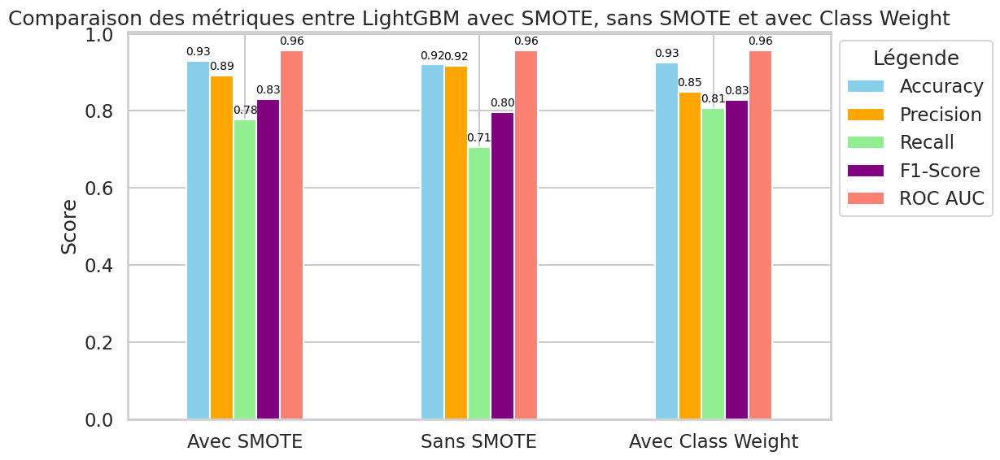

In [86]:
# Comparer les résultats entre la version avec SMOTE, sans SMOTE et avec class_weight
comparison_metrics_lgbm = {
    "Accuracy": [
        accuracy_score(y_test, y_pred_smote),
        accuracy_score(y_test, y_pred),
        accuracy_score(y_test, y_pred_weight)
    ],
    "Precision": [
        precision_score(y_test, y_pred_smote),
        precision_score(y_test, y_pred),
        precision_score(y_test, y_pred_weight)
    ],
    "Recall": [
        recall_score(y_test, y_pred_smote),
        recall_score(y_test, y_pred),
        recall_score(y_test, y_pred_weight)
    ],
    "F1-Score": [
        f1_score(y_test, y_pred_smote),
        f1_score(y_test, y_pred),
        f1_score(y_test, y_pred_weight)
    ],
    "ROC AUC": [
        roc_auc_smote,
        roc_auc,
        roc_auc_weight
    ]
}

# Créer un DataFrame pour afficher les résultats
df_comparison_metrics_lgbm = pd.DataFrame(comparison_metrics_lgbm, index=["Avec SMOTE", "Sans SMOTE", "Avec Class Weight"])
display(df_comparison_metrics_lgbm)

# Tracer un graphique en barres pour comparer les métriques entre les trois modèles
ax = df_comparison_metrics_lgbm.plot(kind="bar", figsize=(12, 6), color=['skyblue', 'orange', 'lightgreen', 'purple', 'salmon'])
plt.title("Comparaison des métriques entre LightGBM avec SMOTE, sans SMOTE et avec Class Weight")
plt.ylabel("Score")
plt.xticks(rotation=0)  # Rotation des étiquettes de l'axe des X

# Ajouter des annotations sur chaque barre
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=10, color='black',
                xytext=(0, 5), textcoords='offset points')

# Ajuster la légende et la mise en page
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title="Légende")
plt.tight_layout()  # Pour éviter les chevauchements
plt.show()

## Grille de score à partir de modèle LightGBM

Comme dans le cas de XGBClassifier, on décide de choisir la version avec class_weight pour générer la grille de score.

In [87]:
# Prédire les étiquettes sur l'ensemble d'entraînement avec le modèle utilisant class_weight (LightGBM)
y_pred_train_weight = lgb_model_weight.predict(X_train_processed)

# Fusionner les colonnes de X_train avec y_train réel et les étiquettes prédites par LightGBM avec class_weight
df_results_weight = pd.DataFrame(X_train, columns=continuous_vars + categorical_vars + ordinal_vars)  # Ajouter toutes les variables explicatives
df_results_weight['y_true'] = y_train.values  # Ajouter la colonne de la cible réelle
df_results_weight['y_pred'] = y_pred_train_weight  # Ajouter la colonne des prédictions

# Grouper par les variables catégorielles et ordinales
group_vars = categorical_vars + ordinal_vars  # Combiner les variables catégorielles et ordinales

# Étape 1 : Calculer le Taux de Défaut (Default Rate) pour chaque groupe
taux_de_defaut_weight = df_results_weight.groupby(group_vars).apply(lambda group: np.mean(group['y_true']))

# Étape 2 : Calculer la Contribution (basée sur le Taux de Défaut)
contribution_weight = taux_de_defaut_weight / taux_de_defaut_weight.sum() * 100  # Contribution calculée en %

# Étape 3 : Calculer l'Effetif (distribution du nombre d'échantillons dans chaque groupe de modalité)
effectif_weight = df_results_weight.groupby(group_vars).size() / len(df_results_weight) * 100  # Calculer le % de chaque groupe

# Étape 4 : Créer le DataFrame de la Grille de Score pour class_weight
grille_de_score_lightgbm_weight = pd.DataFrame({
    'Taux de défaut (%)': taux_de_defaut_weight * 100,  # Convertir en %
    'Contribution (%)': contribution_weight,
    'Effectif (%)': effectif_weight
})

# Afficher la Grille de Score
print(grille_de_score_lightgbm_weight)

# Si l'on souhaite l'exporter en fichier Excel pour des ajustements
grille_de_score_lightgbm_weight.to_excel('grille_de_score_lightgbm_weight.xlsx')
files.download('grille_de_score_lightgbm_weight.xlsx')

                           Taux de défaut (%)  Contribution (%)  Effectif (%)
REASON  JOB  DEROG DELINQ                                                    
DebtCon Mgr  0.00  0.00                 10.04              0.07          5.85
                   1.00                 22.58              0.15          0.65
                   2.00                 37.50              0.25          0.17
                   3.00                100.00              0.66          0.06
                   4.00                100.00              0.66          0.04
...                                       ...               ...           ...
HomeImp Self 0.00  2.00                100.00              0.66          0.02
                   6.00                100.00              0.66          0.02
                   7.00                100.00              0.66          0.02
             1.00  0.00                 18.18              0.12          0.23
                   7.00                100.00              0.66 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Evaluation et comparaison des performances entre des modèles Gradient Boosting

,LightGBM,XGBoost
Accuracy,0.93,0.93
Precision,0.85,0.89
Recall,0.81,0.80
F1-Score,0.83,0.84
ROC AUC,0.96,0.96


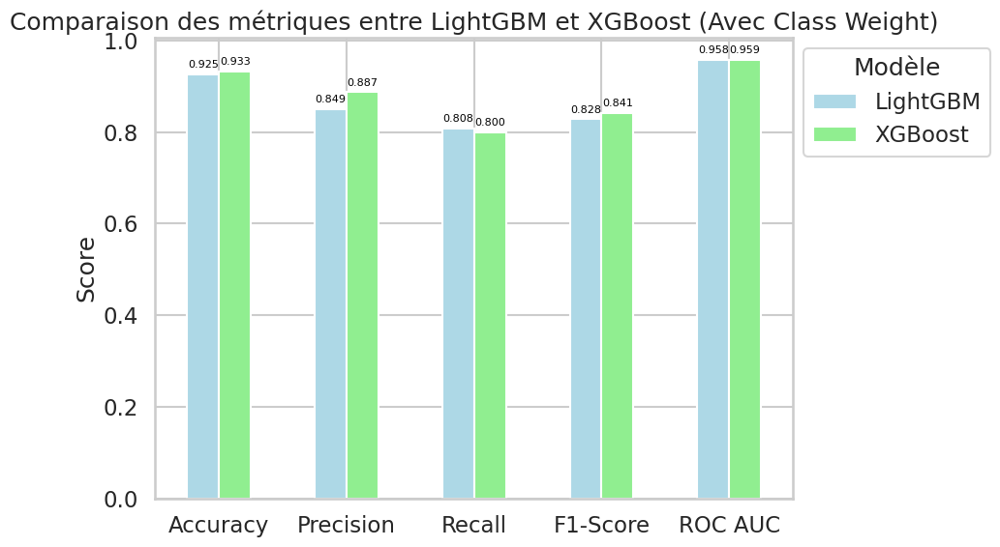

In [88]:
# Extraire les résultats pour le groupe "Avec Class Weight"
comparison_class_weight = {
    "LightGBM": {
        "Accuracy": comparison_metrics_lgbm["Accuracy"][2],  # L'index 2 correspond à "Avec Class Weight"
        "Precision": comparison_metrics_lgbm["Precision"][2],
        "Recall": comparison_metrics_lgbm["Recall"][2],
        "F1-Score": comparison_metrics_lgbm["F1-Score"][2],
        "ROC AUC": comparison_metrics_lgbm["ROC AUC"][2]
    },
    "XGBoost": {
        "Accuracy": comparison_metrics_xgb["Accuracy"][2],  # L'index 2 correspond à "Avec Class Weight"
        "Precision": comparison_metrics_xgb["Precision"][2],
        "Recall": comparison_metrics_xgb["Recall"][2],
        "F1-Score": comparison_metrics_xgb["F1-Score"][2],
        "ROC AUC": comparison_metrics_xgb["ROC AUC"][2]
    }
}

# Créer un DataFrame pour comparer les résultats entre LightGBM et XGBoost pour "Avec Class Weight"
df_comparison_class_weight = pd.DataFrame(comparison_class_weight)

# Afficher le DataFrame
display(df_comparison_class_weight)

# Tracer un graphique en barres pour comparer les métriques entre LightGBM et XGBoost pour "Avec Class Weight"
ax = df_comparison_class_weight.plot(kind="bar", figsize=(10, 6), color=['lightblue', 'lightgreen'])
plt.title("Comparaison des métriques entre LightGBM et XGBoost (Avec Class Weight)")
plt.ylabel("Score")
plt.xticks(rotation=0)  # Rotation des étiquettes de l'axe des X

# Ajouter des annotations sur chaque barre
for p in ax.patches:
    ax.annotate(f'{p.get_height():.3f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=8, color='black', xytext=(0, 5),
                textcoords='offset points')

# Ajuster la légende et la mise en page
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title="Modèle")
plt.tight_layout()  # Pour éviter les chevauchements
plt.show()